# Machine Learning Project - Supervised Learning

## Stock Market Price Analysis and Prediction Based on Twitter Data

### Team Members 

B.Thilaknath Reddy     - CB.EN.U4CSE21010<br>
B.Sri Ganesh           - CB.EN.U4CSE21011<br>
S.V.S Krishna Aditya   - CB.EN.U4CSE21051<br>
T.Vinay Kumar          - CB.EN.U4CSE21063<br>
Vedant D.J             - CB.EN.U4CSE21067<br>

#### Importing Libraries

In [268]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import sys
import seaborn as sns
import sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

### Data Collection 

In [269]:
ggl = pd.read_csv("Datasets/Google.csv")
inf= pd.read_csv('Datasets/Infosys1.csv')
tsl = pd.read_csv('Datasets/Tesla.csv')
facebook_data= pd.read_csv('Datasets/FaceBook.csv')
f1=facebook_data.head(716)


In [270]:
ggl

,Date,Open,High,Low,Close,Adj Close,Volume
0,02-11-2018,778.200012,781.650024,763.450012,768.700012,768.700012,1872400.0
1,03-11-2018,767.250000,769.950012,759.030029,762.130005,762.130005,1943200.0
2,04-11-2018,750.659973,770.359985,750.560974,762.020020,762.020020,2134800.0
3,05-11-2018,774.500000,785.190002,772.549988,782.520020,782.520020,1585100.0
4,06-11-2018,783.400024,795.632996,780.190002,790.510010,790.510010,1350800.0
...,...,...,...,...,...,...,...
1576,25-02-2023,750.659973,770.359985,750.560974,762.020020,762.020020,2134800.0
1577,26-02-2023,774.500000,785.190002,772.549988,782.520020,782.520020,1585100.0
1578,27-02-2023,783.400024,795.632996,780.190002,790.510010,790.510010,1350800.0
1579,28-02-2023,779.940002,791.226990,771.669983,785.309998,785.309998,2607100.0


In [271]:
inf

,Date,Open,High,Low,Close,Adj Close,Volume
0,13-07-2018,9.560000,9.815000,9.550000,9.710000,9.423450,27224000.0
1,16-07-2018,9.865000,9.885000,9.770000,9.800000,9.510794,14771800.0
2,17-07-2018,NaN,NaN,9.760000,9.950000,NaN,12135400.0
3,18-07-2018,9.880000,9.910000,9.830000,9.840000,9.549613,5833800.0
4,19-07-2018,9.720000,NaN,9.720000,NaN,9.564170,14995000.0
...,...,...,...,...,...,...,...
1225,25-02-2023,10.444336,10.548506,9.282621,11.044794,9.819848,16015899.0
1226,26-02-2023,10.345721,9.953462,10.848963,10.077279,9.661870,13302455.0
1227,27-02-2023,11.235720,10.028721,9.456381,9.322893,11.088884,16665340.0
1228,28-02-2023,10.265177,9.872878,10.245836,9.691520,9.653493,17364514.0


In [272]:
tsl

,Date,Open,High,Low,Close,Adj Close,Volume
0,23-03-2018,311.25,311.250000,300.450012,301.540009,301.540009,6654900
1,26-03-2018,307.34,307.589996,291.359985,304.179993,304.179993,8375200
2,27-03-2018,304.00,304.269989,277.179993,279.179993,279.179993,13872000
3,28-03-2018,264.58,268.679993,252.100006,257.779999,257.779999,21001400
4,29-03-2018,256.49,270.959991,248.210007,266.130005,266.130005,15170700
...,...,...,...,...,...,...,...
1306,25-02-2023,369.66,338.340000,315.260000,338.970000,316.400000,7139012
1307,26-02-2023,313.00,331.430000,336.660000,282.920000,378.400000,27433166
1308,27-02-2023,309.51,371.090000,324.340000,377.930000,303.780000,28652852
1309,28-02-2023,329.84,277.400000,294.100000,265.620000,251.350000,6539378


In [273]:
f1

,Date,Open,High,Low,Close,Adj Close,Volume
0,23-05-2018,182.50,186.91,182.18,186.90,186.90,16628100
1,24-05-2018,185.88,186.80,185.03,185.93,185.93,12354700
2,25-05-2018,186.02,186.33,184.45,184.92,184.92,10965100
3,29-05-2018,184.34,186.81,183.71,185.74,185.74,16398900
4,30-05-2018,186.54,188.00,185.25,187.67,187.67,13736900
...,...,...,...,...,...,...,...
711,24-02-2023,199.91,112.37,145.21,187.95,125.48,36895152
712,25-02-2023,198.51,104.36,158.74,193.10,174.24,50224262
713,26-02-2023,199.76,108.76,137.36,144.19,146.21,105477729
714,27-02-2023,200.00,117.53,156.00,160.76,155.85,43542862


### Analysing the collected data(PreProcessing)

In [274]:
ggl.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [275]:
inf.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [276]:
tsl.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [277]:
f1.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [278]:
ggl.index

RangeIndex(start=0, stop=1581, step=1)

In [279]:
inf.index

RangeIndex(start=0, stop=1230, step=1)

In [280]:
tsl.index

RangeIndex(start=0, stop=1311, step=1)

In [281]:
f1.index

RangeIndex(start=0, stop=716, step=1)

In [282]:
ggl.shape

(1581, 7)

In [283]:
inf.shape

(1230, 7)

In [284]:
tsl.shape

(1311, 7)

In [285]:
f1.shape

(716, 7)

In [286]:
ggl.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1581.000000,1581.000000,1581.000000,1581.000000,1581.000000,1.581000e+03
mean,842.819675,855.973127,837.927685,845.073172,845.494988,2.071469e+06
std,71.601876,78.841353,73.610115,74.592589,74.760081,1.146604e+06
min,744.590027,754.000000,727.539978,736.080017,736.080017,5.874000e+05
25%,790.900024,797.659973,785.020020,790.510010,790.856601,1.231500e+06
50%,823.020020,829.000000,818.979980,823.869995,824.159973,1.640200e+06
75%,891.830451,920.214582,895.561564,906.690002,899.151157,2.628670e+06
max,1017.210022,1048.390015,1016.950012,1025.500000,1025.500000,5.167700e+06


In [287]:
inf.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1227.000000,1226.000000,1227.000000,1227.000000,1229.000000,1.229000e+03
mean,10.186918,10.299755,10.060642,10.160569,10.063683,1.966095e+07
std,0.655054,0.687949,0.674361,0.670542,0.705644,1.135239e+07
min,8.990000,9.050000,8.850000,8.970000,8.792632,3.158400e+06
25%,9.628950,9.746381,9.484238,9.583511,9.468933,9.404202e+06
50%,10.230000,10.326808,10.098171,10.210410,10.059291,1.743149e+07
75%,10.712173,10.830000,10.620000,10.700000,10.650001,2.951329e+07
max,11.340000,11.560000,11.270000,11.400000,11.400000,4.138570e+07


In [288]:
tsl.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1311.000000,1311.000000,1311.000000,1311.000000,1311.000000,1.311000e+03
mean,312.535408,321.675294,303.508757,315.208726,313.704439,1.662193e+07
std,34.473853,35.422889,34.121306,35.467846,36.233420,9.043739e+06
min,252.780000,260.329987,244.589996,250.559998,250.559998,3.080700e+06
25%,283.760000,292.200006,275.305000,286.005000,283.810005,8.211206e+06
50%,311.160000,318.880005,300.320000,313.390000,310.920000,1.543340e+07
75%,343.380000,351.235000,332.665000,345.510000,344.139999,2.441596e+07
max,375.000000,387.459991,367.119995,379.570007,379.570007,3.364970e+07


In [289]:
f1.describe()

,Open,High,Low,Close,Adj Close,Volume
count,716.000000,716.000000,716.000000,716.000000,716.000000,7.160000e+02
mean,183.795489,139.353003,164.060098,163.195880,161.891327,6.495529e+07
std,18.950828,30.171791,21.897964,22.743878,22.755294,4.999766e+07
min,123.100000,100.000000,120.590000,120.050000,120.300000,7.297400e+06
25%,172.302500,111.577500,147.000000,144.170000,144.037500,2.082483e+07
50%,192.520000,134.540000,164.835000,164.060000,162.620000,4.496529e+07
75%,198.942500,163.675000,181.700000,182.737500,180.507500,1.064302e+08
max,215.720000,218.620000,214.270000,217.500000,217.500000,1.698037e+08


In [290]:
ggl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1581 entries, 0 to 1580
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1581 non-null   object 
 1   Open       1581 non-null   float64
 2   High       1581 non-null   float64
 3   Low        1581 non-null   float64
 4   Close      1581 non-null   float64
 5   Adj Close  1581 non-null   float64
 6   Volume     1581 non-null   float64
dtypes: float64(6), object(1)
memory usage: 86.6+ KB


In [291]:
inf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1230 entries, 0 to 1229
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1230 non-null   object 
 1   Open       1227 non-null   float64
 2   High       1226 non-null   float64
 3   Low        1227 non-null   float64
 4   Close      1227 non-null   float64
 5   Adj Close  1229 non-null   float64
 6   Volume     1229 non-null   float64
dtypes: float64(6), object(1)
memory usage: 67.4+ KB


In [292]:
tsl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1311 entries, 0 to 1310
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1311 non-null   object 
 1   Open       1311 non-null   float64
 2   High       1311 non-null   float64
 3   Low        1311 non-null   float64
 4   Close      1311 non-null   float64
 5   Adj Close  1311 non-null   float64
 6   Volume     1311 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 71.8+ KB


In [293]:
f1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 716 entries, 0 to 715
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       716 non-null    object 
 1   Open       716 non-null    float64
 2   High       716 non-null    float64
 3   Low        716 non-null    float64
 4   Close      716 non-null    float64
 5   Adj Close  716 non-null    float64
 6   Volume     716 non-null    int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 39.3+ KB


In [294]:
ggl.describe(include = ['object'])


,Date
count,1581
unique,1581
top,02-11-2018
freq,1


In [295]:
inf.describe(include = ['object'])


,Date
count,1230
unique,1230
top,13-07-2018
freq,1


In [296]:
tsl.describe(include = ['object'])


,Date
count,1311
unique,1311
top,23-03-2018
freq,1


In [297]:
f1.describe(include = ['object'])


,Date
count,716
unique,716
top,23-05-2018
freq,1


In [298]:
ggl.isnull().sum().to_frame()

,0
Date,0
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


In [299]:
inf.isnull().sum().to_frame()

,0
Date,0
Open,3
High,4
Low,3
Close,3
Adj Close,1
Volume,1


In [300]:
tsl.isnull().sum().to_frame()

,0
Date,0
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


In [301]:
f1.isnull().sum().to_frame()

,0
Date,0
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


In [302]:
inf['High'].replace(True, float('nan'), inplace=True)
inf['Low'].replace(True, float('nan'), inplace=True)
inf['High'].interpolate(method='linear', inplace=True)
inf['Low'].interpolate(method='linear', inplace=True)
inf['Volume'].interpolate(method='linear', inplace=True)


mean_open = inf['Open'].mean()
mean_close = inf['Close'].mean()
mean_adj_close = inf['Adj Close'].mean()


inf['Open'].fillna(mean_open, inplace=True)
inf['Close'].fillna(mean_close, inplace=True)
inf['Adj Close'].fillna(mean_adj_close, inplace=True)


inf.isnull().sum().to_frame()

,0
Date,0
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


### Checking The Data Column

In [303]:
try:
    pd.to_datetime(ggl['Date'], format='%d-%m-%Y')
    print("All values in the 'Date' column are in date format.")
except ValueError:
    print("Some values in the 'Date' column are not in date format.")


All values in the 'Date' column are in date format.


In [304]:
try:
    pd.to_datetime(inf['Date'], format='%d-%m-%Y')
    print("All values in the 'Date' column are in date format.")
except ValueError:
    print("Some values in the 'Date' column are not in date format.")


All values in the 'Date' column are in date format.


In [305]:
try:
    pd.to_datetime(tsl['Date'], format='%d-%m-%Y')
    print("All values in the 'Date' column are in date format.")
except ValueError:
    print("Some values in the 'Date' column are not in date format.")


All values in the 'Date' column are in date format.


In [306]:
try:
    pd.to_datetime(f1['Date'], format='%d-%m-%Y')
    print("All values in the 'Date' column are in date format.")
except ValueError:
    print("Some values in the 'Date' column are not in date format.")


All values in the 'Date' column are in date format.


### Feature engineering

In [307]:
ggl['Price Change'] = ggl['Close'] - ggl['Open']
ggl['Percentage Change'] = (ggl['Price Change'] / ggl['Open']) * 100
ggl

,Date,Open,High,Low,Close,Adj Close,Volume,Price Change,Percentage Change
0,02-11-2018,778.200012,781.650024,763.450012,768.700012,768.700012,1872400.0,-9.500000,-1.220766
1,03-11-2018,767.250000,769.950012,759.030029,762.130005,762.130005,1943200.0,-5.119995,-0.667318
2,04-11-2018,750.659973,770.359985,750.560974,762.020020,762.020020,2134800.0,11.360047,1.513341
3,05-11-2018,774.500000,785.190002,772.549988,782.520020,782.520020,1585100.0,8.020020,1.035509
4,06-11-2018,783.400024,795.632996,780.190002,790.510010,790.510010,1350800.0,7.109986,0.907581
...,...,...,...,...,...,...,...,...,...
1576,25-02-2023,750.659973,770.359985,750.560974,762.020020,762.020020,2134800.0,11.360047,1.513341
1577,26-02-2023,774.500000,785.190002,772.549988,782.520020,782.520020,1585100.0,8.020020,1.035509
1578,27-02-2023,783.400024,795.632996,780.190002,790.510010,790.510010,1350800.0,7.109986,0.907581
1579,28-02-2023,779.940002,791.226990,771.669983,785.309998,785.309998,2607100.0,5.369996,0.688514


In [308]:
inf['Price Change'] = inf['Close'] - inf['Open']
inf['Percentage Change'] = (inf['Price Change'] / inf['Open']) * 100
inf

,Date,Open,High,Low,Close,Adj Close,Volume,Price Change,Percentage Change
0,13-07-2018,9.560000,9.815000,9.550000,9.710000,9.423450,27224000.0,0.150000,1.569038
1,16-07-2018,9.865000,9.885000,9.770000,9.800000,9.510794,14771800.0,-0.065000,-0.658895
2,17-07-2018,10.186918,9.897500,9.760000,9.950000,10.063683,12135400.0,-0.236918,-2.325708
3,18-07-2018,9.880000,9.910000,9.830000,9.840000,9.549613,5833800.0,-0.040000,-0.404858
4,19-07-2018,9.720000,9.970000,9.720000,10.160569,9.564170,14995000.0,0.440569,4.532600
...,...,...,...,...,...,...,...,...,...
1225,25-02-2023,10.444336,10.548506,9.282621,11.044794,9.819848,16015899.0,0.600458,5.749121
1226,26-02-2023,10.345721,9.953462,10.848963,10.077279,9.661870,13302455.0,-0.268442,-2.594714
1227,27-02-2023,11.235720,10.028721,9.456381,9.322893,11.088884,16665340.0,-1.912827,-17.024518
1228,28-02-2023,10.265177,9.872878,10.245836,9.691520,9.653493,17364514.0,-0.573657,-5.588376


In [309]:
tsl['Price Change'] = tsl['Close'] - tsl['Open']
tsl['Percentage Change'] = (tsl['Price Change'] / tsl['Open']) * 100
tsl

,Date,Open,High,Low,Close,Adj Close,Volume,Price Change,Percentage Change
0,23-03-2018,311.25,311.250000,300.450012,301.540009,301.540009,6654900,-9.709991,-3.119676
1,26-03-2018,307.34,307.589996,291.359985,304.179993,304.179993,8375200,-3.160007,-1.028180
2,27-03-2018,304.00,304.269989,277.179993,279.179993,279.179993,13872000,-24.820007,-8.164476
3,28-03-2018,264.58,268.679993,252.100006,257.779999,257.779999,21001400,-6.800001,-2.570111
4,29-03-2018,256.49,270.959991,248.210007,266.130005,266.130005,15170700,9.640005,3.758433
...,...,...,...,...,...,...,...,...,...
1306,25-02-2023,369.66,338.340000,315.260000,338.970000,316.400000,7139012,-30.690000,-8.302224
1307,26-02-2023,313.00,331.430000,336.660000,282.920000,378.400000,27433166,-30.080000,-9.610224
1308,27-02-2023,309.51,371.090000,324.340000,377.930000,303.780000,28652852,68.420000,22.105909
1309,28-02-2023,329.84,277.400000,294.100000,265.620000,251.350000,6539378,-64.220000,-19.470046


In [310]:
f1.loc[:, 'Price Change'] = f1['Close'] - f1['Open']
f1.loc[:, 'Percentage Change'] = (f1['Price Change'] / f1['Open']) * 100
f1

C:\Users\vedan\AppData\Local\Temp\ipykernel_28144\638815210.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f1.loc[:, 'Price Change'] = f1['Close'] - f1['Open']
C:\Users\vedan\AppData\Local\Temp\ipykernel_28144\638815210.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f1.loc[:, 'Percentage Change'] = (f1['Price Change'] / f1['Open']) * 100


,Date,Open,High,Low,Close,Adj Close,Volume,Price Change,Percentage Change
0,23-05-2018,182.50,186.91,182.18,186.90,186.90,16628100,4.40,2.410959
1,24-05-2018,185.88,186.80,185.03,185.93,185.93,12354700,0.05,0.026899
2,25-05-2018,186.02,186.33,184.45,184.92,184.92,10965100,-1.10,-0.591334
3,29-05-2018,184.34,186.81,183.71,185.74,185.74,16398900,1.40,0.759466
4,30-05-2018,186.54,188.00,185.25,187.67,187.67,13736900,1.13,0.605768
...,...,...,...,...,...,...,...,...,...
711,24-02-2023,199.91,112.37,145.21,187.95,125.48,36895152,-11.96,-5.982692
712,25-02-2023,198.51,104.36,158.74,193.10,174.24,50224262,-5.41,-2.725304
713,26-02-2023,199.76,108.76,137.36,144.19,146.21,105477729,-55.57,-27.818382
714,27-02-2023,200.00,117.53,156.00,160.76,155.85,43542862,-39.24,-19.620000


### Checking Still if any Dataset have null values

In [311]:
missing_values = ggl.isna().any()
print("Columns with missing values:")
print(missing_values[missing_values].index.tolist())


Columns with missing values:
[]


In [312]:
missing_values = inf.isna().any()
print("Columns with missing values:")
print(missing_values[missing_values].index.tolist())


Columns with missing values:
[]


In [313]:
missing_values = tsl.isna().any()
print("Columns with missing values:")
print(missing_values[missing_values].index.tolist())


Columns with missing values:
[]


In [314]:
missing_values = f1.isna().any()
print("Columns with missing values:")
print(missing_values[missing_values].index.tolist())


Columns with missing values:
[]


## Visualisation

### Individual Stock Trends Yearly

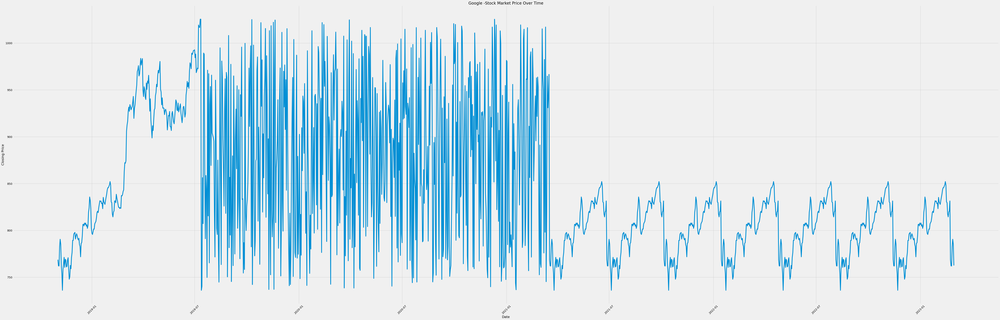

In [315]:
import pandas as pd
import matplotlib.pyplot as plt

ggl['Date'] = pd.to_datetime(ggl['Date'], format='%d-%m-%Y')

plt.figure(figsize=(80, 26))
plt.plot(ggl['Date'], ggl['Close'], marker='', linestyle='-')
plt.title('Google -Stock Market Price Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


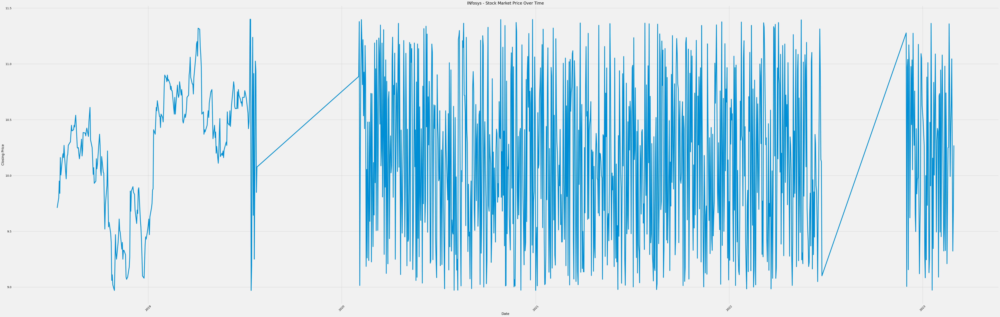

In [316]:
inf['Date'] = pd.to_datetime(inf['Date'], format='%d-%m-%Y')
plt.figure(figsize=(80, 26))
plt.plot(inf['Date'], inf['Close'], marker='', linestyle='-')
plt.title('INfosys - Stock Market Price Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


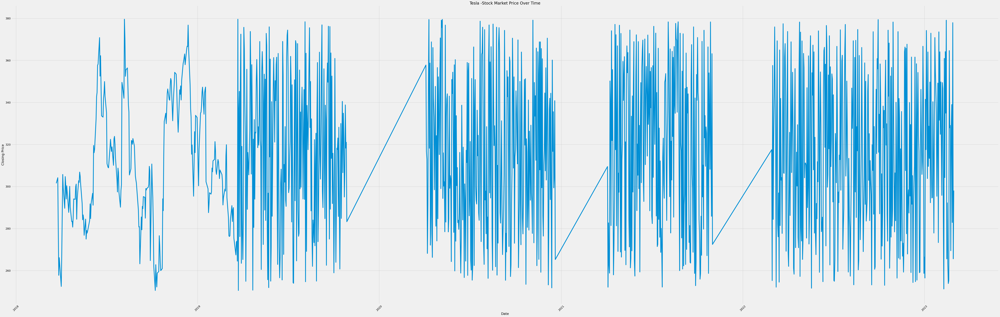

In [317]:
tsl['Date'] = pd.to_datetime(tsl['Date'], format='%d-%m-%Y')
plt.figure(figsize=(80, 26))
plt.plot(tsl['Date'], tsl['Close'], marker='', linestyle='-')
plt.title('Tesla -Stock Market Price Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


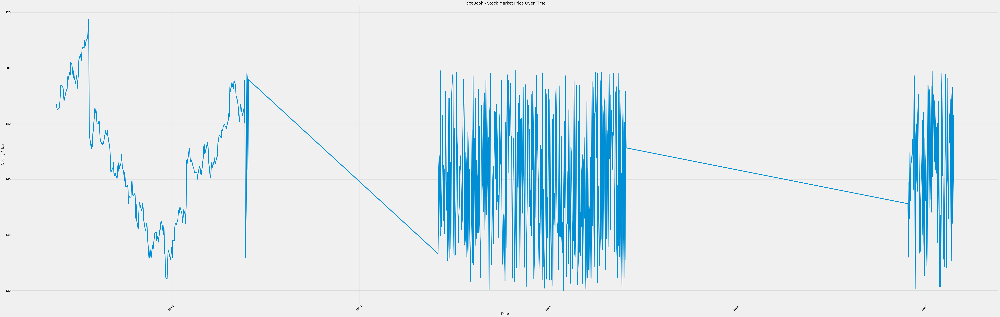

In [318]:
f1.loc[:, 'Date'] = pd.to_datetime(f1['Date'], format='%d-%m-%Y')
plt.figure(figsize=(80, 26))
plt.plot(f1['Date'], f1['Close'], marker='', linestyle='-')
plt.title('FaceBook - Stock Market Price Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


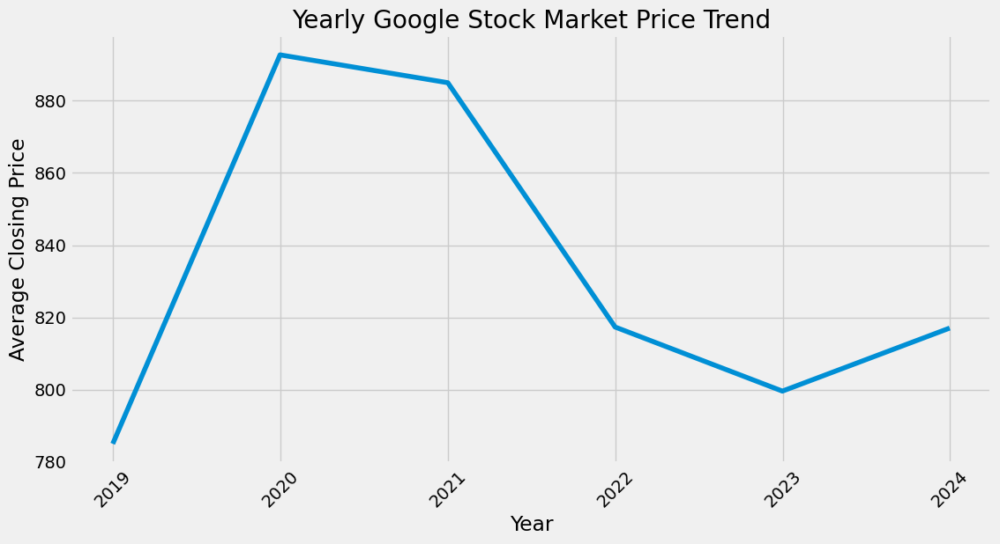

In [319]:

# ggl['Date'] = pd.to_datetime(ggl['Date'], format='%d-%m-%Y')

# Set the 'Date' column as the index
ggl.set_index('Date', inplace=True)

# Resample the data yearly and calculate the mean for each year
ggl_yearly = ggl.resample('Y').mean()

# Create a line plot for the 'Close' prices over time on a yearly basis
plt.figure(figsize=(12, 6))
plt.plot(ggl_yearly.index, ggl_yearly['Close'], marker='', linestyle='-')
plt.title('Yearly Google Stock Market Price Trend')
plt.xlabel('Year')
plt.ylabel('Average Closing Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


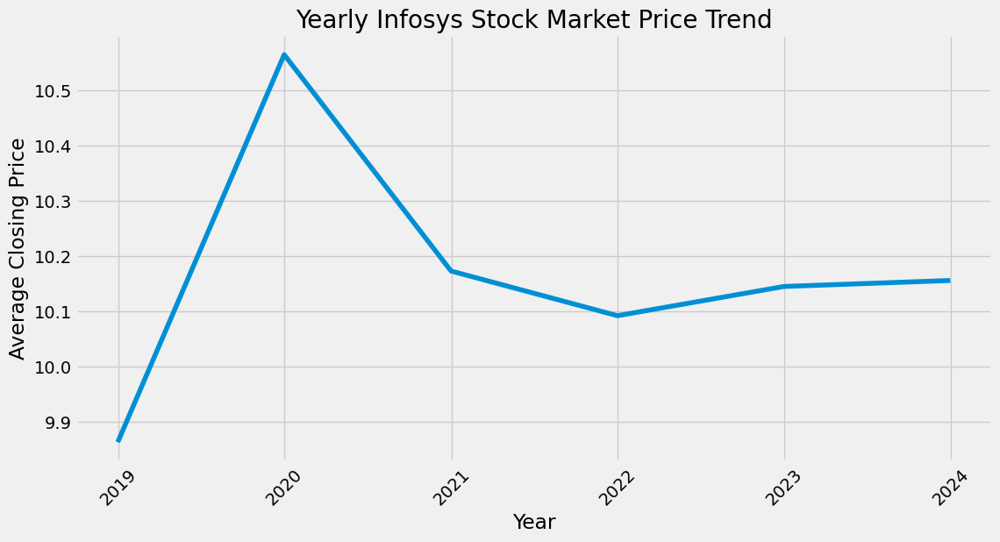

In [321]:
f1.loc[:, 'Date'] = pd.to_datetime(f1['Date'], format='%d-%m-%Y')
inf.set_index('Date', inplace=True)
inf_yearly = inf.resample('Y').mean()
plt.figure(figsize=(12, 6))
plt.plot(inf_yearly.index, inf_yearly['Close'], marker='', linestyle='-')
plt.title('Yearly Infosys Stock Market Price Trend')
plt.xlabel('Year')
plt.ylabel('Average Closing Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


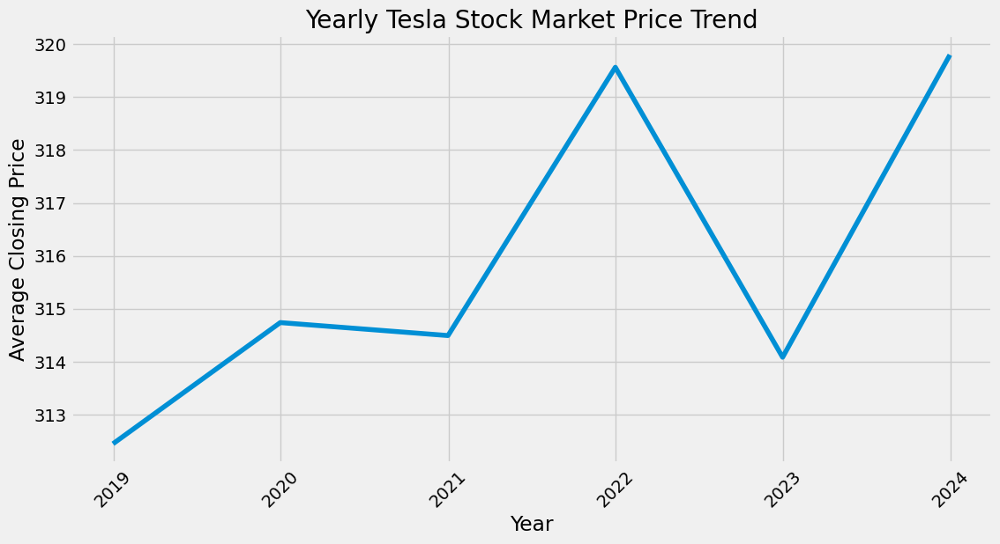

In [323]:
tsl['Date'] = pd.to_datetime(tsl['Date'], format='%d-%m-%Y')
tsl.set_index('Date', inplace=True)
tsl_yearly = tsl.resample('Y').mean()
plt.figure(figsize=(12, 6))
plt.plot(tsl_yearly.index, tsl_yearly['Close'], marker='', linestyle='-')
plt.title('Yearly Tesla Stock Market Price Trend')
plt.xlabel('Year')
plt.ylabel('Average Closing Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


C:\Users\HP\AppData\Local\Temp\ipykernel_8484\3980619232.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f1['Date'] = pd.to_datetime(f1['Date'], format='%d-%m-%Y')


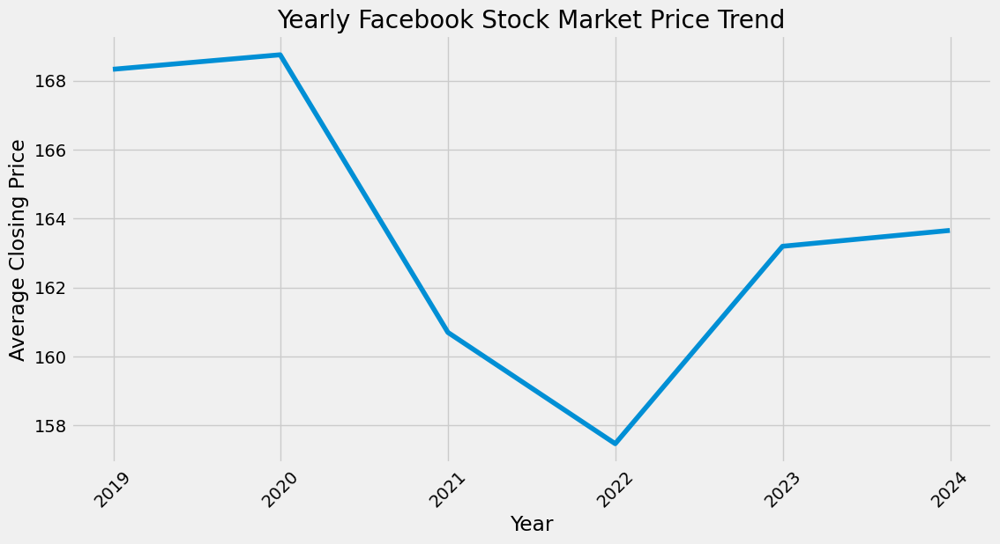

In [ ]:
# f1['Date'] = pd.to_datetime(f1['Date'], format='%d-%m-%Y')
# f1.set_index('Date', inplace=True)
f1_yearly = f1.resample('Y').mean()
plt.figure(figsize=(12, 6))
plt.plot(f1_yearly.index, f1_yearly['Close'], marker='', linestyle='-')
plt.title('Yearly Facebook Stock Market Price Trend')
plt.xlabel('Year')
plt.ylabel('Average Closing Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


### Correlation Heat Map

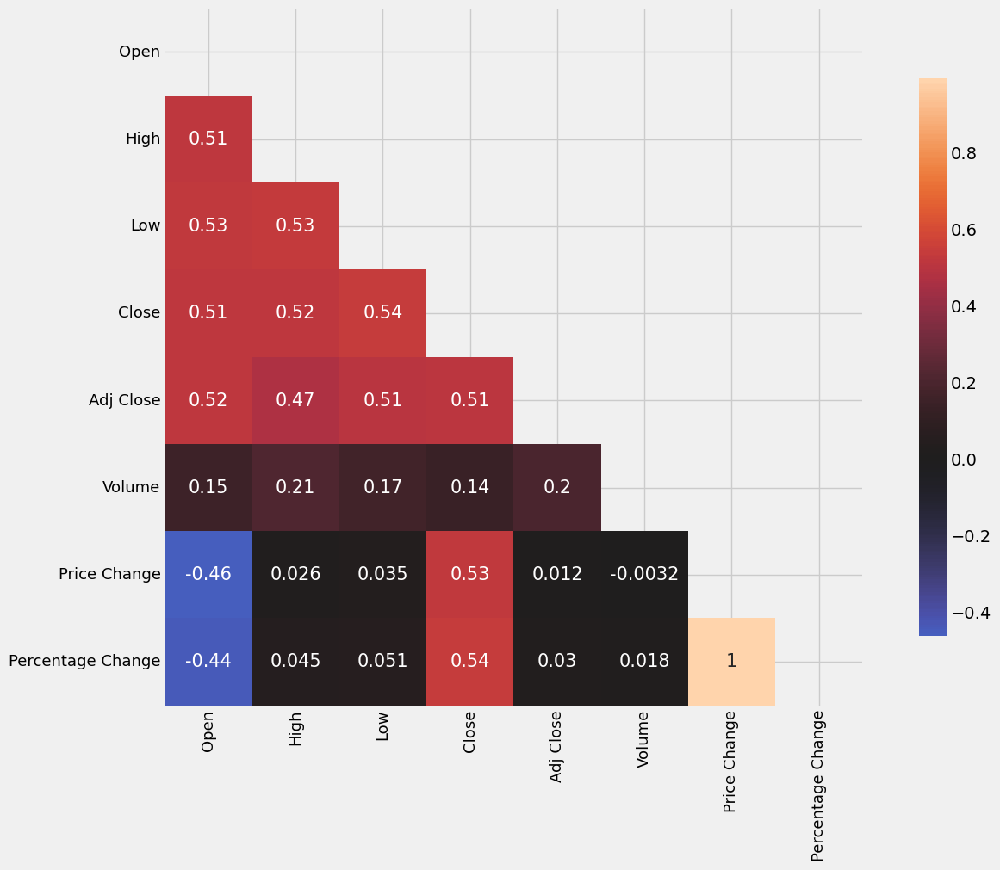

In [ ]:
plt.subplots(figsize=(15, 10))
ggl_corr = ggl.corr()
mask = np.zeros_like(ggl_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(ggl_corr, mask=mask, center=0, square=True, annot=True, annot_kws={"size": 15}, cbar_kws={"shrink": .8})
plt.xticks(size=13)
plt.yticks(size=13)
plt.show()


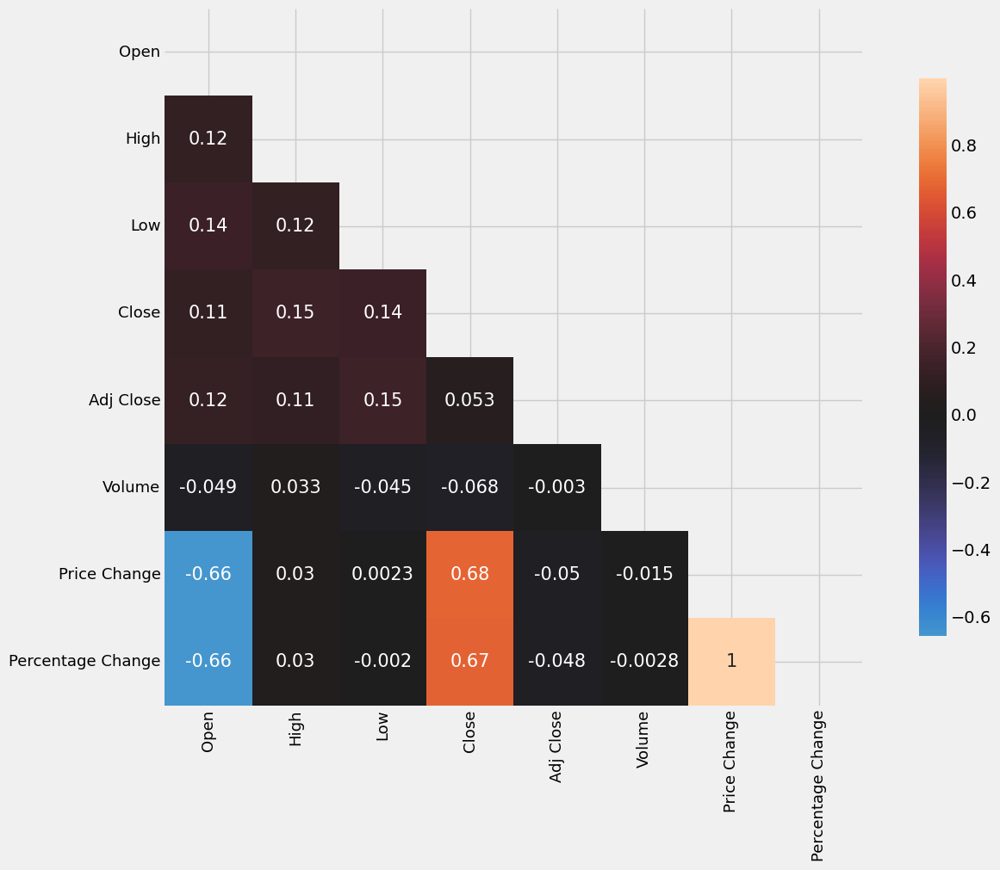

In [ ]:
plt.subplots(figsize=(15, 10))
inf_corr = inf.corr()
mask = np.zeros_like(inf_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(inf_corr, mask=mask, center=0, square=True, annot=True, annot_kws={"size": 15}, cbar_kws={"shrink": .8})
plt.xticks(size=13)
plt.yticks(size=13)
plt.show()


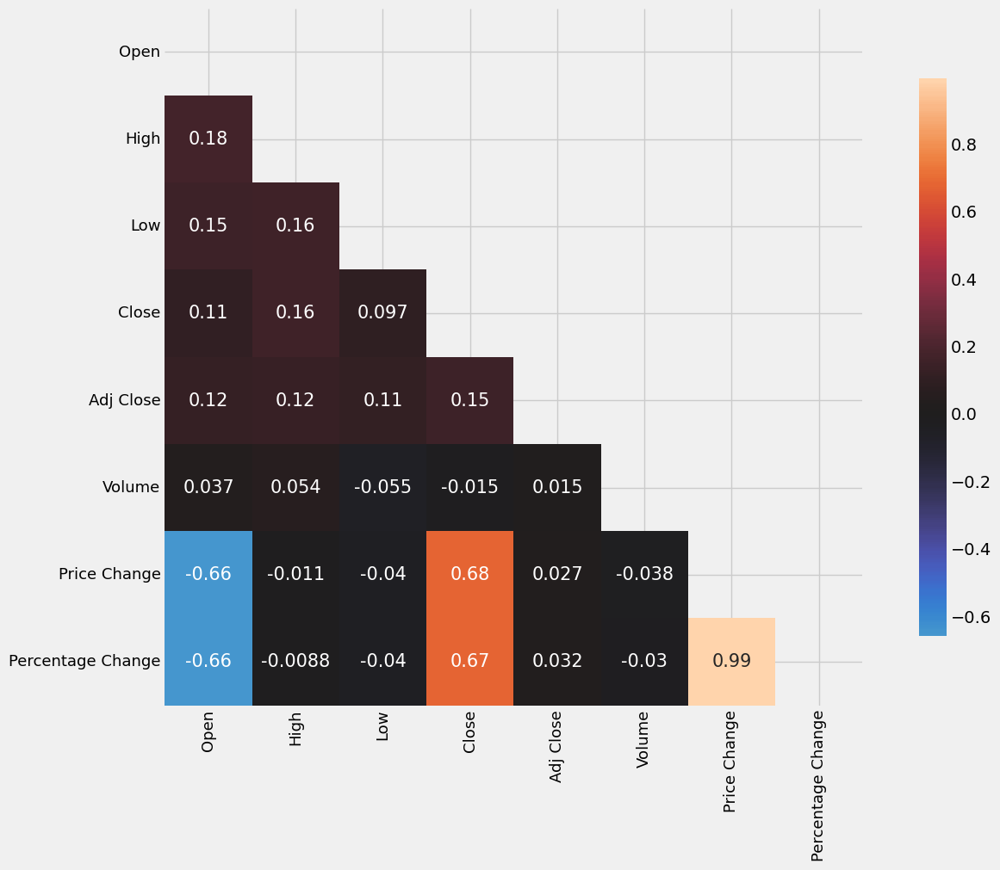

In [ ]:
plt.subplots(figsize=(15, 10))
tsl_corr = tsl.corr()
mask = np.zeros_like(tsl_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(tsl_corr, mask=mask, center=0, square=True, annot=True, annot_kws={"size": 15}, cbar_kws={"shrink": .8})
plt.xticks(size=13)
plt.yticks(size=13)
plt.show()


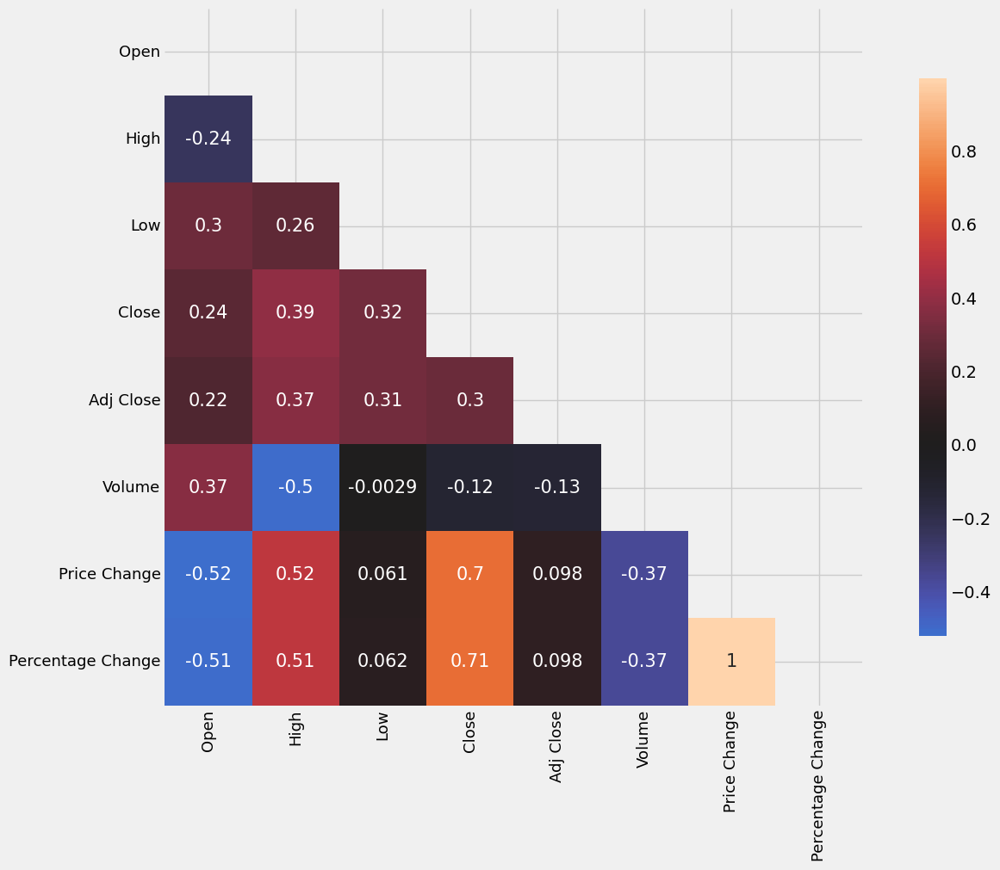

In [ ]:
plt.subplots(figsize=(15, 10))
f1_corr = f1.corr()
mask = np.zeros_like(f1_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(f1_corr, mask=mask, center=0, square=True, annot=True, annot_kws={"size": 15}, cbar_kws={"shrink": .8})
plt.xticks(size=13)
plt.yticks(size=13)
plt.show()


## Handling Duplicates

In [ ]:
ggl.drop_duplicates(keep='first')
ggl.shape


(1581, 8)

In [ ]:
inf.drop_duplicates(keep='first')
inf.shape


(1230, 8)

In [ ]:
tsl.drop_duplicates(keep='first')
tsl.shape


(1311, 8)

In [ ]:
f1.drop_duplicates(keep='first')
f1.shape


(716, 8)

# Regression

# Linear Regression

### Calculating Coefficient 

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X = ggl[['Open']].values
y = ggl['Close'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

regressor = LinearRegression()
regressor.fit(X_train, y_train)

y_pred = regressor.predict(X_test)

# Printing coefficients and intercept
print("Coefficients:", regressor.coef_)
print("Intercept:", regressor.intercept_)

# Printing the score of the model
print("Model Score:", regressor.score(X_test, y_test))



Coefficients: [0.52787794]
Intercept: 400.7244070688826
Model Score: 0.28409363066695936


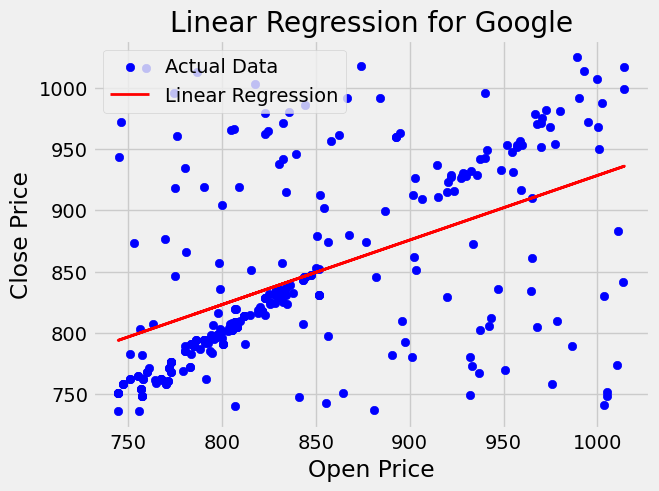

In [ ]:

# Plotting the linear regression
plt.scatter(X_test, y_test, color='blue', label='Actual Data')
plt.plot(X_test, y_pred, color='red', linewidth=2, label='Linear Regression')
plt.title('Linear Regression for Google')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.legend()
plt.show()

### Evaluation Metrics and Performance  

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X = ggl[['Open']].values
y = ggl['Close'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_lin1 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae:.2f}')
print(f'Mean Squared Error: {mse:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')
print(f'R-squared (R²): {r2_lin1:.2f}')


Mean Absolute Error: 47.26
Mean Squared Error: 4071.41
Root Mean Squared Error: 63.81
R-squared (R²): 0.28


###  Calculating Coefficient   

In [ ]:
X = inf[['Open']].values
y = inf['Close'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

regressor = LinearRegression()
regressor.fit(X_train, y_train)

y_pred = regressor.predict(X_test)

# Printing coefficients and intercept
print("Coefficients:", regressor.coef_)
print("Intercept:", regressor.intercept_)

# Printing the score of the model
print("Model Score:", regressor.score(X_test, y_test))


Coefficients: [0.15133405]
Intercept: 8.630427879196395
Model Score: -0.03790939637590207


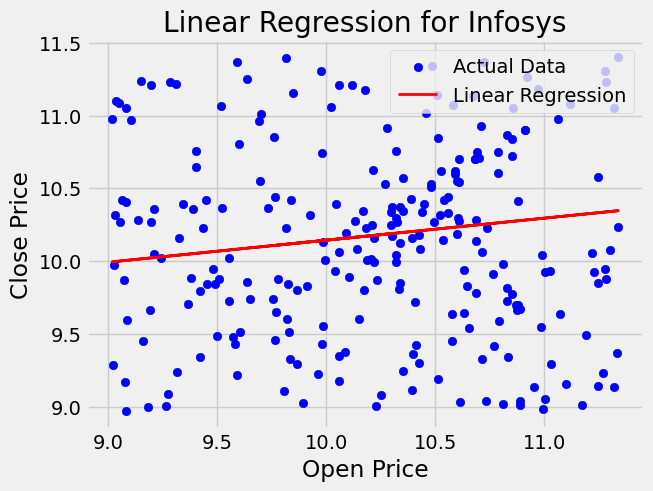

In [ ]:

# Plotting the linear regression
plt.scatter(X_test, y_test, color='blue', label='Actual Data')
plt.plot(X_test, y_pred, color='red', linewidth=2, label='Linear Regression')
plt.title('Linear Regression for Infosys')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.legend()
plt.show()


### Evaluation Metrics and Performance

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X = inf[['Open']].values
y = inf['Close'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_lin2 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae:.2f}')
print(f'Mean Squared Error: {mse:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')
print(f'R-squared (R²): {r2_lin2:.2f}')


Mean Absolute Error: 0.55
Mean Squared Error: 0.44
Root Mean Squared Error: 0.66
R-squared (R²): -0.04


### Calculating Coefficients

In [ ]:
X = tsl[['Open']].values
y = tsl['Close'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

regressor = LinearRegression()
regressor.fit(X_train, y_train)

y_pred = regressor.predict(X_test)

# Printing coefficients and intercept
print("Coefficients:", regressor.coef_)
print("Intercept:", regressor.intercept_)

# Printing the score of the model
print("Model Score:", regressor.score(X_test, y_test))


Coefficients: [0.09707388]
Intercept: 284.50675930579825
Model Score: 0.01559190380243669


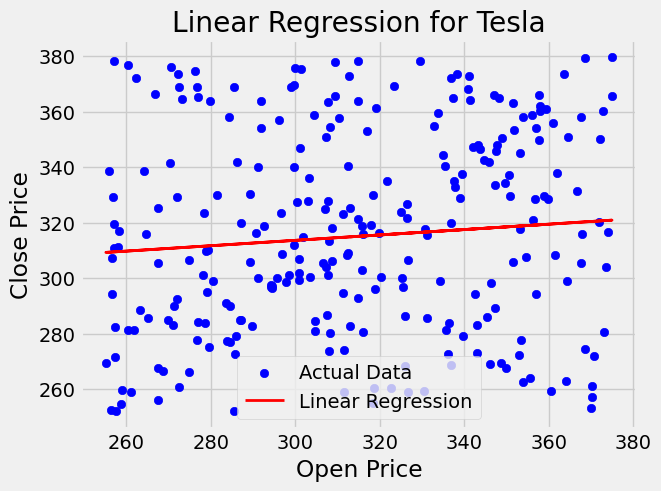

In [ ]:

# Plotting the linear regression
plt.scatter(X_test, y_test, color='blue', label='Actual Data')
plt.plot(X_test, y_pred, color='red', linewidth=2, label='Linear Regression')
plt.title('Linear Regression for Tesla')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.legend()
plt.show()

### Evaluation Metrics and Performance

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X = tsl[['Open']].values
y = tsl['Close'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_lin3 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae:.2f}')
print(f'Mean Squared Error: {mse:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')
print(f'R-squared (R²): {r2_lin3:.2f}')


Mean Absolute Error: 30.23
Mean Squared Error: 1269.56
Root Mean Squared Error: 35.63
R-squared (R²): 0.02


### Calculating Coefficients

In [ ]:
X = f1[['Open']].values
y = f1['Close'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

regressor = LinearRegression()
regressor.fit(X_train, y_train)

y_pred = regressor.predict(X_test)

# Printing coefficients and intercept
print("Coefficients:", regressor.coef_)
print("Intercept:", regressor.intercept_)

# Printing the score of the model
print("Model Score:", regressor.score(X_test, y_test))


Coefficients: [0.29799233]
Intercept: 107.94146342156354
Model Score: 0.007421886850256021


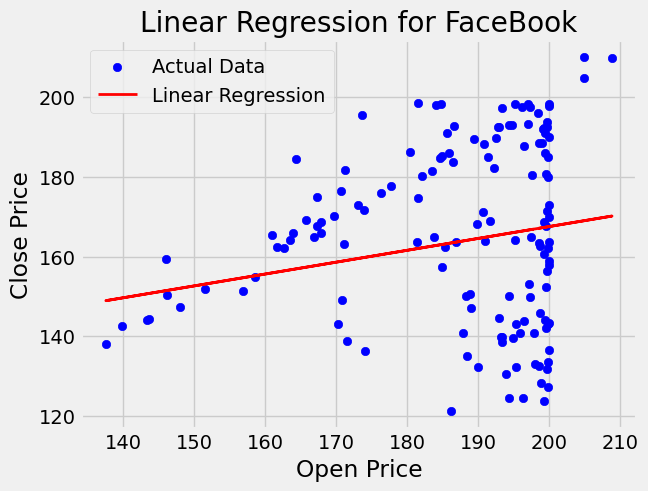

In [ ]:

# Plotting the linear regression
plt.scatter(X_test, y_test, color='blue', label='Actual Data')
plt.plot(X_test, y_pred, color='red', linewidth=2, label='Linear Regression')
plt.title('Linear Regression for FaceBook')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.legend()
plt.show()


### Evaluation Metrics and Performance

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X = f1[['Open']].values
y = f1['Close'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_lin4 = r2_score(y_test, y_pred)

print(f'Mean Absolute Error: {mae:.2f}')
print(f'Mean Squared Error: {mse:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')
print(f'R-squared (R²): {r2_lin4:.2f}')


Mean Absolute Error: 18.99
Mean Squared Error: 494.86
Root Mean Squared Error: 22.25
R-squared (R²): 0.01


### Finding the best Stock in linear regression based on R2 error

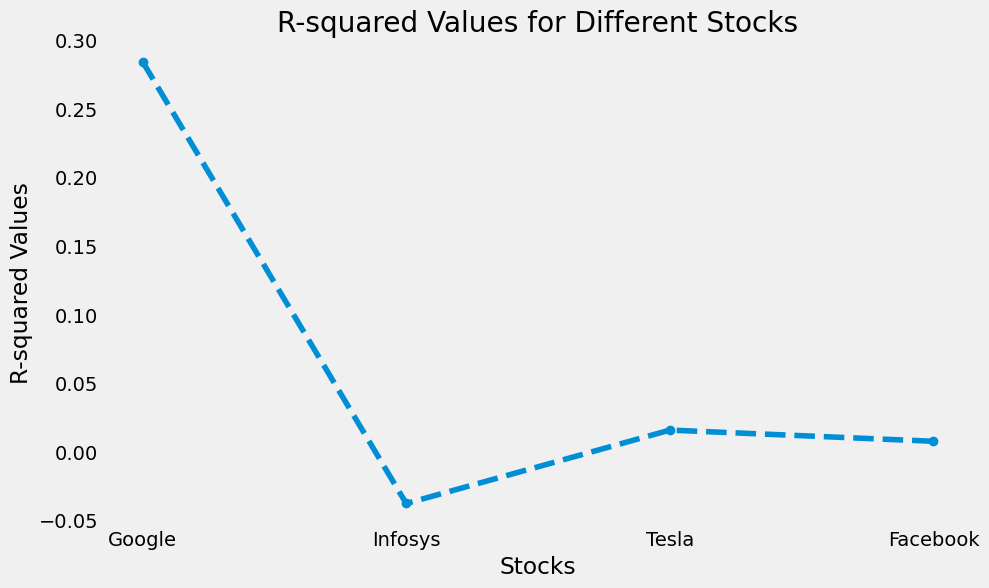

The best company based on R-squared value is Google.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data
stocks = ['Google', 'Infosys', 'Tesla', 'Facebook']
r2_values = [r2_lin1, r2_lin2, r2_lin3, r2_lin4]

# Create a figure and a set of subplots
plt.figure(figsize=(10, 6))

# Plot the R-squared values
plt.plot(stocks, r2_values, marker='o', linestyle='--')

# Find the company with the highest R-squared value
best_stock = stocks[np.argmax(r2_values)]

# Customize the plot
plt.xlabel('Stocks')
plt.ylabel('R-squared Values')
plt.title('R-squared Values for Different Stocks')
plt.grid()

# Display the plot
plt.show()

# Print the company with the best R-squared value
print(f"The best company based on R-squared value is {best_stock}.")


# Gradient Descent

Theta 0: 845.0366891591484
Theta 1: 38.123294037823264


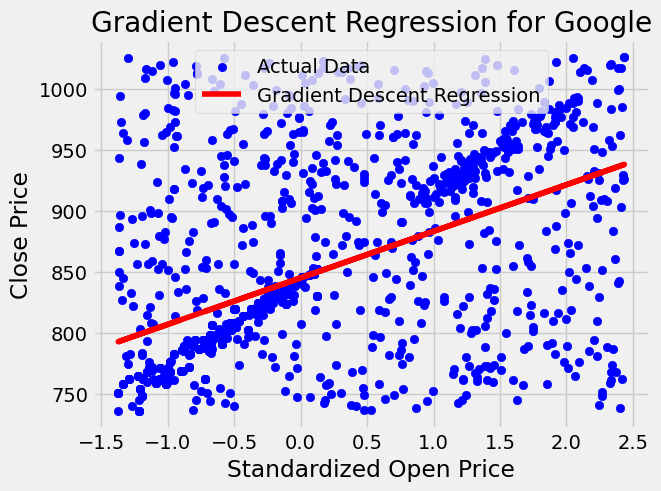

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

X = ggl['Open'].values
y = ggl['Close'].values
m = len(y)

X = (X - np.mean(X)) / np.std(X)

theta0 = 0
theta1 = 0

alpha = 0.01
iterations = 1000

for _ in range(iterations):
    y_pred = theta0 + theta1 * X
    theta0 -= alpha * (1/m) * np.sum(y_pred - y)
    theta1 -= alpha * (1/m) * np.sum((y_pred - y) * X)

print("Theta 0:", theta0)
print("Theta 1:", theta1)

plt.scatter(X, y, color='blue', label='Actual Data')
plt.plot(X, theta0 + theta1 * X, color='red', label='Gradient Descent Regression')
plt.title('Gradient Descent Regression for Google')
plt.xlabel('Standardized Open Price')
plt.ylabel('Close Price')
plt.legend()
plt.show()


### Evaluation Metrics and Performance 

In [ ]:
y_pred_final = theta0 + theta1 * X
mae = mean_absolute_error(y, y_pred_final)
mse = mean_squared_error(y, y_pred_final)
rmse = np.sqrt(mse)
r2_gd1 = r2_score(y, y_pred_final)

print("Evaluation Metrics for Google using GDS:")
print(f'Mean Absolute Error: {mae:.2f}')
print(f'Mean Squared Error: {mse:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')
print(f'R-squared (R²): {r2_gd1:.2f}')


Evaluation Metrics for Google using GDS:
Mean Absolute Error: 46.52
Mean Squared Error: 4107.03
Root Mean Squared Error: 64.09
R-squared (R²): 0.26


Theta 0: 10.160130075919493
Theta 1: 0.07602493383837883


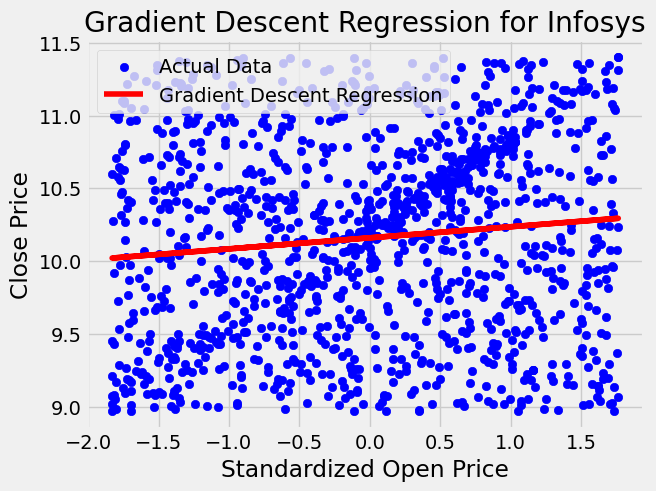

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

X = inf['Open'].values
y = inf['Close'].values
m = len(y)

X = (X - np.mean(X)) / np.std(X)

theta0 = 0
theta1 = 0

alpha = 0.01
iterations = 1000

for _ in range(iterations):
    y_pred = theta0 + theta1 * X
    theta0 -= alpha * (1/m) * np.sum(y_pred - y)
    theta1 -= alpha * (1/m) * np.sum((y_pred - y) * X)

print("Theta 0:", theta0)
print("Theta 1:", theta1)




plt.scatter(X, y, color='blue', label='Actual Data')
plt.plot(X, theta0 + theta1 * X, color='red', label='Gradient Descent Regression')
plt.title('Gradient Descent Regression for Infosys')
plt.xlabel('Standardized Open Price')
plt.ylabel('Close Price')
plt.legend()
plt.show()


### Evaluation Metrics and Performance

In [ ]:
y_pred_final = theta0 + theta1 * X
mae_inf = mean_absolute_error(y, y_pred_final)
mse_inf = mean_squared_error(y, y_pred_final)
rmse_inf = np.sqrt(mse_inf)
r2_gd2 = r2_score(y, y_pred_final)

print("Evaluation Metrics for Infosys:")
print(f'Mean Absolute Error: {mae_inf:.2f}')
print(f'Mean Squared Error: {mse_inf:.2f}')
print(f'Root Mean Squared Error: {rmse_inf:.2f}')
print(f'R-squared (R²): {r2_gd2:.2f}')

Evaluation Metrics for Infosys:
Mean Absolute Error: 0.57
Mean Squared Error: 0.44
Root Mean Squared Error: 0.67
R-squared (R²): 0.01


Theta 0: 315.19511817653324
Theta 1: 3.731590592921305


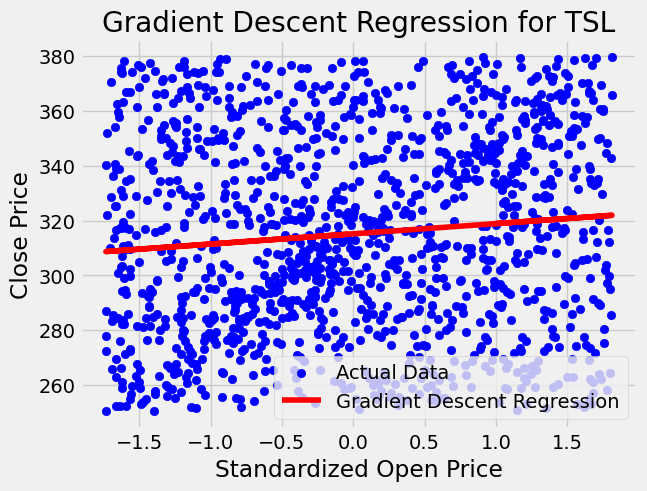

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

X = tsl['Open'].values
y = tsl['Close'].values
m = len(y)

X = (X - np.mean(X)) / np.std(X)

theta0 = 0
theta1 = 0

alpha = 0.01
iterations = 1000

for _ in range(iterations):
    y_pred = theta0 + theta1 * X
    theta0 -= alpha * (1/m) * np.sum(y_pred - y)
    theta1 -= alpha * (1/m) * np.sum((y_pred - y) * X)

print("Theta 0:", theta0)
print("Theta 1:", theta1)



plt.scatter(X, y, color='blue', label='Actual Data')
plt.plot(X, theta0 + theta1 * X, color='red', label='Gradient Descent Regression')
plt.title('Gradient Descent Regression for TSL')
plt.xlabel('Standardized Open Price')
plt.ylabel('Close Price')
plt.legend()
plt.show()


### Evaluation Metrics and Performance

In [ ]:
# Evaluation metrics
y_pred_final = theta0 + theta1 * X
mae_tsl = mean_absolute_error(y, y_pred_final)
mse_tsl = mean_squared_error(y, y_pred_final)
rmse_tsl = np.sqrt(mse_tsl)
r2_gd3 = r2_score(y, y_pred_final)

print("Evaluation Metrics for TSL:")
print(f'Mean Absolute Error: {mae_tsl:.2f}')
print(f'Mean Squared Error: {mse_tsl:.2f}')
print(f'Root Mean Squared Error: {rmse_tsl:.2f}')
print(f'R-squared (R²): {r2_gd3:.2f}')

Evaluation Metrics for TSL:
Mean Absolute Error: 30.16
Mean Squared Error: 1243.08
Root Mean Squared Error: 35.26
R-squared (R²): 0.01


Theta 0: 163.18883451856112
Theta 1: 5.504290159239668


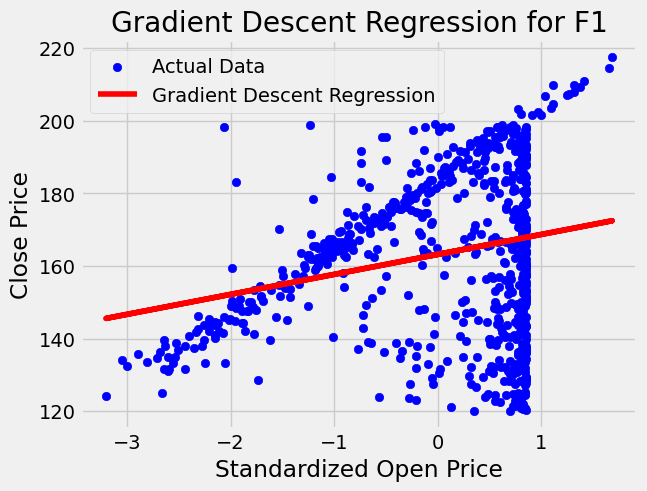

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

X = f1['Open'].values
y = f1['Close'].values
m = len(y)

X = (X - np.mean(X)) / np.std(X)

theta0 = 0
theta1 = 0

alpha = 0.01
iterations = 1000

for _ in range(iterations):
    y_pred = theta0 + theta1 * X
    theta0 -= alpha * (1/m) * np.sum(y_pred - y)
    theta1 -= alpha * (1/m) * np.sum((y_pred - y) * X)

print("Theta 0:", theta0)
print("Theta 1:", theta1)



plt.scatter(X, y, color='blue', label='Actual Data')
plt.plot(X, theta0 + theta1 * X, color='red', label='Gradient Descent Regression')
plt.title('Gradient Descent Regression for F1')
plt.xlabel('Standardized Open Price')
plt.ylabel('Close Price')
plt.legend()
plt.show()


### Evaluation Metrics and Performance

In [ ]:
# Evaluation metrics
y_pred_final = theta0 + theta1 * X
mae_f1 = mean_absolute_error(y, y_pred_final)
mse_f1 = mean_squared_error(y, y_pred_final)
rmse_f1 = np.sqrt(mse_f1)
r2_gd4 = r2_score(y, y_pred_final)

print("Evaluation Metrics for F1:")
print(f'Mean Absolute Error: {mae_f1:.2f}')
print(f'Mean Squared Error: {mse_f1:.2f}')
print(f'Root Mean Squared Error: {rmse_f1:.2f}')
print(f'R-squared (R²): {r2_gd4:.2f}')

Evaluation Metrics for F1:
Mean Absolute Error: 18.56
Mean Squared Error: 486.26
Root Mean Squared Error: 22.05
R-squared (R²): 0.06


### Choosing the Best Stock Based on R2 error value

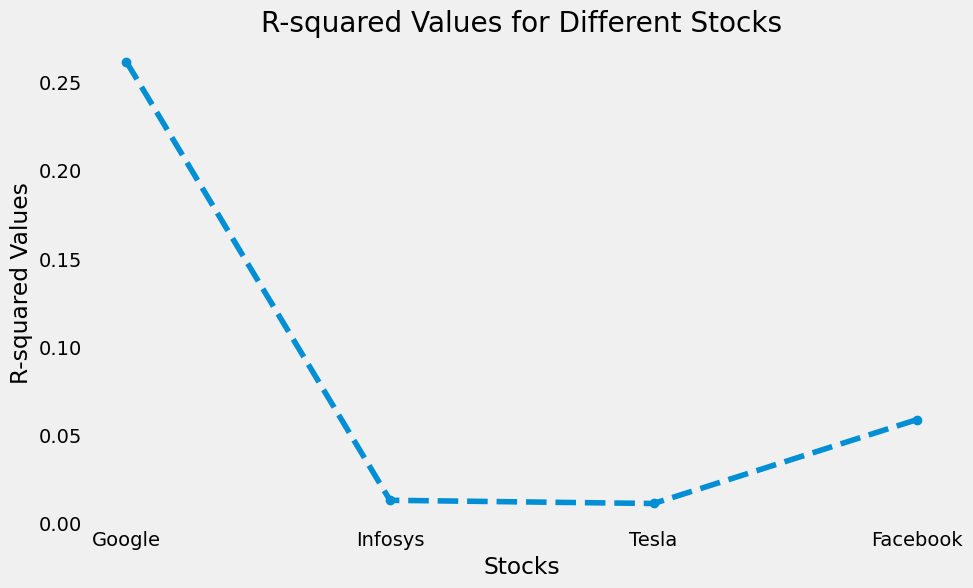

The best company based on R-squared value is Google.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data
stocks = ['Google', 'Infosys', 'Tesla', 'Facebook']
r2_values = [r2_gd1, r2_gd2, r2_gd3, r2_gd4]

# Create a figure and a set of subplots
plt.figure(figsize=(10, 6))

# Plot the R-squared values
plt.plot(stocks, r2_values, marker='o', linestyle='--')

# Find the company with the highest R-squared value
best_stock = stocks[np.argmax(r2_values)]

# Customize the plot
plt.xlabel('Stocks')
plt.ylabel('R-squared Values')
plt.title('R-squared Values for Different Stocks')
plt.grid()

# Display the plot
plt.show()

# Print the company with the best R-squared value
print(f"The best company based on R-squared value is {best_stock}.")


# OLS

In [ ]:
import numpy as np
import statsmodels.api as sm

X_ggl = ggl['Open']  # Feature (Open Price)
y_ggl = ggl['Close']  # Target variable (Close Price)

X_ggl = sm.add_constant(X_ggl)

model_ggl = sm.OLS(y_ggl, X_ggl).fit()

theta0_ggl, theta1_ggl = model_ggl.params['const'], model_ggl.params['Open']


print("Theta 0 (Intercept):", theta0)
print("Theta 1 (Slope):", theta1)

print(model_ggl.summary())


Theta 0 (Intercept): 163.18883451856112
Theta 1 (Slope): 5.504290159239668
                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.261
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     558.8
Date:                Thu, 02 Nov 2023   Prob (F-statistic):          5.05e-106
Time:                        19:22:29   Log-Likelihood:                -8820.7
No. Observations:                1581   AIC:                         1.765e+04
Df Residuals:                    1579   BIC:                         1.766e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

### Evaluation Metrics and Performance

In [ ]:
# Evaluation metrics for GGL
y_pred_ggl = model_ggl.predict(X_ggl)
mae_ggl = mean_absolute_error(y_ggl, y_pred_ggl)
mse_ggl = mean_squared_error(y_ggl, y_pred_ggl)
rmse_ggl = np.sqrt(mse_ggl)
r2_ol1 = r2_score(y_ggl, y_pred_ggl)

print("Evaluation Metrics for GGL:")
print(f'Mean Absolute Error: {mae_ggl:.2f}')
print(f'Mean Squared Error: {mse_ggl:.2f}')
print(f'Root Mean Squared Error: {rmse_ggl:.2f}')
print(f'R-squared (R²): {r2_ol1:.2f}')


Evaluation Metrics for GGL:
Mean Absolute Error: 46.54
Mean Squared Error: 4107.02
Root Mean Squared Error: 64.09
R-squared (R²): 0.26


In [ ]:
import numpy as np
import statsmodels.api as sm

X_inf = inf['Open']  # Feature (Open Price)
y_inf = inf['Close']  # Target variable (Close Price)

X_inf = sm.add_constant(X_inf)

model_inf = sm.OLS(y_inf, X_inf).fit()

theta0_inf, theta1_inf = model_inf.params['const'], model_inf.params['Open']

print("Theta 0 (Intercept) for INF:", theta0_inf)
print("Theta 1 (Slope) for INF:", theta1_inf)

print(model_inf.summary())


Theta 0 (Intercept) for INF: 8.976306213379631
Theta 1 (Slope) for INF: 0.1162532685274699
                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     16.05
Date:                Thu, 02 Nov 2023   Prob (F-statistic):           6.56e-05
Time:                        19:22:33   Log-Likelihood:                -1243.7
No. Observations:                1230   AIC:                             2491.
Df Residuals:                    1228   BIC:                             2502.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

### Evaluation Metrics and Performance

In [ ]:
# Evaluation metrics for INF
y_pred_inf = model_inf.predict(X_inf)
mae_inf = mean_absolute_error(y_inf, y_pred_inf)
mse_inf = mean_squared_error(y_inf, y_pred_inf)
rmse_inf = np.sqrt(mse_inf)
r2_ol2 = r2_score(y_inf, y_pred_inf)

print("Evaluation Metrics for INF:")
print(f'Mean Absolute Error: {mae_inf:.2f}')
print(f'Mean Squared Error: {mse_inf:.2f}')
print(f'Root Mean Squared Error: {rmse_inf:.2f}')
print(f'R-squared (R²): {r2_ol2:.2f}')

Evaluation Metrics for INF:
Mean Absolute Error: 0.57
Mean Squared Error: 0.44
Root Mean Squared Error: 0.67
R-squared (R²): 0.01


In [ ]:
import numpy as np
import statsmodels.api as sm

X_tsl = tsl['Open']  # Feature (Open Price)
y_tsl = tsl['Close']  # Target variable (Close Price)

X_tsl = sm.add_constant(X_tsl)

model_tsl = sm.OLS(y_tsl, X_tsl).fit()

theta0_tsl, theta1_tsl = model_tsl.params['const'], model_tsl.params['Open']

print("Theta 0 (Intercept) for TSL:", theta0_tsl)
print("Theta 1 (Slope) for TSL:", theta1_tsl)

print(model_tsl.summary())


Theta 0 (Intercept) for TSL: 281.3642469697329
Theta 1 (Slope) for TSL: 0.10829006341403172
                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     14.66
Date:                Thu, 02 Nov 2023   Prob (F-statistic):           0.000135
Time:                        19:22:42   Log-Likelihood:                -6530.9
No. Observations:                1311   AIC:                         1.307e+04
Df Residuals:                    1309   BIC:                         1.308e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

### Evaluation Metrics and Performance

In [ ]:

# Evaluation metrics for TSL
y_pred_tsl = model_tsl.predict(X_tsl)
mae_tsl = mean_absolute_error(y_tsl, y_pred_tsl)
mse_tsl = mean_squared_error(y_tsl, y_pred_tsl)
rmse_tsl = np.sqrt(mse_tsl)
r2_ol3 = r2_score(y_tsl, y_pred_tsl)

print("Evaluation Metrics for TSL:")
print(f'Mean Absolute Error: {mae_tsl:.2f}')
print(f'Mean Squared Error: {mse_tsl:.2f}')
print(f'Root Mean Squared Error: {rmse_tsl:.2f}')
print(f'R-squared (R²): {r2_ol3:.2f}')

Evaluation Metrics for TSL:
Mean Absolute Error: 30.16
Mean Squared Error: 1243.08
Root Mean Squared Error: 35.26
R-squared (R²): 0.01


In [ ]:
import numpy as np
import statsmodels.api as sm

X_f1 = f1['Open']  # Feature (Open Price)
y_f1 = f1['Close']  # Target variable (Close Price)

X_f1 = sm.add_constant(X_f1)

model_f1 = sm.OLS(y_f1, X_f1).fit()

theta0_f1, theta1_f1 = model_f1.params['const'], model_f1.params['Open']

print("Theta 0 (Intercept) for F1:", theta0_f1)
print("Theta 1 (Slope) for F1:", theta1_f1)

print(model_f1.summary())


Theta 0 (Intercept) for F1: 109.77264131404918
Theta 1 (Slope) for F1: 0.29066675637810657
                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.057
Method:                 Least Squares   F-statistic:                     44.49
Date:                Thu, 02 Nov 2023   Prob (F-statistic):           5.12e-11
Time:                        19:22:51   Log-Likelihood:                -3230.8
No. Observations:                 716   AIC:                             6466.
Df Residuals:                     714   BIC:                             6475.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

### Evaluation Metrics and Performance

In [ ]:

# Evaluation metrics for F1
y_pred_f1 = model_f1.predict(X_f1)
mae_f1 = mean_absolute_error(y_f1, y_pred_f1)
mse_f1 = mean_squared_error(y_f1, y_pred_f1)
rmse_f1 = np.sqrt(mse_f1)
r2_ol4 = r2_score(y_f1, y_pred_f1)

print("Evaluation Metrics for F1:")
print(f'Mean Absolute Error: {mae_f1:.2f}')
print(f'Mean Squared Error: {mse_f1:.2f}')
print(f'Root Mean Squared Error: {rmse_f1:.2f}')
print(f'R-squared (R²): {r2_ol4:.2f}')

Evaluation Metrics for F1:
Mean Absolute Error: 18.56
Mean Squared Error: 486.26
Root Mean Squared Error: 22.05
R-squared (R²): 0.06


### Choosing the Best Stock based on R2 value

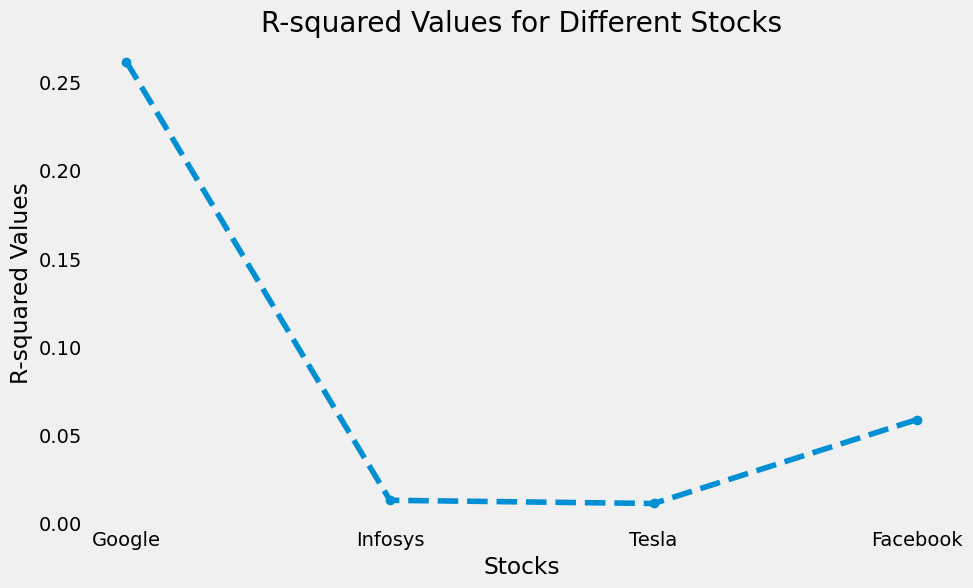

The best company based on R-squared value is Google.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data
stocks = ['Google', 'Infosys', 'Tesla', 'Facebook']
r2_values = [r2_ol1, r2_ol2, r2_ol3, r2_ol4]

# Create a figure and a set of subplots
plt.figure(figsize=(10, 6))

# Plot the R-squared values
plt.plot(stocks, r2_values, marker='o', linestyle='--')

# Find the company with the highest R-squared value
best_stock = stocks[np.argmax(r2_values)]

# Customize the plot
plt.xlabel('Stocks')
plt.ylabel('R-squared Values')
plt.title('R-squared Values for Different Stocks')
plt.grid()

# Display the plot
plt.show()

# Print the company with the best R-squared value
print(f"The best company based on R-squared value is {best_stock}.")


# Logistic Regression

Logistic Regression Coefficient:
[[-0.48267284]]
Logistic Regression Intercept:
[0.1575065]


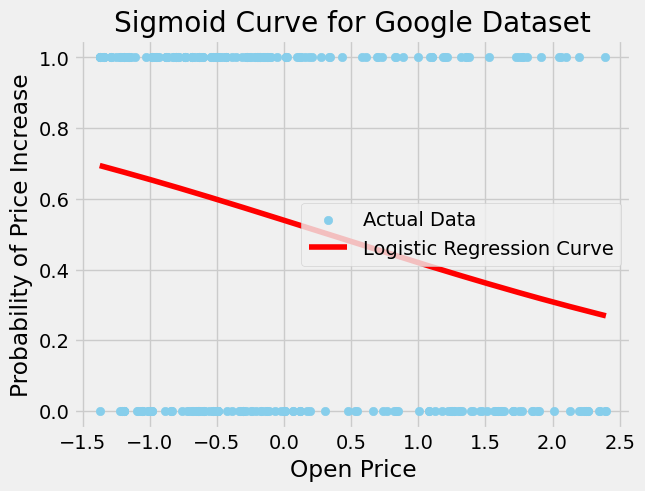

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

ggl['Price_Change'] = np.where(ggl['Close'] > ggl['Open'], 1, 0)

X = ggl[['Open']].values
y = ggl['Price_Change'].values

sc = StandardScaler()
X = sc.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)

print('Logistic Regression Coefficient:')
print(logistic_model.coef_)

print('Logistic Regression Intercept:')
print(logistic_model.intercept_)

X_test_sorted = np.sort(X_test, axis=0)
y_pred_proba = logistic_model.predict_proba(X_test_sorted)[:, 1]

plt.scatter(X_test, y_test, color='skyblue', label='Actual Data')
plt.plot(X_test_sorted, y_pred_proba, color='red', label='Logistic Regression Curve')

plt.title('Sigmoid Curve for Google Dataset')
plt.xlabel('Open Price')
plt.ylabel('Probability of Price Increase')
plt.legend()
plt.show()


### Evaluation Metrics and Performance

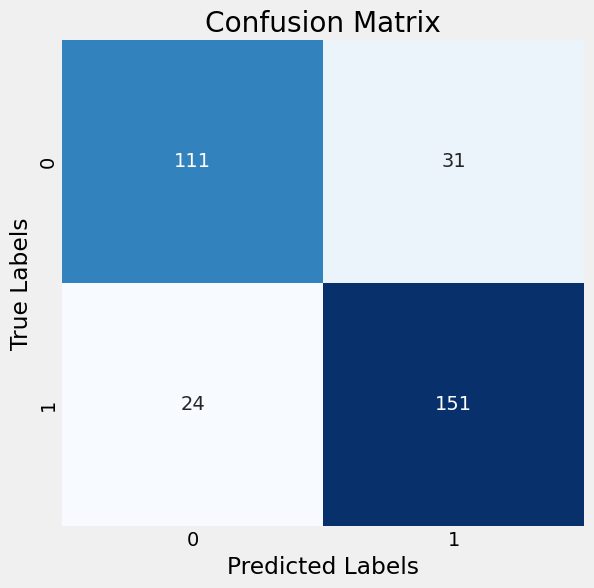

Accuracy: 0.83
Precision: 0.83
Recall: 0.86
F1-Score: 0.85
Confusion Matrix:
[[111  31]
 [ 24 151]]
Odds Ratio: None


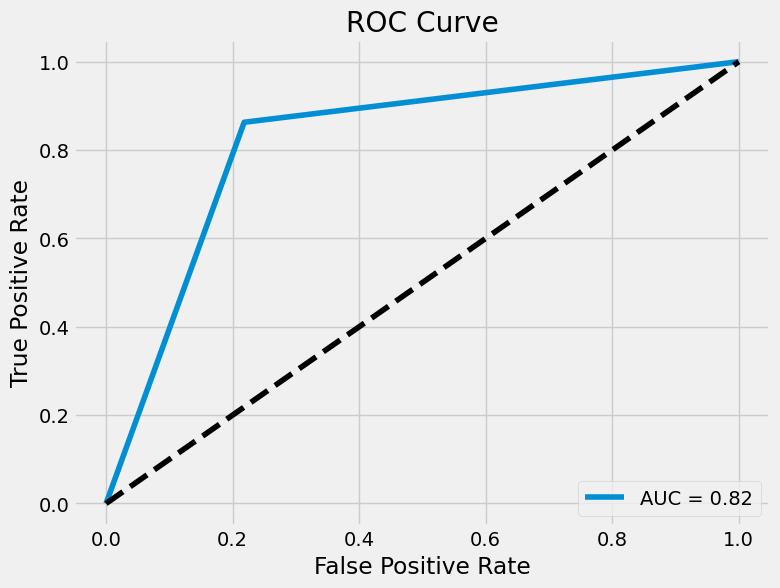

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'inf' is your DataFrame
X = ggl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = ggl['Price Change']  # Target variable

# Convert 'Price Change' to discrete classes (increase or decrease)
y = y.apply(lambda x: 1 if x > 0 else 0)

# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit the decision tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Calculate the metrics
acc1 = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_ggl = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Calculate the odds ratio
odds_ratio = None  # Add your calculation here

print(f'Accuracy: {acc1:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1_ggl:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print(f'Odds Ratio: {odds_ratio}')

# Get the predicted probabilities for the positive class
y_pred_prob = dt_classifier.predict_proba(X_test)[:, 1]

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate the AUC (Area Under the Curve)
auc = roc_auc_score(y_test, y_pred_prob)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


 

Logistic Regression Coefficient:
[[-1.10113272]]
Logistic Regression Intercept:
[0.05520179]


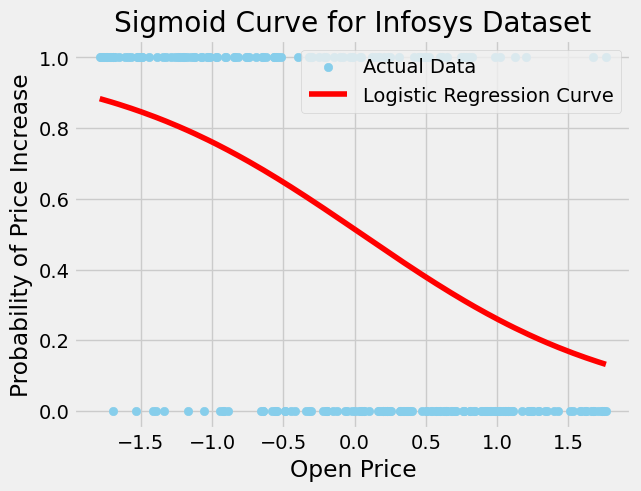

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

inf['Price_Change'] = np.where(inf['Close'] > inf['Open'], 1, 0)

X = inf[['Open']].values
y = inf['Price_Change'].values

sc = StandardScaler()
X = sc.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)

print('Logistic Regression Coefficient:')
print(logistic_model.coef_)

print('Logistic Regression Intercept:')
print(logistic_model.intercept_)

X_test_sorted = np.sort(X_test, axis=0)
y_pred_proba = logistic_model.predict_proba(X_test_sorted)[:, 1]

plt.scatter(X_test, y_test, color='skyblue', label='Actual Data')
plt.plot(X_test_sorted, y_pred_proba, color='red', label='Logistic Regression Curve')

plt.title('Sigmoid Curve for Infosys Dataset')
plt.xlabel('Open Price')
plt.ylabel('Probability of Price Increase')
plt.legend()
plt.show()


### Evaluation Metrics and Performance

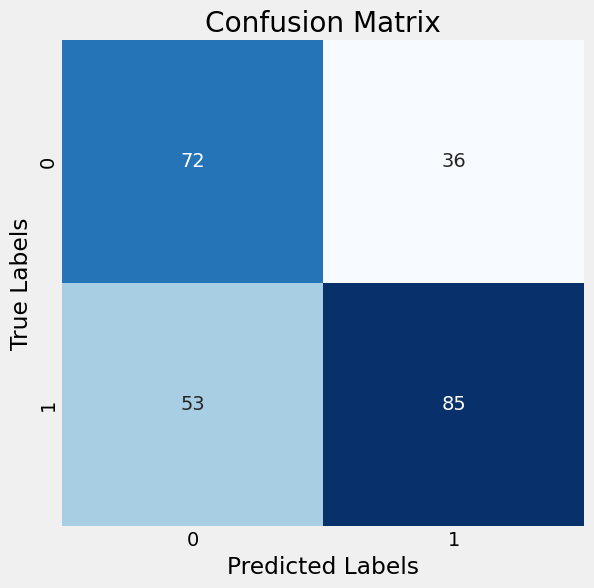

Accuracy: 0.64
Precision: 0.70
Recall: 0.62
F1-Score: 0.66
Confusion Matrix:
[[72 36]
 [53 85]]
Odds Ratio: None


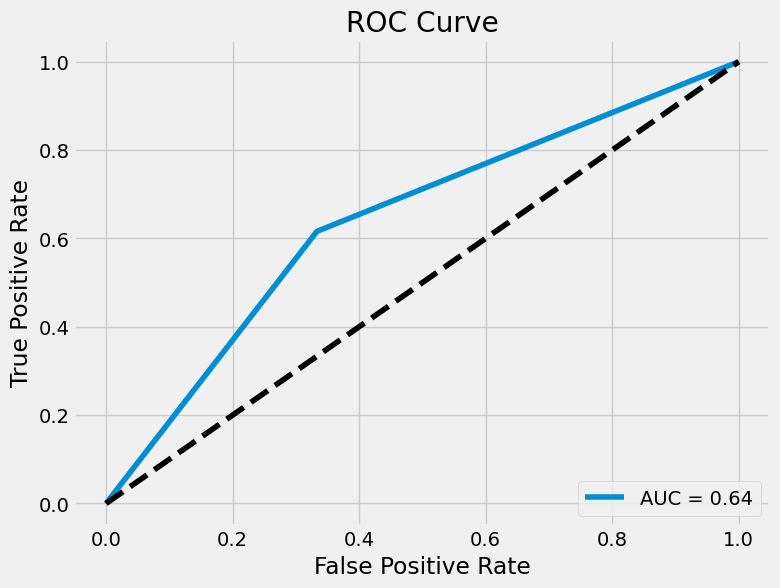

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'inf' is your DataFrame
X = inf[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = inf['Price Change']  # Target variable

# Convert 'Price Change' to discrete classes (increase or decrease)
y = y.apply(lambda x: 1 if x > 0 else 0)

# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit the decision tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Calculate the metrics
acc2 = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_inf = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Calculate the odds ratio
odds_ratio = None  # Add your calculation here

print(f'Accuracy: {acc2:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1_inf:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print(f'Odds Ratio: {odds_ratio}')

# Get the predicted probabilities for the positive class
y_pred_prob = dt_classifier.predict_proba(X_test)[:, 1]

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate the AUC (Area Under the Curve)
auc = roc_auc_score(y_test, y_pred_prob)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


Logistic Regression Coefficient:
[[-1.15119307]]
Logistic Regression Intercept:
[0.07877651]


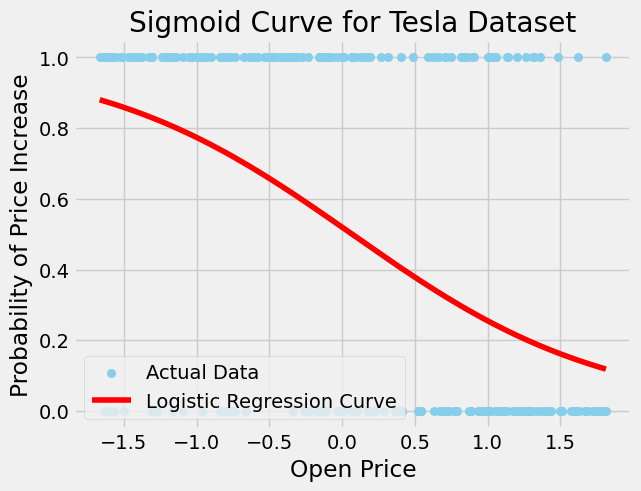

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

tsl['Price_Change'] = np.where(tsl['Close'] > tsl['Open'], 1, 0)

X = tsl[['Open']].values
y = tsl['Price_Change'].values

sc = StandardScaler()
X = sc.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)

print('Logistic Regression Coefficient:')
print(logistic_model.coef_)

print('Logistic Regression Intercept:')
print(logistic_model.intercept_)

X_test_sorted = np.sort(X_test, axis=0)
y_pred_proba = logistic_model.predict_proba(X_test_sorted)[:, 1]

plt.scatter(X_test, y_test, color='skyblue', label='Actual Data')
plt.plot(X_test_sorted, y_pred_proba, color='red', label='Logistic Regression Curve')

plt.title('Sigmoid Curve for Tesla Dataset')
plt.xlabel('Open Price')
plt.ylabel('Probability of Price Increase')
plt.legend()
plt.show()


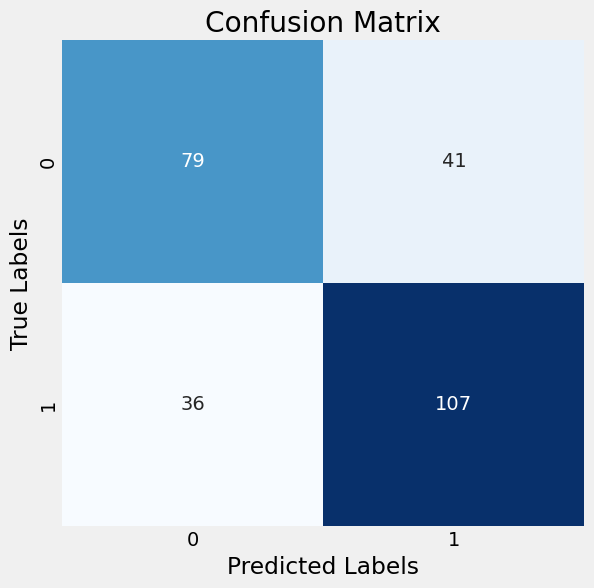

Accuracy: 0.71
Precision: 0.72
Recall: 0.75
F1-Score: 0.74
Confusion Matrix:
[[ 79  41]
 [ 36 107]]
Odds Ratio: None


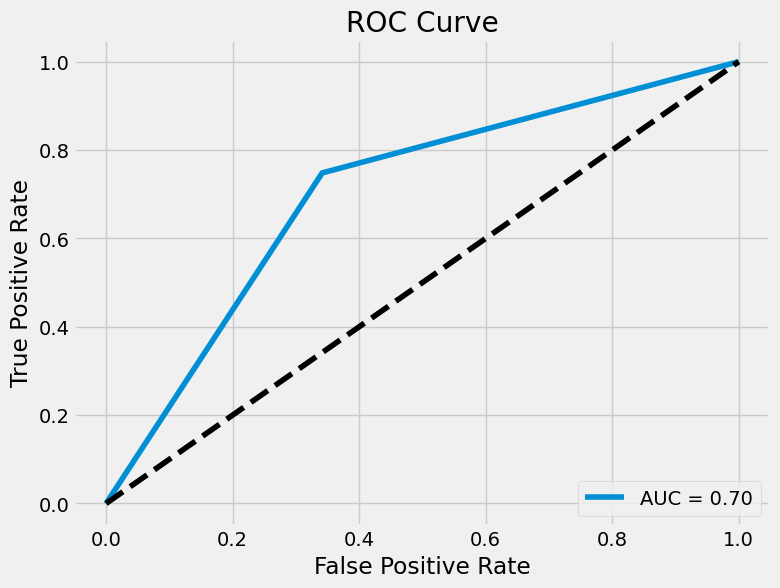

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'tsl' is your DataFrame
X = tsl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = tsl['Price Change']  # Target variable

# Convert 'Price Change' to discrete classes (increase or decrease)
y = y.apply(lambda x: 1 if x > 0 else 0)

# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit the decision tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Calculate the metrics
acc3 = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_tsl = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Calculate the odds ratio
odds_ratio = None  # Add your calculation here

print(f'Accuracy: {acc3:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1_tsl:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print(f'Odds Ratio: {odds_ratio}')

# Get the predicted probabilities for the positive class
y_pred_prob = dt_classifier.predict_proba(X_test)[:, 1]

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate the AUC (Area Under the Curve)
auc = roc_auc_score(y_test, y_pred_prob)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


### Evaluation Metrics and Performance

C:\Users\HP\AppData\Local\Temp\ipykernel_8484\3718691405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f1.loc[:, 'Price_Change'] = np.where(f1['Close'] > f1['Open'], 1, 0)


Logistic Regression Coefficient:
[[-0.04509105]]
Logistic Regression Intercept:
[7.06119368]


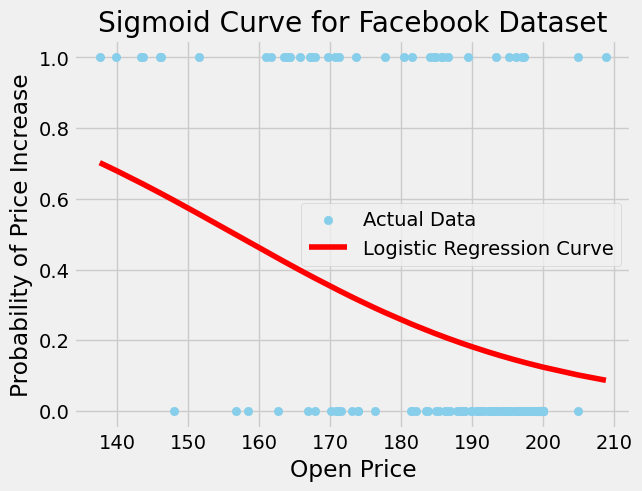

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler


# Assuming 'f1' is your DataFrame
f1.loc[:, 'Price_Change'] = np.where(f1['Close'] > f1['Open'], 1, 0)

X = f1[['Open']].values
y = f1['Price_Change'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)

print('Logistic Regression Coefficient:')
print(logistic_model.coef_)

print('Logistic Regression Intercept:')
print(logistic_model.intercept_)

X_test_sorted = np.sort(X_test, axis=0)
y_pred_proba = logistic_model.predict_proba(X_test_sorted)[:, 1]

plt.scatter(X_test, y_test, color='skyblue', label='Actual Data')
plt.plot(X_test_sorted, y_pred_proba, color='red', label='Logistic Regression Curve')

plt.title('Sigmoid Curve for Facebook Dataset')
plt.xlabel('Open Price')
plt.ylabel('Probability of Price Increase')
plt.legend()
plt.show()


### Evaluation Metrics and Performance

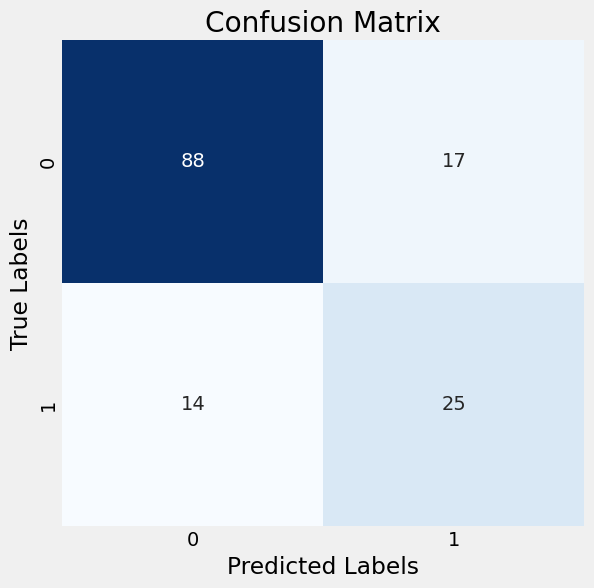

Accuracy: 0.78
Precision: 0.60
Recall: 0.64
F1-Score: 0.62
Confusion Matrix:
[[88 17]
 [14 25]]
Odds Ratio: None


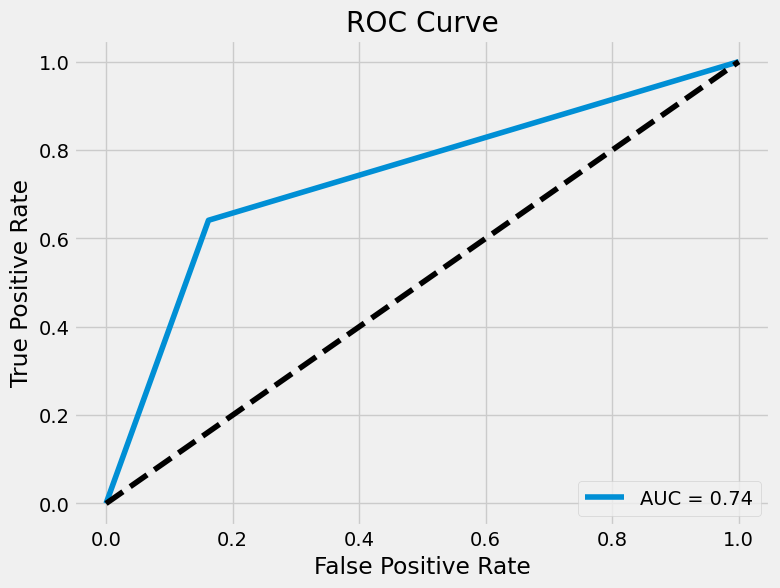

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

f1.loc[:, 'Price_Change'] = np.where(f1['Close'] > f1['Open'], 1, 0)

# Assuming 'f1' is your DataFrame
X = f1[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = f1['Price Change']  # Target variable

# Convert 'Price Change' to discrete classes (increase or decrease)
y = y.apply(lambda x: 1 if x > 0 else 0)

# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit the decision tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Calculate the metrics
acc4 = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Calculate the odds ratio
odds_ratio = None  # Add your calculation here

print(f'Accuracy: {acc4:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-Score: {f1_f1:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print(f'Odds Ratio: {odds_ratio}')

# Get the predicted probabilities for the positive class
y_pred_prob = dt_classifier.predict_proba(X_test)[:, 1]

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate the AUC (Area Under the Curve)
auc = roc_auc_score(y_test, y_pred_prob)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


### Choosing the best Stock based on Accuracy

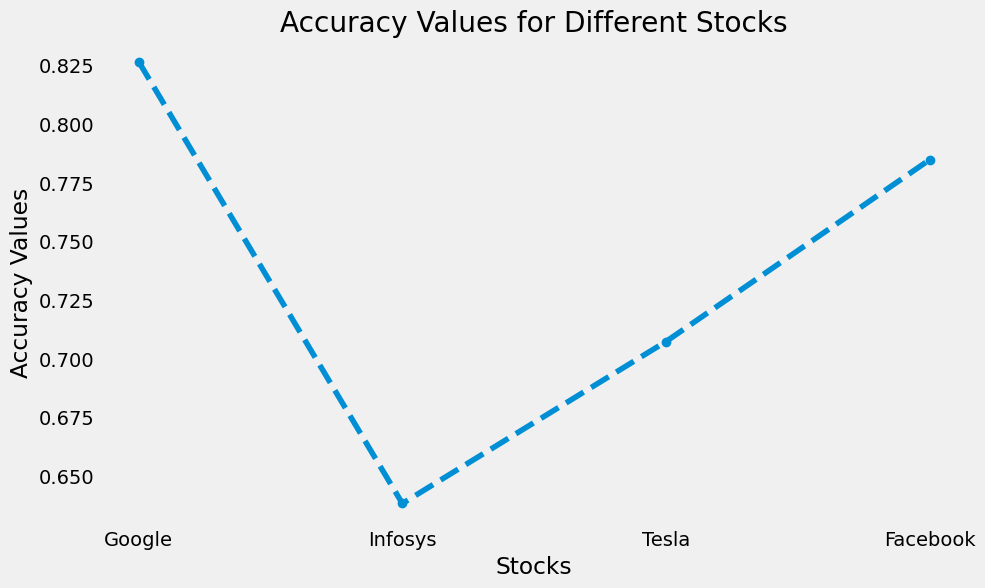

The best company based on accuracy is Google.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data
stocks = ['Google', 'Infosys', 'Tesla', 'Facebook']
acc_values = [acc1, acc2, acc3, acc4]

# Create a figure and a set of subplots
plt.figure(figsize=(10, 6))

# Plot the R-squared values
plt.plot(stocks, acc_values, marker='o', linestyle='--')

# Find the company with the highest R-squared value
best_stock = stocks[np.argmax(r2_values)]

# Customize the plot
plt.xlabel('Stocks')
plt.ylabel('Accuracy Values')
plt.title('Accuracy Values for Different Stocks')
plt.grid()

# Display the plot
plt.show()

# Print the company with the best R-squared value
print(f"The best company based on accuracy is {best_stock}.")


# Bias -Variance Trade Off

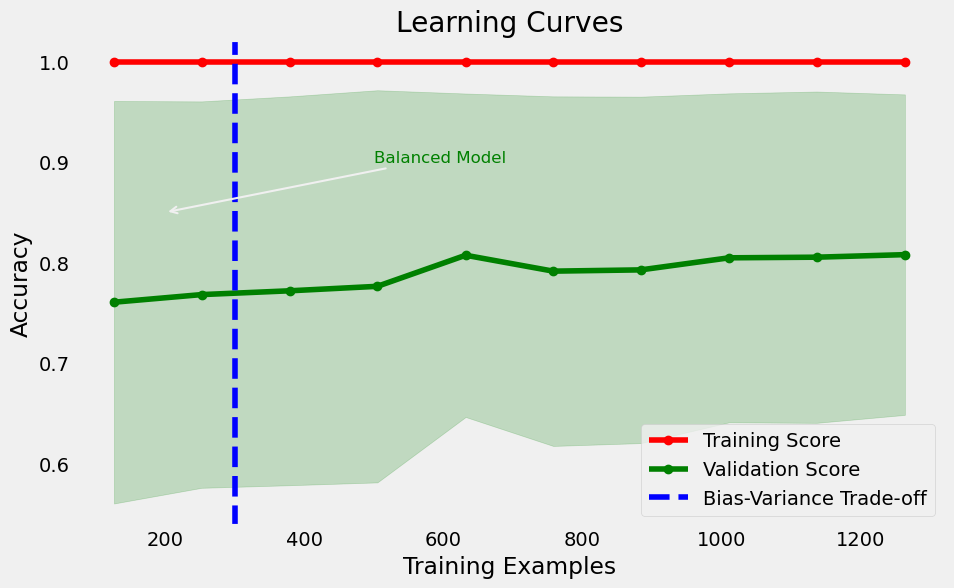

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset
# ggl = pd.read_csv('ggl.csv')

# Assuming 'ggl' is your DataFrame
X = ggl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (ggl['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Define a base classifier (Decision Tree in this example)
base_classifier = DecisionTreeClassifier(random_state=42)

# Create learning curves
train_sizes, train_scores, test_scores = learning_curve(
    base_classifier, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and standard deviation for the training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Create a plot to visualize the learning curves
plt.figure(figsize=(10, 6))
plt.title("Learning Curves")
plt.xlabel("Training Examples")
plt.ylabel("Accuracy")
plt.grid()

# Plot the mean training and validation scores
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation Score")

# Plot the standard deviations as shaded regions
plt.fill_between(
    train_sizes,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    color="r",
    alpha=0.2,
)
plt.fill_between(
    train_sizes,
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    color="g",
    alpha=0.2,
)

# Plot the bias-variance trade-off line (adjust as needed)
plt.axvline(300, color='blue', linestyle='--', label='Bias-Variance Trade-off')

plt.legend(loc="best")

# Annotate the graph with overfitting, underfitting, or balanced model
plt.annotate('Balanced Model', xy=(200, 0.85), xytext=(500, 0.9),
             arrowprops=dict(arrowstyle='->', lw=1.5),
             fontsize=12, color='green')

plt.show()

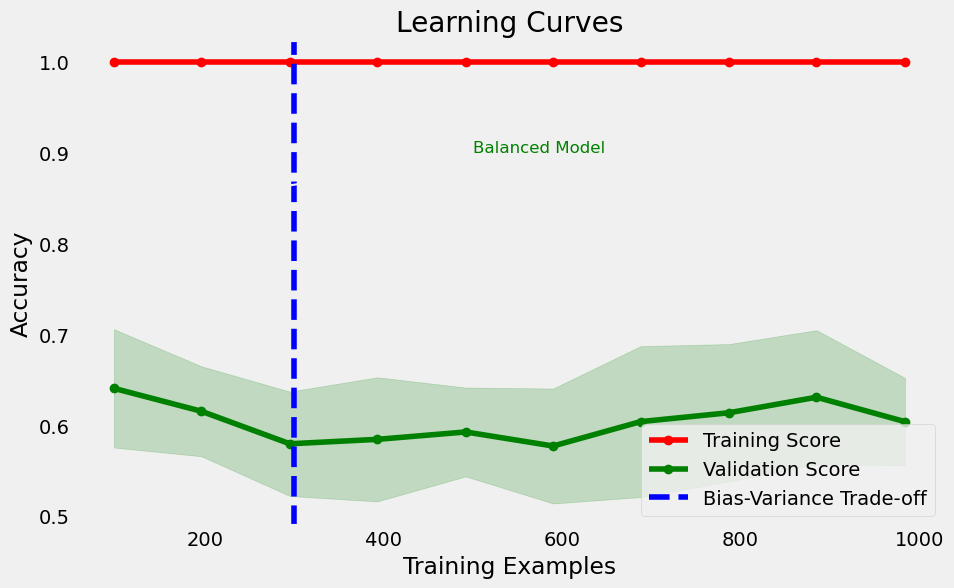

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset
# ggl = pd.read_csv('ggl.csv')

# Assuming 'ggl' is your DataFrame
X = inf[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (inf['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Define a base classifier (Decision Tree in this example)
base_classifier = DecisionTreeClassifier(random_state=42)

# Create learning curves
train_sizes, train_scores, test_scores = learning_curve(
    base_classifier, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and standard deviation for the training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Create a plot to visualize the learning curves
plt.figure(figsize=(10, 6))
plt.title("Learning Curves")
plt.xlabel("Training Examples")
plt.ylabel("Accuracy")
plt.grid()

# Plot the mean training and validation scores
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation Score")

# Plot the standard deviations as shaded regions
plt.fill_between(
    train_sizes,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    color="r",
    alpha=0.2,
)
plt.fill_between(
    train_sizes,
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    color="g",
    alpha=0.2,
)

# Plot the bias-variance trade-off line (adjust as needed)
plt.axvline(300, color='blue', linestyle='--', label='Bias-Variance Trade-off')

plt.legend(loc="best")

# Annotate the graph with overfitting, underfitting, or balanced model
plt.annotate('Balanced Model', xy=(200, 0.85), xytext=(500, 0.9),
             arrowprops=dict(arrowstyle='->', lw=1.5),
             fontsize=12, color='green')

plt.show()

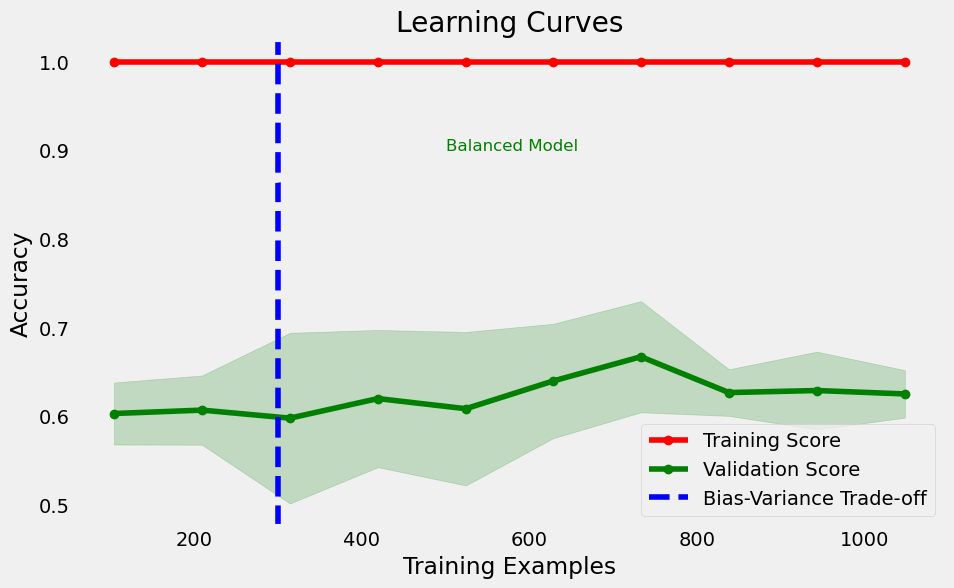

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset
# ggl = pd.read_csv('ggl.csv')

# Assuming 'ggl' is your DataFrame
X = tsl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (tsl['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Define a base classifier (Decision Tree in this example)
base_classifier = DecisionTreeClassifier(random_state=42)

# Create learning curves
train_sizes, train_scores, test_scores = learning_curve(
    base_classifier, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and standard deviation for the training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Create a plot to visualize the learning curves
plt.figure(figsize=(10, 6))
plt.title("Learning Curves")
plt.xlabel("Training Examples")
plt.ylabel("Accuracy")
plt.grid()

# Plot the mean training and validation scores
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation Score")

# Plot the standard deviations as shaded regions
plt.fill_between(
    train_sizes,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    color="r",
    alpha=0.2,
)
plt.fill_between(
    train_sizes,
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    color="g",
    alpha=0.2,
)

# Plot the bias-variance trade-off line (adjust as needed)
plt.axvline(300, color='blue', linestyle='--', label='Bias-Variance Trade-off')

plt.legend(loc="best")

# Annotate the graph with overfitting, underfitting, or balanced model
plt.annotate('Balanced Model', xy=(200, 0.85), xytext=(500, 0.9),
             arrowprops=dict(arrowstyle='->', lw=1.5),
             fontsize=12, color='green')

plt.show()

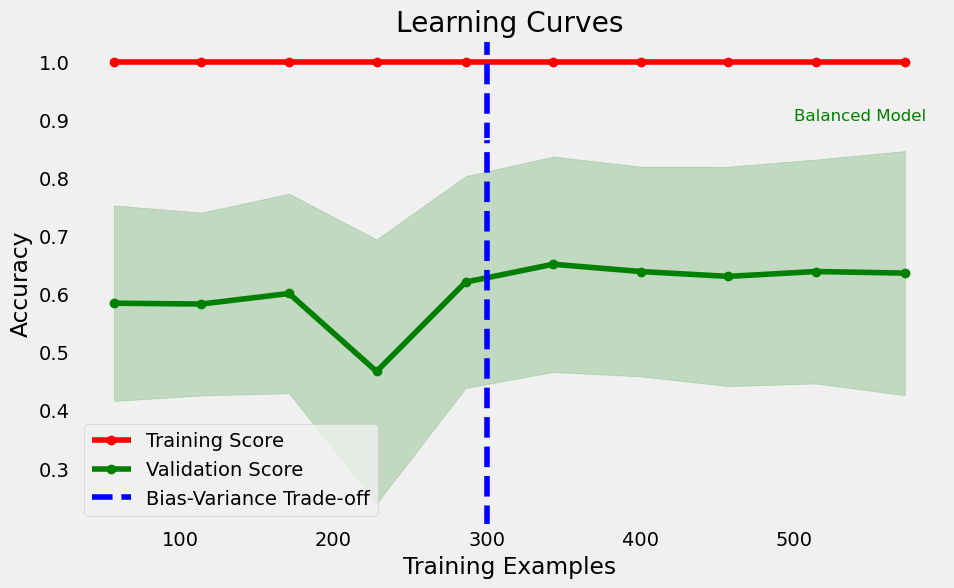

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset
# ggl = pd.read_csv('ggl.csv')

# Assuming 'ggl' is your DataFrame
X = f1[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (f1['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Define a base classifier (Decision Tree in this example)
base_classifier = DecisionTreeClassifier(random_state=42)

# Create learning curves
train_sizes, train_scores, test_scores = learning_curve(
    base_classifier, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and standard deviation for the training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Create a plot to visualize the learning curves
plt.figure(figsize=(10, 6))
plt.title("Learning Curves")
plt.xlabel("Training Examples")
plt.ylabel("Accuracy")
plt.grid()

# Plot the mean training and validation scores
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation Score")

# Plot the standard deviations as shaded regions
plt.fill_between(
    train_sizes,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    color="r",
    alpha=0.2,
)
plt.fill_between(
    train_sizes,
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    color="g",
    alpha=0.2,
)

# Plot the bias-variance trade-off line (adjust as needed)
plt.axvline(300, color='blue', linestyle='--', label='Bias-Variance Trade-off')

plt.legend(loc="best")

# Annotate the graph with overfitting, underfitting, or balanced model
plt.annotate('Balanced Model', xy=(200, 0.85), xytext=(500, 0.9),
             arrowprops=dict(arrowstyle='->', lw=1.5),
             fontsize=12, color='green')

plt.show()

# Classification

# Hyper Parameter Tuning

In [ ]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# Assuming you have your feature matrix X and target vector y
# Replace X and y with your actual feature matrix and target vector
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert the target variable to integers
y_train = np.array(y_train).astype(int)
y_test = np.array(y_test).astype(int)

# Create a Decision Tree classifier
dt_classifier = DecisionTreeClassifier()

# Define a grid of hyperparameters to search
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a GridSearchCV object
grid_search = GridSearchCV(dt_classifier, param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_model = grid_search.best_estimator_

# Make predictions with the best model
y_pred = best_model.predict(X_test)

# Calculate the accuracy of the best model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of the best model: {accuracy}")

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5}
Accuracy of the best model: 0.8391167192429022


# Decision Trees

C:\Users\HP\AppData\Local\Temp\ipykernel_8484\3512275892.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Open'] = le_Open.fit_transform(X['Open'])
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\3512275892.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['High'] = le_High.fit_transform(X['High'])
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\3512275892.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

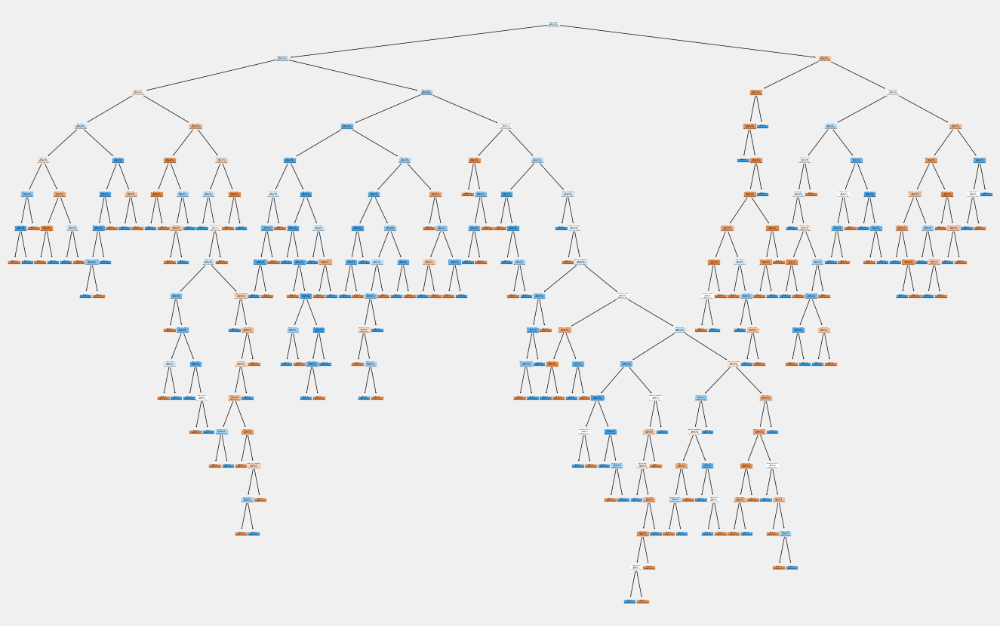

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'inf' is your DataFrame
# inf.loc[:, 'Date'] = pd.to_datetime(inf['Date'], format='%d-%m-%Y')

X = ggl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = ggl['Price Change']  # Target variable

# Convert 'Price Change' to discrete classes (increase or decrease)
y = y.apply(lambda x: 'Price Increase' if x > 0 else 'Price Decrease')

# Label Encoding for 'Open', 'High', 'Low', 'Adj Close'
le_Open = LabelEncoder()
le_High = LabelEncoder()
le_Low = LabelEncoder()
le_AdjClose = LabelEncoder()

X['Open'] = le_Open.fit_transform(X['Open'])
X['High'] = le_High.fit_transform(X['High'])
X['Low'] = le_Low.fit_transform(X['Low'])
X['Adj Close'] = le_AdjClose.fit_transform(X['Adj Close'])

# Label Encoding for 'Date'

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and fitting the decision tree classifier with Gini index
dt_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
dt_classifier.fit(X_train, y_train)

# Making predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Print the decision tree
plt.figure(figsize=(15, 10))
plot_tree(dt_classifier, filled=True, feature_names=['Open', 'High', 'Low', 'Adj Close', 'Volume'], class_names=['Price Decrease', 'Price Increase'])
plt.show()


### Evaluation Metrics and Performance

Accuracy: 0.7847222222222222
Confusion Matrix:
[[88 17]
 [14 25]]
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.84      0.85       105
           1       0.60      0.64      0.62        39

    accuracy                           0.78       144
   macro avg       0.73      0.74      0.73       144
weighted avg       0.79      0.78      0.79       144



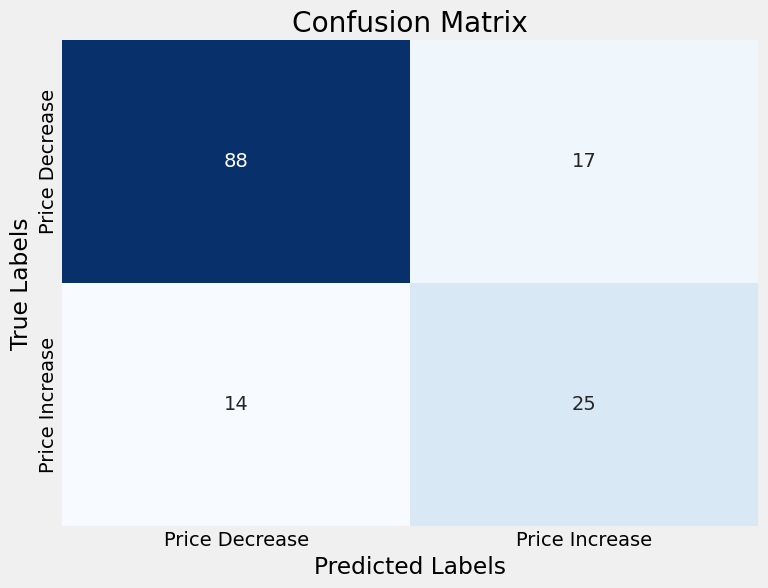

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score
import seaborn as sns

# Calculate accuracy
dt1 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {dt1}")

# Create confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Generate classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Price Decrease', 'Price Increase'], 
            yticklabels=['Price Decrease', 'Price Increase'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()



C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1196794384.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Open'] = le_Open.fit_transform(X['Open'])
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1196794384.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['High'] = le_High.fit_transform(X['High'])
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1196794384.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

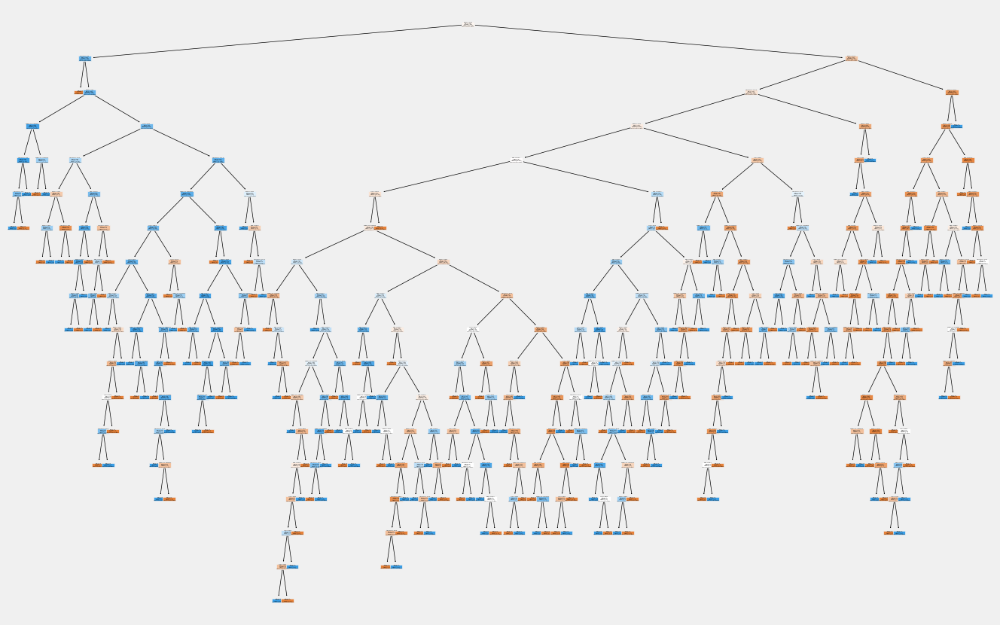

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
# inf.loc[:, 'Date'] = pd.to_datetime(f1['Date'], format='%d-%m-%Y')

# Assuming 'inf' is your DataFrame
X = inf[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = inf['Price Change']  # Target variable

# Convert 'Price Change' to discrete classes (increase or decrease)
y = y.apply(lambda x: 'Price Increase' if x > 0 else 'Price Decrease')

# Label Encoding for 'Open', 'High', 'Low', 'Adj Close'
le_Open = LabelEncoder()
le_High = LabelEncoder()
le_Low = LabelEncoder()
le_AdjClose = LabelEncoder()

X['Open'] = le_Open.fit_transform(X['Open'])
X['High'] = le_High.fit_transform(X['High'])
X['Low'] = le_Low.fit_transform(X['Low'])
X['Adj Close'] = le_AdjClose.fit_transform(X['Adj Close'])

# Label Encoding for 'Date'
# label_encoder = LabelEncoder()
# X['Date'] = label_encoder.fit_transform(X['Date'])

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and fitting the decision tree classifier with Gini index
dt_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
dt_classifier.fit(X_train, y_train)

# Making predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Print the decision tree
plt.figure(figsize=(15, 10))
plot_tree(dt_classifier, filled=True, feature_names=['Open', 'High', 'Low', 'Adj Close', 'Volume', 'Date'], class_names=['Price Decrease', 'Price Increase'])
plt.show()


### Evaluation Metrics and Performance

Accuracy: 0.7847222222222222
Confusion Matrix:
[[88 17]
 [14 25]]
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.84      0.85       105
           1       0.60      0.64      0.62        39

    accuracy                           0.78       144
   macro avg       0.73      0.74      0.73       144
weighted avg       0.79      0.78      0.79       144



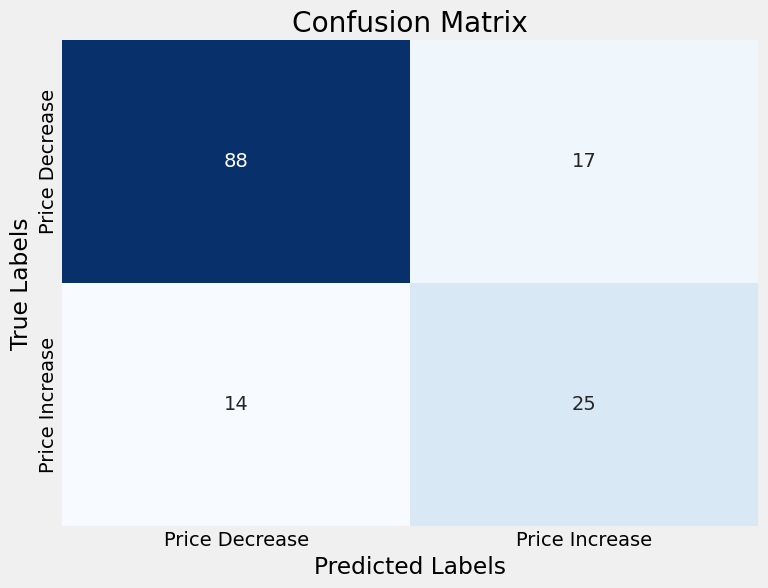

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score
import seaborn as sns

# Calculate accuracy
dt2 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {dt2}")

# Create confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Generate classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Price Decrease', 'Price Increase'], 
            yticklabels=['Price Decrease', 'Price Increase'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()



C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1086440053.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Open'] = le_Open.fit_transform(X['Open'])
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1086440053.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['High'] = le_High.fit_transform(X['High'])
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1086440053.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

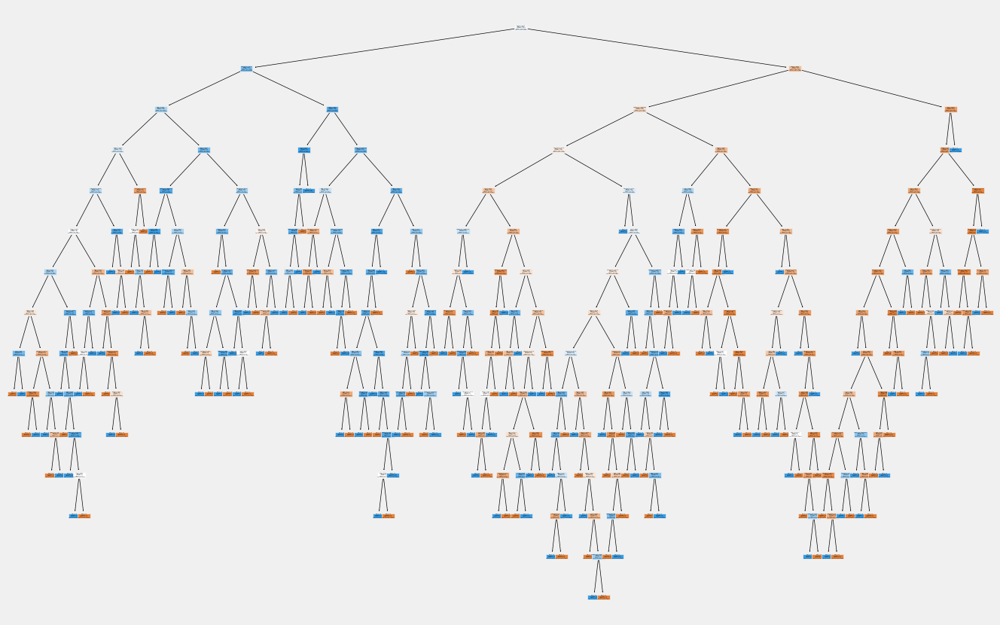

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
# inf.loc[:, 'Date'] = pd.to_datetime(f1['Date'], format='%d-%m-%Y')

# Assuming 'inf' is your DataFrame
X = tsl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = tsl['Price Change']  # Target variable

# Convert 'Price Change' to discrete classes (increase or decrease)
y = y.apply(lambda x: 'Price Increase' if x > 0 else 'Price Decrease')

# Label Encoding for 'Open', 'High', 'Low', 'Adj Close'
le_Open = LabelEncoder()
le_High = LabelEncoder()
le_Low = LabelEncoder()
le_AdjClose = LabelEncoder()

X['Open'] = le_Open.fit_transform(X['Open'])
X['High'] = le_High.fit_transform(X['High'])
X['Low'] = le_Low.fit_transform(X['Low'])
X['Adj Close'] = le_AdjClose.fit_transform(X['Adj Close'])

# # Label Encoding for 'Date'
# label_encoder = LabelEncoder()
# X['Date'] = label_encoder.fit_transform(X['Date'])

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and fitting the decision tree classifier with Gini index
dt_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
dt_classifier.fit(X_train, y_train)

# Making predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Print the decision tree
plt.figure(figsize=(15, 10))
plot_tree(dt_classifier, filled=True, feature_names=['Open', 'High', 'Low', 'Adj Close', 'Volume', 'Date'], class_names=['Price Decrease', 'Price Increase'])
plt.show()


### Evaluation Metrics and Performance

Accuracy: 0.7847222222222222
Confusion Matrix:
[[88 17]
 [14 25]]
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.84      0.85       105
           1       0.60      0.64      0.62        39

    accuracy                           0.78       144
   macro avg       0.73      0.74      0.73       144
weighted avg       0.79      0.78      0.79       144



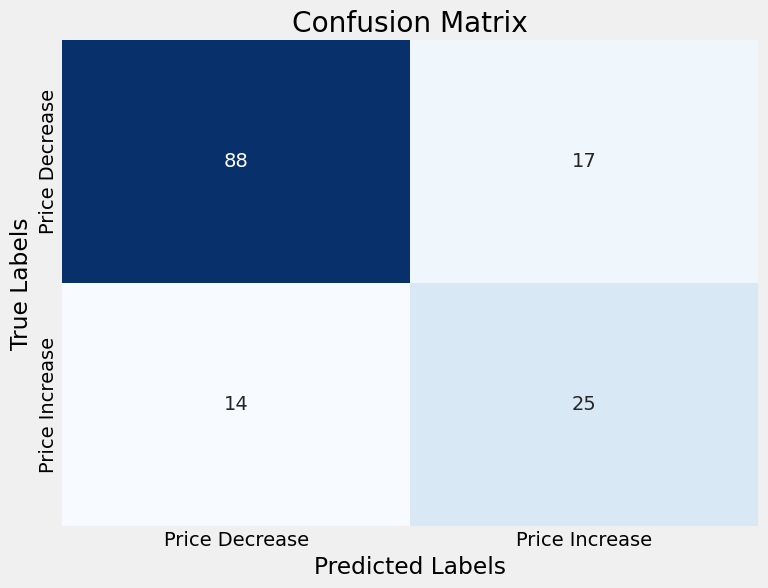

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score
import seaborn as sns

# Calculate accuracy
dt3 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {dt3}")

# Create confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Generate classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Price Decrease', 'Price Increase'], 
            yticklabels=['Price Decrease', 'Price Increase'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()



C:\Users\HP\AppData\Local\Temp\ipykernel_8484\2548667124.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Open'] = le_Open.fit_transform(X['Open'])
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\2548667124.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['High'] = le_High.fit_transform(X['High'])
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\2548667124.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = valu

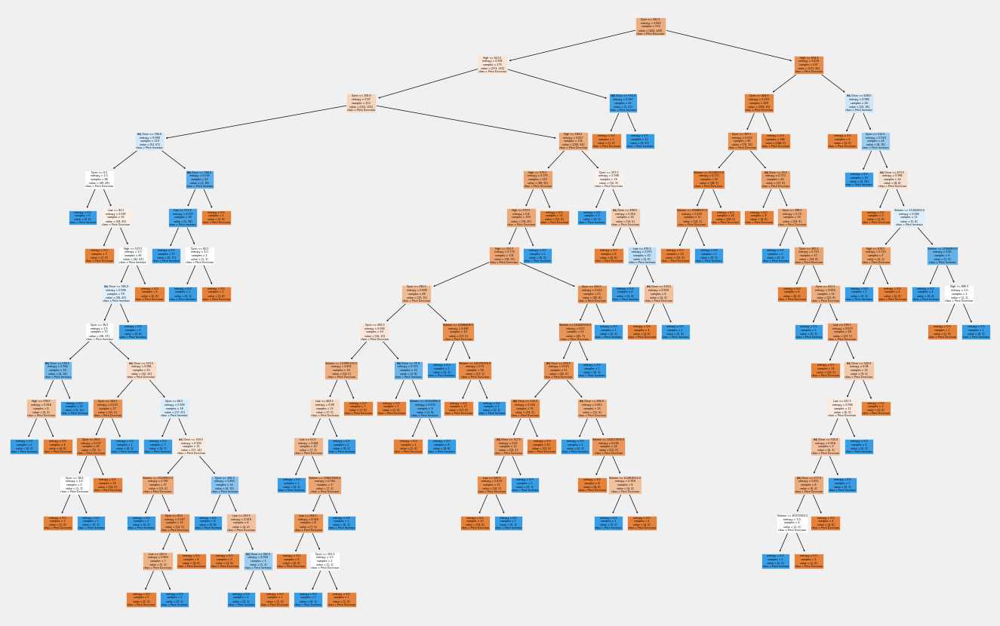

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
# inf.loc[:, 'Date'] = pd.to_datetime(f1['Date'], format='%d-%m-%Y')

# Assuming 'inf' is your DataFrame
X = f1[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = f1['Price Change']  # Target variable

# Convert 'Price Change' to discrete classes (increase or decrease)
y = y.apply(lambda x: 'Price Increase' if x > 0 else 'Price Decrease')

# Label Encoding for 'Open', 'High', 'Low', 'Adj Close'
le_Open = LabelEncoder()
le_High = LabelEncoder()
le_Low = LabelEncoder()
le_AdjClose = LabelEncoder()

X['Open'] = le_Open.fit_transform(X['Open'])
X['High'] = le_High.fit_transform(X['High'])
X['Low'] = le_Low.fit_transform(X['Low'])
X['Adj Close'] = le_AdjClose.fit_transform(X['Adj Close'])

# Label Encoding for 'Date'
# label_encoder = LabelEncoder()
# X['Date'] = label_encoder.fit_transform(X['Date'])

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and fitting the decision tree classifier with Gini index
dt_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
dt_classifier.fit(X_train, y_train)

# Making predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Print the decision tree
plt.figure(figsize=(15, 10))
plot_tree(dt_classifier, filled=True, feature_names=['Open', 'High', 'Low', 'Adj Close', 'Volume', 'Date'], class_names=['Price Decrease', 'Price Increase'])
plt.show()


### Evaluation Metrics and Performance

Accuracy: 0.7847222222222222
Confusion Matrix:
[[88 17]
 [14 25]]
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.84      0.85       105
           1       0.60      0.64      0.62        39

    accuracy                           0.78       144
   macro avg       0.73      0.74      0.73       144
weighted avg       0.79      0.78      0.79       144



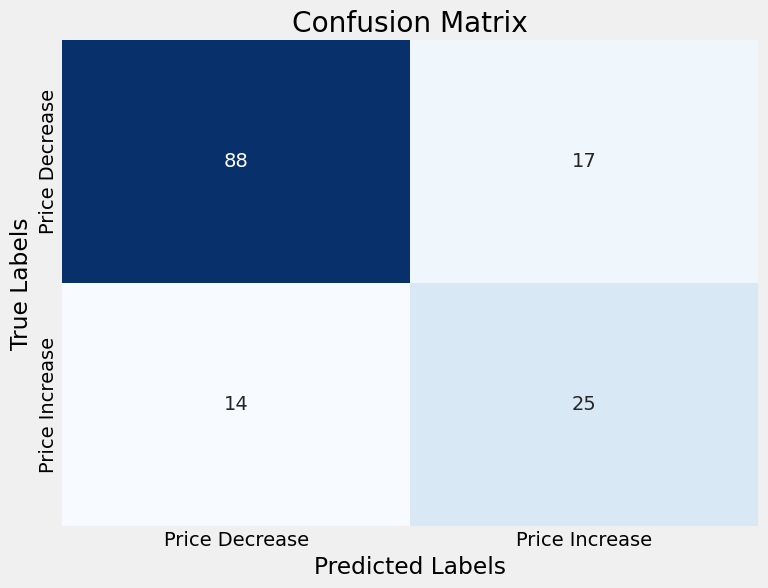

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score
import seaborn as sns

# Calculate accuracy
dt4 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {dt4}")

# Create confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Generate classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Price Decrease', 'Price Increase'], 
            yticklabels=['Price Decrease', 'Price Increase'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()



### Choosing the best Stock Based on Accuracy

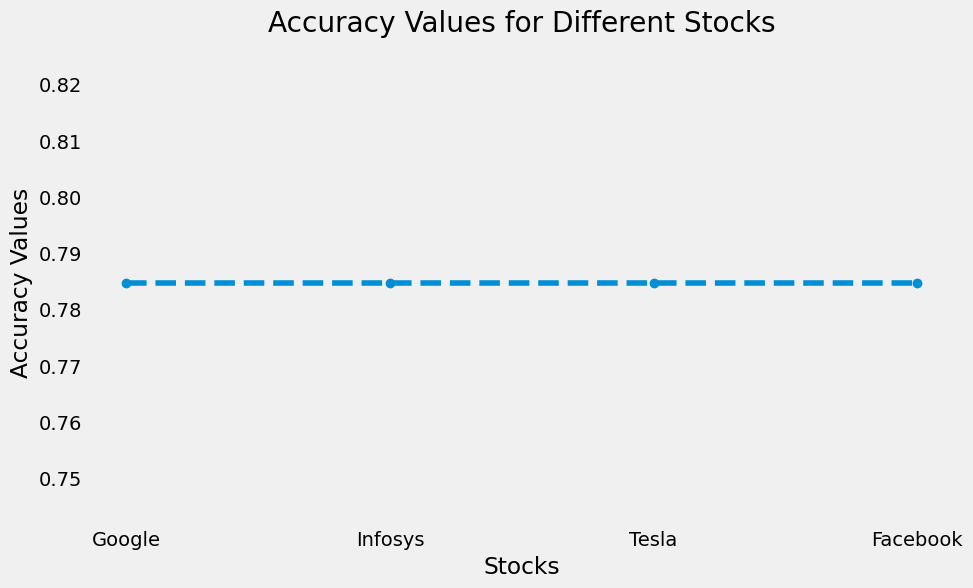

The best company based on accuracy is Google.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data
stocks = ['Google', 'Infosys', 'Tesla', 'Facebook']
dt_values = [dt1, dt2, dt3, dt4]

# Create a figure and a set of subplots
plt.figure(figsize=(10, 6))

# Plot the R-squared values
plt.plot(stocks, dt_values, marker='o', linestyle='--')

# Find the company with the highest R-squared value
best_stock = stocks[np.argmax(r2_values)]

# Customize the plot
plt.xlabel('Stocks')
plt.ylabel('Accuracy Values')
plt.title('Accuracy Values for Different Stocks')
plt.grid()

# Display the plot
plt.show()

# Print the company with the best R-squared value
print(f"The best company based on accuracy is {best_stock}.")


## Random Forest

Mean Absolute Error: 36.62306824997073
Mean Squared Error: 4396.805517240225
R2 Score: 0.21887319460778798


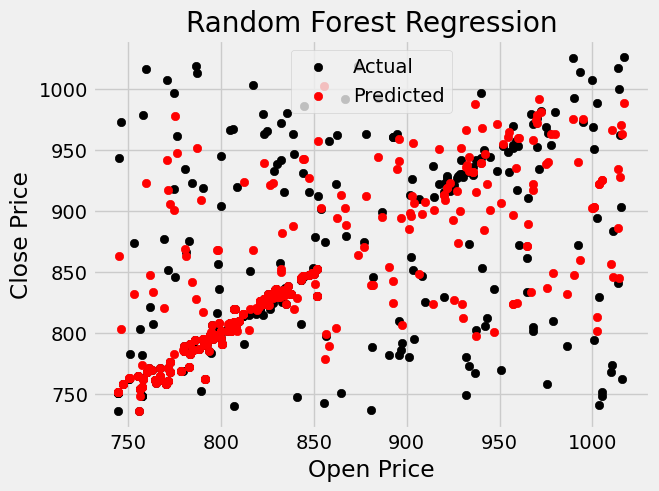

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


# Assuming ggl has columns 'Open' and 'Close', adjust accordingly if the columns are different
X = ggl[['Open']].values
y = ggl['Close'].values

# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# Training the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predicting the values
y_pred = rf.predict(X_test)

# Evaluation metrics
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))

# Visualizing the results
plt.scatter(X_test, y_test, color='black', label='Actual')
plt.scatter(X_test, y_pred, color='red', label='Predicted')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.title('Random Forest Regression')
plt.legend()
plt.show()


Mean Absolute Error: 0.6441778952553818
Mean Squared Error: 0.6639792448910384
R2 Score: -0.5266579946983214


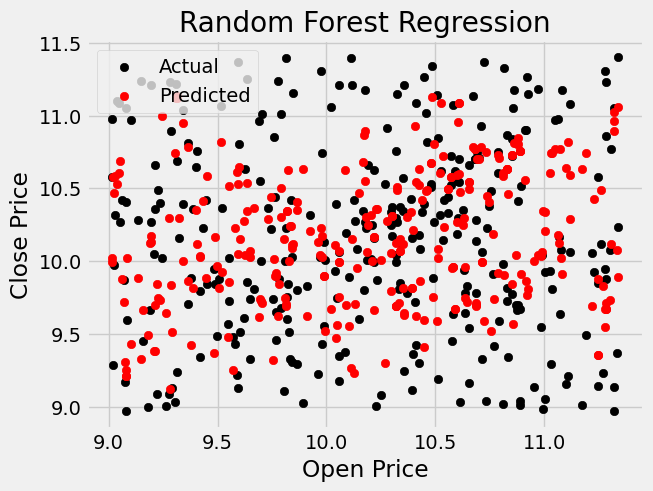

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Assuming ggl is your DataFrame

# Assuming ggl has columns 'Open' and 'Close', adjust accordingly if the columns are different
X = inf[['Open']].values
y = inf['Close'].values

# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# Training the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predicting the values
y_pred = rf.predict(X_test)

# Evaluation metrics
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))

# Visualizing the results
plt.scatter(X_test, y_test, color='black', label='Actual')
plt.scatter(X_test, y_pred, color='red', label='Predicted')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.title('Random Forest Regression')
plt.legend()
plt.show()


Mean Absolute Error: 35.49406833212422
Mean Squared Error: 1865.135055475611
R2 Score: -0.5359716844882612


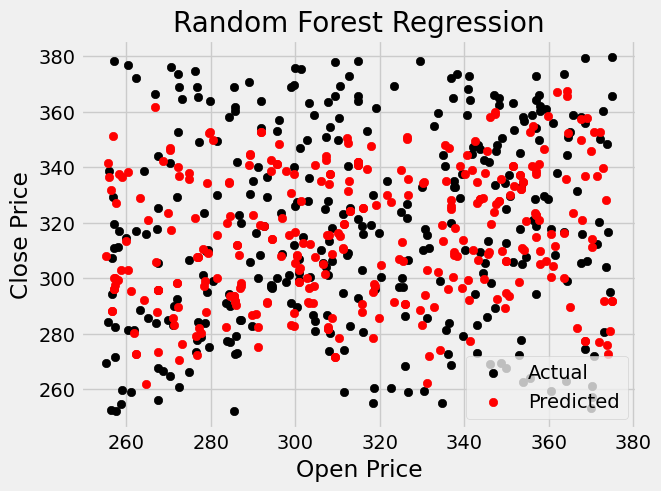

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Assuming ggl is your DataFrame

# Assuming ggl has columns 'Open' and 'Close', adjust accordingly if the columns are different
X = tsl[['Open']].values
y = tsl['Close'].values

# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# Training the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predicting the values
y_pred = rf.predict(X_test)

# Evaluation metrics
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))

# Visualizing the results
plt.scatter(X_test, y_test, color='black', label='Actual')
plt.scatter(X_test, y_pred, color='red', label='Predicted')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.title('Random Forest Regression')
plt.legend()
plt.show()


Mean Absolute Error: 19.853398814926763
Mean Squared Error: 652.2769704310371
R2 Score: -0.22301813607983267


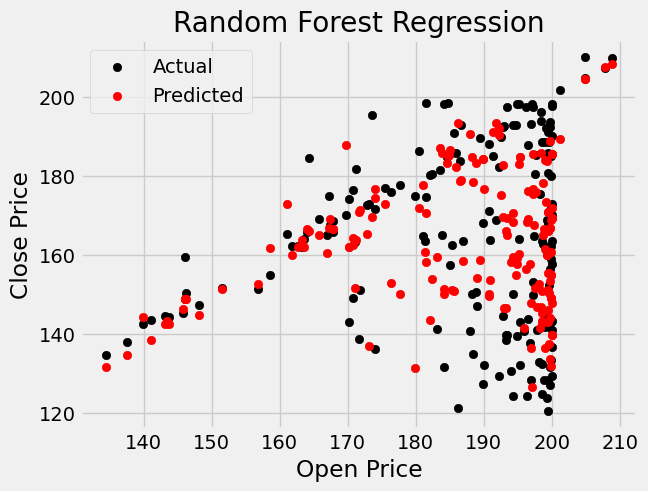

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Assuming ggl is your DataFrame

# Assuming ggl has columns 'Open' and 'Close', adjust accordingly if the columns are different
X = f1[['Open']].values
y = f1['Close'].values

# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# Training the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predicting the values
y_pred = rf.predict(X_test)

# Evaluation metrics
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))

# Visualizing the results
plt.scatter(X_test, y_test, color='black', label='Actual')
plt.scatter(X_test, y_pred, color='red', label='Predicted')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.title('Random Forest Regression')
plt.legend()
plt.show()


# KNN Classification


Accuracy: 0.7634069400630915
Confusion Matrix:
[[ 96  46]
 [ 29 146]]
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.68      0.72       142
           1       0.76      0.83      0.80       175

    accuracy                           0.76       317
   macro avg       0.76      0.76      0.76       317
weighted avg       0.76      0.76      0.76       317




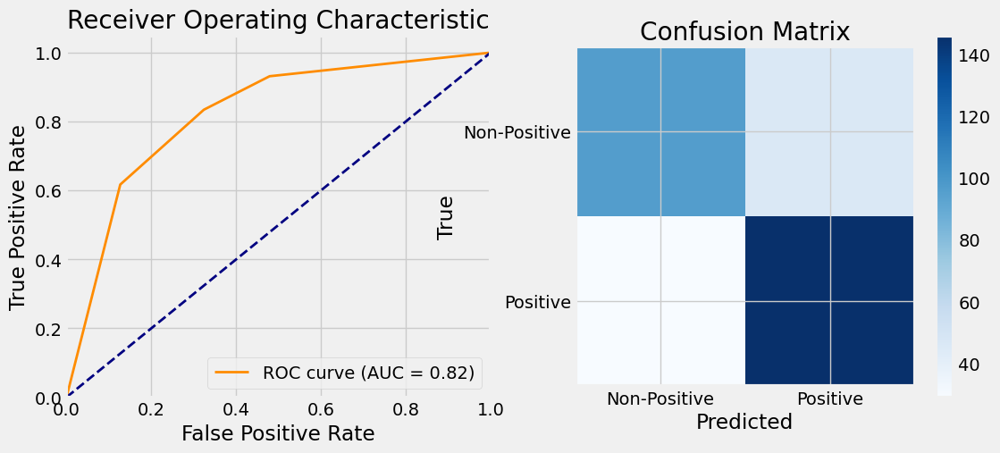

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, auc

X = ggl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (ggl['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

K = 3

# Create a k-NN classifier with K neighbors
knn = KNeighborsClassifier(n_neighbors=K)

# Fit the model to the training data
knn.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn.predict(X_test)

# Evaluate the performance
k1 = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {k1}")
print("Confusion Matrix:")
print(confusion)
print("Classification Report:")
print(classification_rep)

# Calculate ROC curve and AUC
y_prob = knn.predict_proba(X_test)[:, 1]  # Get the probability of the positive class
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Plot Confusion Matrix
plt.subplot(1, 2, 2)
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Blues'))
print()
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Non-Positive', 'Positive'])
plt.yticks(tick_marks, ['Non-Positive', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

Accuracy: 0.4796747967479675
Confusion Matrix:
[[49 59]
 [69 69]]
Classification Report:
              precision    recall  f1-score   support

           0       0.42      0.45      0.43       108
           1       0.54      0.50      0.52       138

    accuracy                           0.48       246
   macro avg       0.48      0.48      0.48       246
weighted avg       0.48      0.48      0.48       246




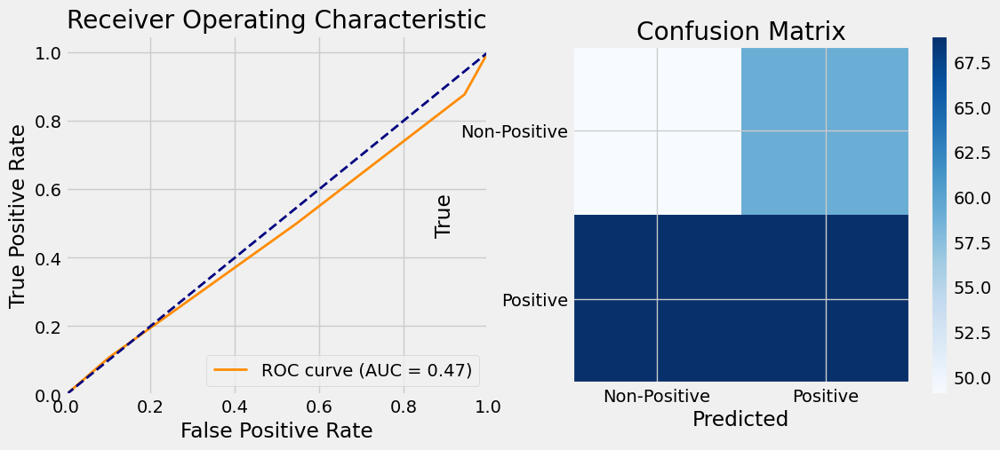

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, auc

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset

# Assuming 'ggl' is your DataFrame
X = inf[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (inf['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of nearest neighbors (K)
K = 3

# Create a k-NN classifier with K neighbors
knn = KNeighborsClassifier(n_neighbors=K)

# Fit the model to the training data
knn.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn.predict(X_test)

# Evaluate the performance
k2 = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {k2}")
print("Confusion Matrix:")
print(confusion)
print("Classification Report:")
print(classification_rep)

# Calculate ROC curve and AUC
y_prob = knn.predict_proba(X_test)[:, 1]  # Get the probability of the positive class
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Plot Confusion Matrix
plt.subplot(1, 2, 2)
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Blues'))
print()
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Non-Positive', 'Positive'])
plt.yticks(tick_marks, ['Non-Positive', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

Accuracy: 0.5133079847908745
Confusion Matrix:
[[54 66]
 [62 81]]
Classification Report:
              precision    recall  f1-score   support

           0       0.47      0.45      0.46       120
           1       0.55      0.57      0.56       143

    accuracy                           0.51       263
   macro avg       0.51      0.51      0.51       263
weighted avg       0.51      0.51      0.51       263




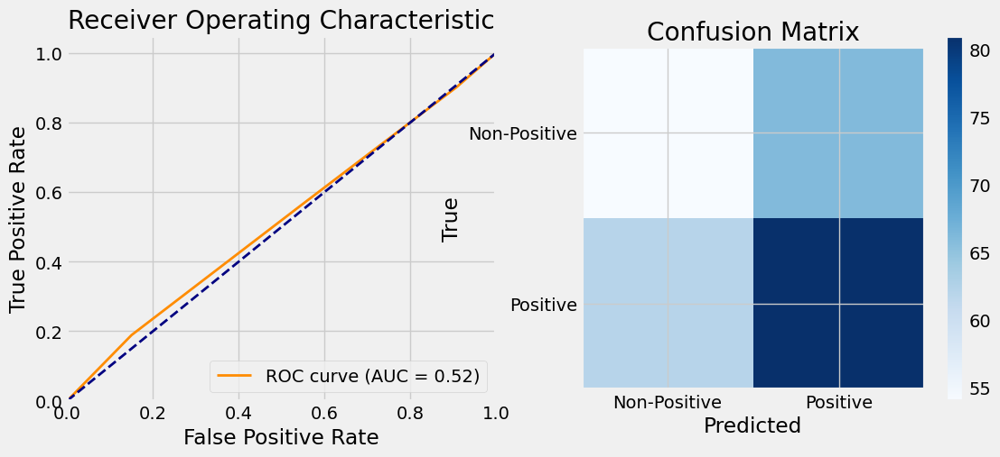

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, auc

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset

# Assuming 'ggl' is your DataFrame
X = tsl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (tsl['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of nearest neighbors (K)
K = 3

# Create a k-NN classifier with K neighbors
knn = KNeighborsClassifier(n_neighbors=K)

# Fit the model to the training data
knn.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn.predict(X_test)

# Evaluate the performance
k3 = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {k3}")
print("Confusion Matrix:")
print(confusion)
print("Classification Report:")
print(classification_rep)

# Calculate ROC curve and AUC
y_prob = knn.predict_proba(X_test)[:, 1]  # Get the probability of the positive class
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Plot Confusion Matrix
plt.subplot(1, 2, 2)
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Blues'))
print()
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Non-Positive', 'Positive'])
plt.yticks(tick_marks, ['Non-Positive', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

Accuracy: 0.7638888888888888
Confusion Matrix:
[[91 14]
 [20 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.87      0.84       105
           1       0.58      0.49      0.53        39

    accuracy                           0.76       144
   macro avg       0.70      0.68      0.69       144
weighted avg       0.75      0.76      0.76       144




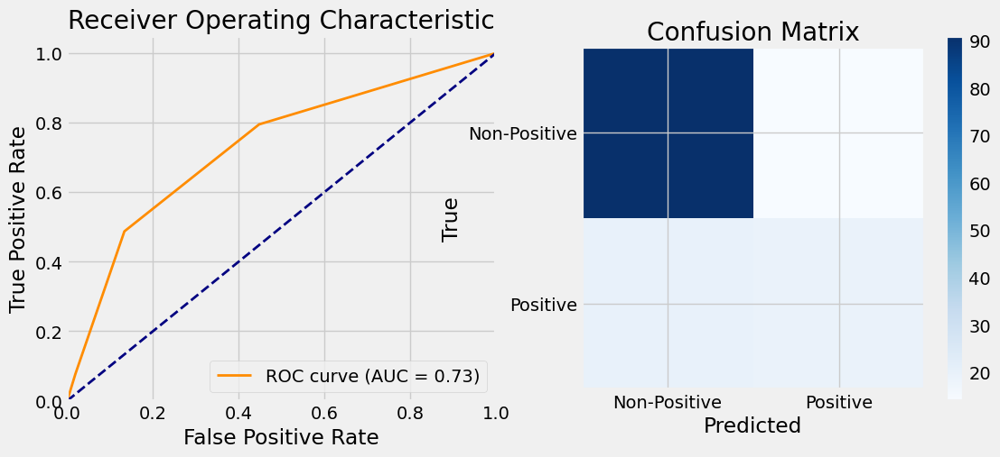

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, auc

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset

# Assuming 'ggl' is your DataFrame
X = f1[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (f1['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of nearest neighbors (K)
K = 3

# Create a k-NN classifier with K neighbors
knn = KNeighborsClassifier(n_neighbors=K)

# Fit the model to the training data
knn.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn.predict(X_test)

# Evaluate the performance
k4 = accuracy_score(y_test, y_pred)
confusion = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {k4}")
print("Confusion Matrix:")
print(confusion)
print("Classification Report:")
print(classification_rep)

# Calculate ROC curve and AUC
y_prob = knn.predict_proba(X_test)[:, 1]  # Get the probability of the positive class
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Plot Confusion Matrix
plt.subplot(1, 2, 2)
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Blues'))
print()
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Non-Positive', 'Positive'])
plt.yticks(tick_marks, ['Non-Positive', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

### Choosing the best Stock Based on Accuracy

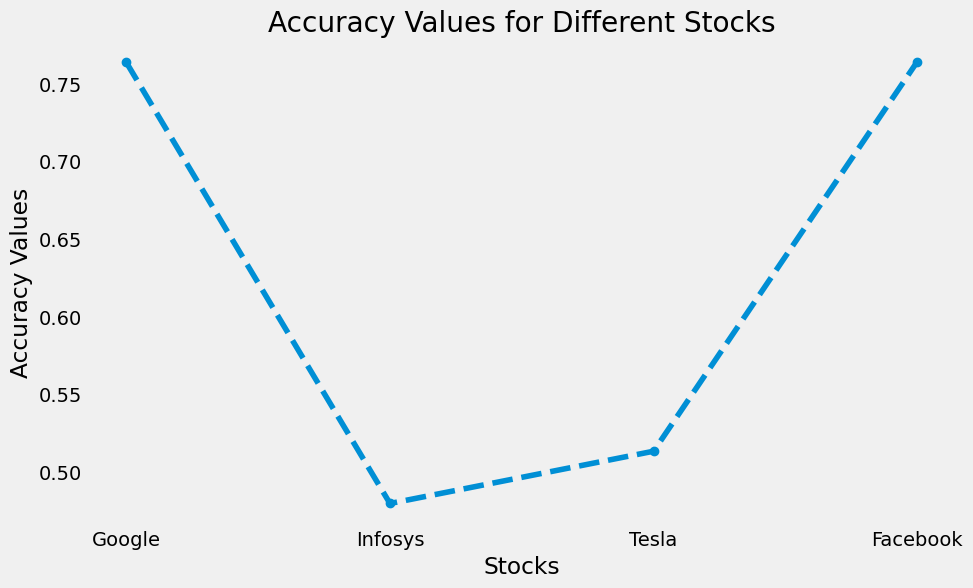

The best company based on accuracy is Google.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data
stocks = ['Google', 'Infosys', 'Tesla', 'Facebook']
dt_values = [k1, k2, k3, k4]

# Create a figure and a set of subplots
plt.figure(figsize=(10, 6))

# Plot the R-squared values
plt.plot(stocks, dt_values, marker='o', linestyle='--')

# Find the company with the highest R-squared value
best_stock = stocks[np.argmax(r2_values)]

# Customize the plot
plt.xlabel('Stocks')
plt.ylabel('Accuracy Values')
plt.title('Accuracy Values for Different Stocks')
plt.grid()

# Display the plot
plt.show()

# Print the company with the best R-squared value
print(f"The best company based on accuracy is {best_stock}.")


# Naive Bayes Classification


C:\Users\HP\AppData\Local\Temp\ipykernel_8484\96832322.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\96832322.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)


Accuracy: 0.6466876971608833
Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.44      0.53       142
           1       0.64      0.81      0.72       175

    accuracy                           0.65       317
   macro avg       0.65      0.63      0.62       317
weighted avg       0.65      0.65      0.63       317

Model Score: 0.6466876971608833
Confusion Matrix:
[[ 63  79]
 [ 33 142]]


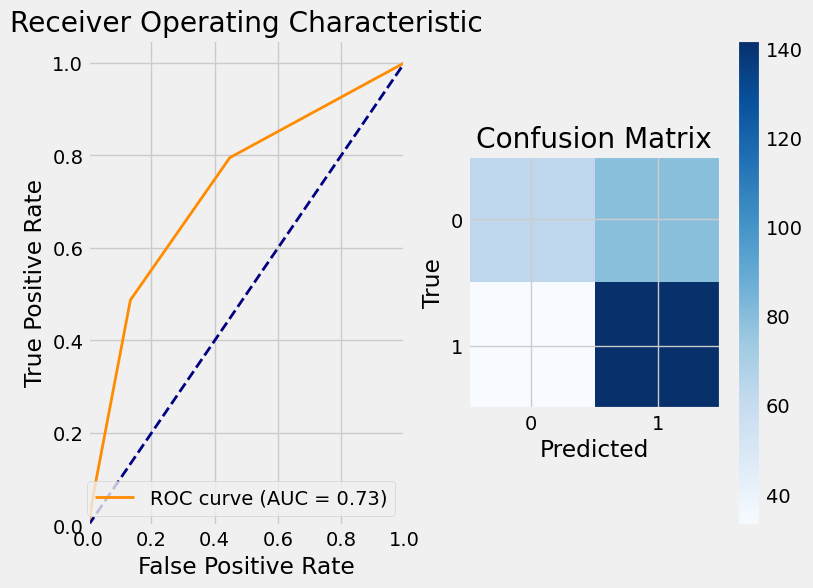

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'ggl' is your DataFrame
X = ggl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (ggl['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Handling missing values (if any)
X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X.fillna(0, inplace=True)

# Creating and fitting the Gaussian Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Making predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Calculating the accuracy
nb1 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {nb1}")

# Printing classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

# Getting prediction probabilities
y_pred_proba = nb_classifier.predict_proba(X_test)

# Creating a new DataFrame to hold prediction probabilities and actual values
results = pd.DataFrame({'Predicted Probability': y_pred_proba[:, 1], 'Actual Value': y_test})

# Getting the model score
score = nb_classifier.score(X_test, y_test)
print(f"Model Score: {score}")

# Plot the Confusion Matrix
confusion = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(confusion)

# Plot the Probability Distribution
plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Plot the Confusion Matrix
plt.subplot(1, 2, 2)
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Blues'))
plt.title('Confusion Matrix')
plt.colorbar()
classes = [str(cls) for cls in nb_classifier.classes_]
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes)
plt.yticks(tick_marks, classes)
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_8484\2783083593.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\2783083593.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)


Accuracy: 0.532319391634981
Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.24      0.32       120
           1       0.55      0.78      0.64       143

    accuracy                           0.53       263
   macro avg       0.51      0.51      0.48       263
weighted avg       0.52      0.53      0.50       263

Model Score: 0.532319391634981
Confusion Matrix:
[[ 29  91]
 [ 32 111]]


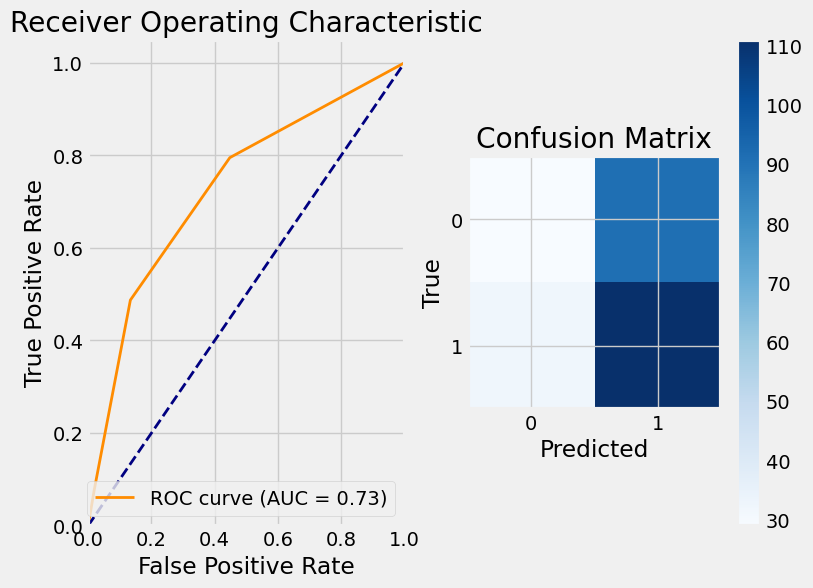

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'ggl' is your DataFrame
X = tsl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (tsl['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Handling missing values (if any)
X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X.fillna(0, inplace=True)

# Creating and fitting the Gaussian Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Making predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Calculating the accuracy
nb2 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {nb2}")

# Printing classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

# Getting prediction probabilities
y_pred_proba = nb_classifier.predict_proba(X_test)

# Creating a new DataFrame to hold prediction probabilities and actual values
results = pd.DataFrame({'Predicted Probability': y_pred_proba[:, 1], 'Actual Value': y_test})

# Getting the model score
score = nb_classifier.score(X_test, y_test)
print(f"Model Score: {score}")

# Plot the Confusion Matrix
confusion = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(confusion)

# Plot the Probability Distribution
plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Plot the Confusion Matrix
plt.subplot(1, 2, 2)
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Blues'))
plt.title('Confusion Matrix')
plt.colorbar()
classes = [str(cls) for cls in nb_classifier.classes_]
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes)
plt.yticks(tick_marks, classes)
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_8484\2814233962.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\2814233962.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)
C:\Users\HP\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(averag

Accuracy: 0.43902439024390244
Classification Report:
              precision    recall  f1-score   support

           0       0.44      1.00      0.61       108
           1       0.00      0.00      0.00       138

    accuracy                           0.44       246
   macro avg       0.22      0.50      0.31       246
weighted avg       0.19      0.44      0.27       246

Model Score: 0.43902439024390244
Confusion Matrix:
[[108   0]
 [138   0]]


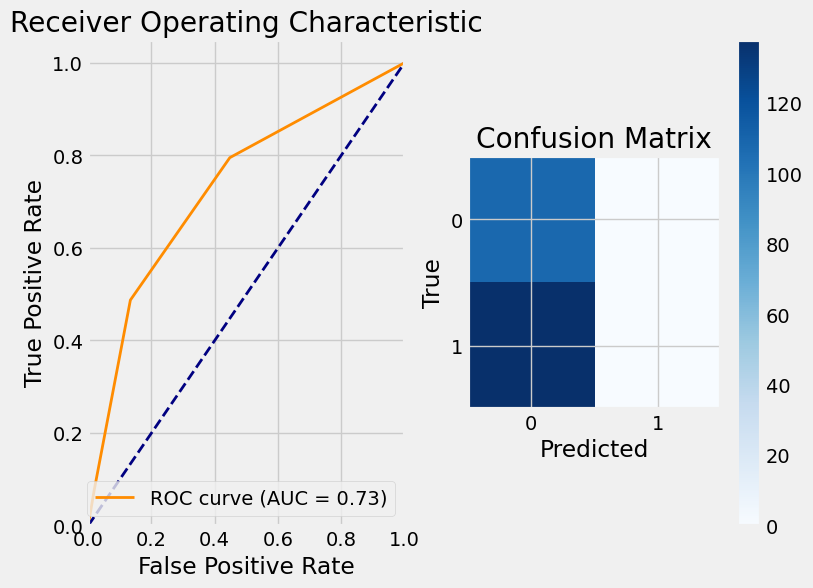

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'ggl' is your DataFrame
X = inf[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (inf['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Handling missing values (if any)
X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X.fillna(0, inplace=True)

# Creating and fitting the Gaussian Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Making predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Calculating the accuracy
nb3 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {nb3}")

# Printing classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

# Getting prediction probabilities
y_pred_proba = nb_classifier.predict_proba(X_test)

# Creating a new DataFrame to hold prediction probabilities and actual values
results = pd.DataFrame({'Predicted Probability': y_pred_proba[:, 1], 'Actual Value': y_test})

# Getting the model score
score = nb_classifier.score(X_test, y_test)
print(f"Model Score: {score}")

# Plot the Confusion Matrix
confusion = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(confusion)

# Plot the Probability Distribution
plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Plot the Confusion Matrix
plt.subplot(1, 2, 2)
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Blues'))
plt.title('Confusion Matrix')
plt.colorbar()
classes = [str(cls) for cls in nb_classifier.classes_]
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes)
plt.yticks(tick_marks, classes)
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1130374033.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1130374033.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)
C:\Users\HP\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(averag

Accuracy: 0.7291666666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.73      1.00      0.84       105
           1       0.00      0.00      0.00        39

    accuracy                           0.73       144
   macro avg       0.36      0.50      0.42       144
weighted avg       0.53      0.73      0.61       144

Model Score: 0.7291666666666666
Confusion Matrix:
[[105   0]
 [ 39   0]]


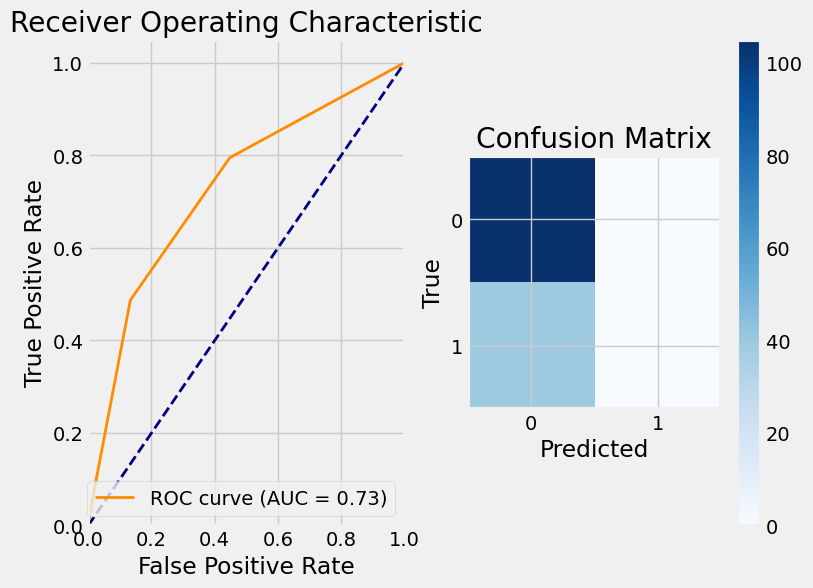

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'ggl' is your DataFrame
X = f1[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (f1['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Handling missing values (if any)
X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X.fillna(0, inplace=True)

# Creating and fitting the Gaussian Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Making predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Calculating the accuracy
nb4 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {nb4}")

# Printing classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

# Getting prediction probabilities
y_pred_proba = nb_classifier.predict_proba(X_test)

# Creating a new DataFrame to hold prediction probabilities and actual values
results = pd.DataFrame({'Predicted Probability': y_pred_proba[:, 1], 'Actual Value': y_test})

# Getting the model score
score = nb_classifier.score(X_test, y_test)
print(f"Model Score: {score}")

# Plot the Confusion Matrix
confusion = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(confusion)

# Plot the Probability Distribution
plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Plot the Confusion Matrix
plt.subplot(1, 2, 2)
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Blues'))
plt.title('Confusion Matrix')
plt.colorbar()
classes = [str(cls) for cls in nb_classifier.classes_]
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes)
plt.yticks(tick_marks, classes)
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

### Choosing the best Stock Based on Accuracy

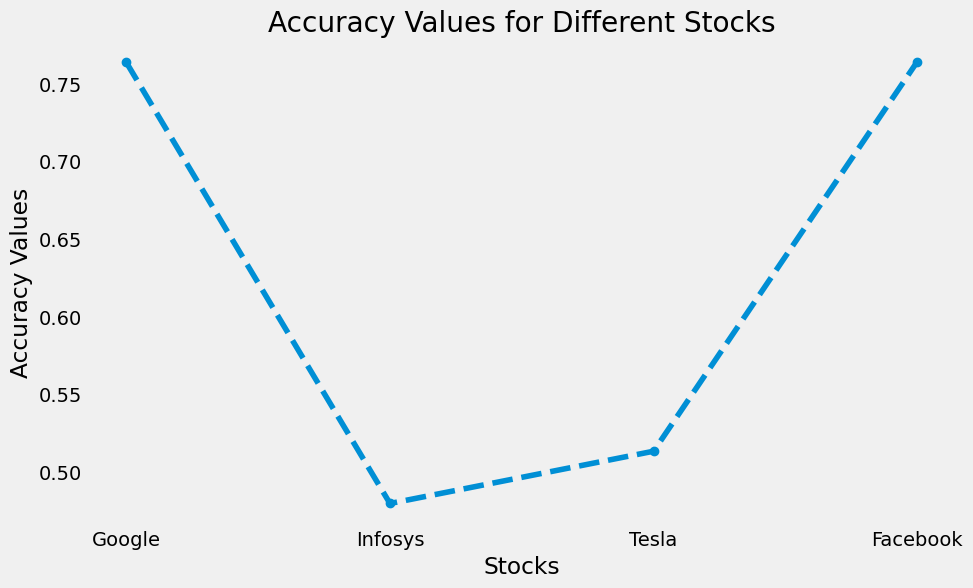

The best company based on accuracy is Google.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data
stocks = ['Google', 'Infosys', 'Tesla', 'Facebook']
dt_values = [k1, k2, k3, k4]

# Create a figure and a set of subplots
plt.figure(figsize=(10, 6))

# Plot the R-squared values
plt.plot(stocks, dt_values, marker='o', linestyle='--')

# Find the company with the highest R-squared value
best_stock = stocks[np.argmax(r2_values)]

# Customize the plot
plt.xlabel('Stocks')
plt.ylabel('Accuracy Values')
plt.title('Accuracy Values for Different Stocks')
plt.grid()

# Display the plot
plt.show()

# Print the company with the best R-squared value
print(f"The best company based on accuracy is {best_stock}.")


# Support Vector Machine


C:\Users\HP\AppData\Local\Temp\ipykernel_8484\4254991766.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\4254991766.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)


Accuracy: 0.7113821138211383
Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.81      0.71       108
           1       0.81      0.63      0.71       138

    accuracy                           0.71       246
   macro avg       0.72      0.72      0.71       246
weighted avg       0.73      0.71      0.71       246

Confusion Matrix:
[[88 20]
 [51 87]]


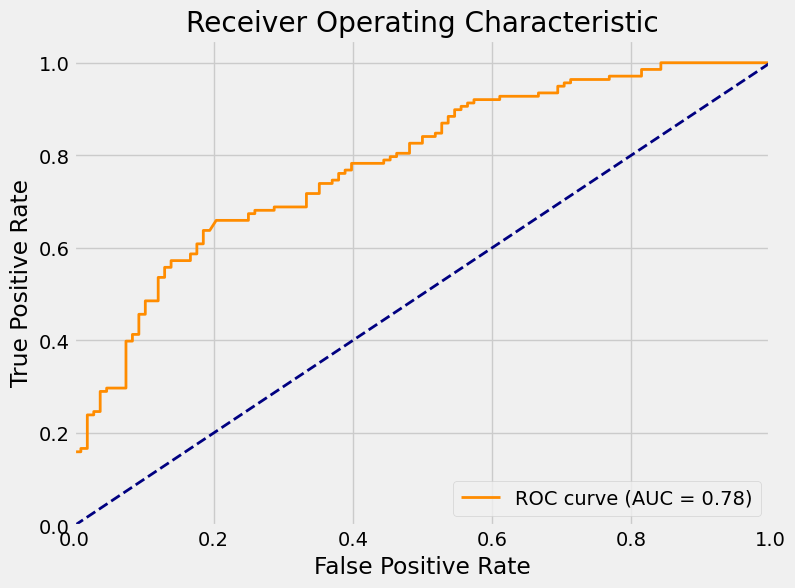

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset
# ggl = pd.read_csv('ggl.csv')

# Assuming 'ggl' is your DataFrame
X = inf[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (inf['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Handling missing values (if any)
X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X.fillna(0, inplace=True)

# Standardize the features (scaling)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Create an SVM classifier
svm_classifier = SVC(kernel='linear', probability=True, random_state=42)  # You can choose a different kernel if needed

# Fit the SVM model to the training data
svm_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = svm_classifier.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

# Get prediction probabilities
y_pred_proba = svm_classifier.predict_proba(X_test)

# Plot the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Print the confusion matrix
confusion = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(confusion)

plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1431422786.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data
C:\Users\HP\AppData\Local\Temp\ipykernel_8484\1431422786.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(0, inplace=True)


Accuracy: 0.6435331230283912
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.38      0.49       142
           1       0.63      0.86      0.73       175

    accuracy                           0.64       317
   macro avg       0.66      0.62      0.61       317
weighted avg       0.65      0.64      0.62       317

Confusion Matrix:
[[ 54  88]
 [ 25 150]]


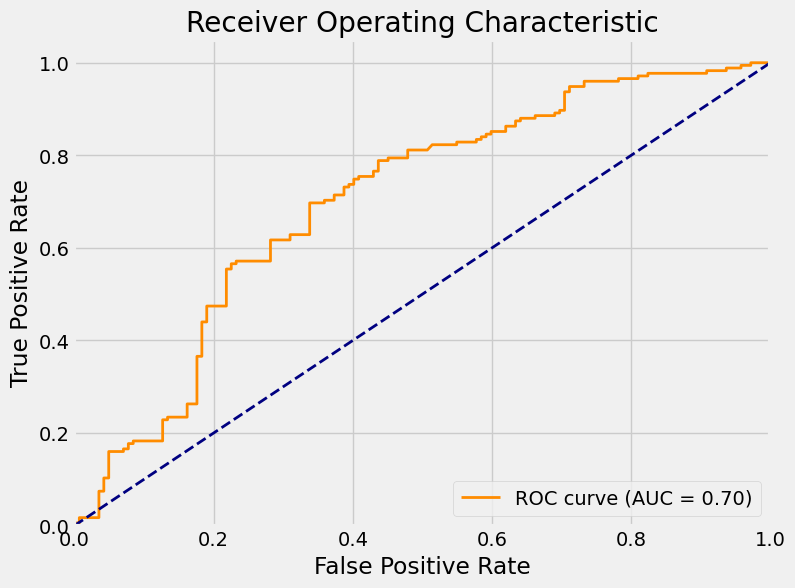

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

# Load your "ggl" dataset as a DataFrame
# Replace 'ggl.csv' with the actual file path or your preferred method of loading the dataset
# ggl = pd.read_csv('ggl.csv')

# Assuming 'ggl' is your DataFrame
X = ggl[['Open', 'High', 'Low', 'Adj Close', 'Volume']]  # Features
y = (ggl['Price Change'] > 0).astype(int)  # Convert to 1 for positive, 0 for non-positive

# Handling missing values (if any)
X.fillna(0, inplace=True)  # Fill NaN values with 0, you may use other strategies depending on your data

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X.fillna(0, inplace=True)

# Standardize the features (scaling)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Create an SVM classifier
svm_classifier = SVC(kernel='linear', probability=True, random_state=42)  # You can choose a different kernel if needed

# Fit the SVM model to the training data
svm_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = svm_classifier.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Print the classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

# Get prediction probabilities
y_pred_proba = svm_classifier.predict_proba(X_test)

# Plot the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

# Print the confusion matrix
confusion = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(confusion)

plt.show()

In [341]:
import cv2
import numpy as np
import PIL.Image
import os

def read_image(image_path):
    try:
        image = PIL.Image.open(image_path)
        return image
    except Exception as e:
        raise Exception(f"Error reading image: {str(e)}")

def process_image(image):
    try:
        gray_image = cv2.cvtColor(np.array(image), cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(gray_image, 100, 200)
        kernel = np.ones((3, 3), np.uint8)
        dilated_edges = cv2.dilate(edges, kernel, iterations=1)
        eroded_edges = cv2.erode(dilated_edges, kernel, iterations=1)
        return eroded_edges
    except Exception as e:
        raise Exception(f"Error processing image: {str(e)}")

def extract_marked_levels(image):
    try:
        rois = [contour for contour in cv2.findContours(
            image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0] if cv2.contourArea(contour) >= 10]
        marked_levels = [cv2.moments(
            roi)['m10'] / cv2.moments(roi)['m00'] for roi in rois]
        return marked_levels
    except Exception as e:
        raise Exception(f"Error extracting marked levels: {str(e)}")

def get_marked_levels(image_path):
    try:
        image = read_image(image_path)
        processed_image = process_image(image)
        marked_levels = extract_marked_levels(processed_image)
        return marked_levels
    except Exception as e:
        return {'error': str(e)}

def process_company_images(company_images_dir):
    marked_levels_data = []

    for filename in os.listdir(company_images_dir):
        if filename.endswith(".png"):
            image_path = os.path.join(company_images_dir, filename)
            marked_levels = get_marked_levels(image_path)
            if 'error' not in marked_levels:
                marked_levels_data.extend(marked_levels)

    return marked_levels_data

if __name__ == "__main__":
    company_directories = ['1', '2', '3', '4']
    all_marked_levels = []

    for company_dir in company_directories:
        marked_levels_data = process_company_images(company_dir)
        all_marked_levels.append(marked_levels_data)

    # Now you have all the marked levels data for each company in the 'all_marked_levels' list.
    # You can use this data to train your machine learning models for each company.


In [342]:
if __name__ == "__main__":
    company_directories = ['1', '2', '3', '4']
    all_marked_levels = []

    for company_dir in company_directories:
        marked_levels_data = process_company_images(company_dir)
        all_marked_levels.append(marked_levels_data)

    # Now you have all the marked levels data for each company in the 'all_marked_levels' list.

    for i, company_levels in enumerate(all_marked_levels):
        print(f"Company {i + 1} Marked Levels:")
        for level in company_levels:
            print(level)

        # You can also save the data to a file if needed.
        with open(f'company_{i + 1}_marked_levels.txt', 'w') as file:
            for level in company_levels:
                file.write(str(level) + '\n')


Company 1 Marked Levels:
1417.411160058737
481.6559139784946
1334.9700854700855
1189.0271216097988
1045.9410681399631
902.1855760773966
758.3118856121537
613.3283433133732
465.9384615384615
326.81362007168457
182.65582067968185
39.166323024054975
1486.5
1483.0595509893453
1484.3549857549856
1481.9040650406503
1481.0242424242424
1481.5371248025276
1481.436564223798
1480.649705014749
1480.60162601626
1481.358431372549
1480.3944687045123
1480.9817351598174
1484.392857142857
1469.0
1487.9586497890296
1484.5177020708081
1485.6644493717663
23.0
1484.4402640264025
649.8644156231366
56.59987515605493
17.398907103825135
81.48817966903073
1484.7909836065573
127.0
35.0
631.25
679.021505376344
649.0132450331126
524.1205673758865
471.5
367.5
702.7960893854748
602.1788448155879
577.3915343915344
548.9806666666666
508.7242424242424
488.7687991021324
453.68356374807985
433.1738002594033
417.1
264.2178217821782
235.82
109.28914141414141
17.231678486997634
667.992673992674
314.71008939974456
208.5164609

In [343]:
import pandas as pd

# Sample data from your output
company_1_levels = [
    1417.411160058737, 481.6559139784946, 1334.9700854700855, 1189.0271216097988, 1045.9410681399631, 902.1855760773966, 758.3118856121537, 613.3283433133732, 465.9384615384615, 326.81362007168457, 182.65582067968185, 39.166323024054975, 1486.5, 1483.0595509893453, 1484.3549857549856, 1481.9040650406503, 1481.0242424242424, 1481.5371248025276, 1481.436564223798, 1480.649705014749, 1480.60162601626, 1481.358431372549, 1480.3944687045123, 1480.9817351598174, 1484.392857142857, 1469.0, 1487.9586497890296, 1484.5177020708081, 1485.6644493717663, 23.0, 1484.4402640264025, 649.8644156231366, 56.59987515605493, 17.398907103825135, 81.48817966903073, 1484.7909836065573, 127.0, 35.0, 631.25, 679.021505376344, 649.0132450331126, 524.1205673758865, 471.5, 367.5, 702.7960893854748, 602.1788448155879, 577.3915343915344, 548.9806666666666, 508.7242424242424, 488.7687991021324, 453.68356374807985, 433.1738002594033, 417.1, 264.2178217821782, 235.82, 109.28914141414141, 17.231678486997634, 667.992673992674, 314.71008939974456, 208.5164609053498, 155.07407407407405, 62.74581724581724, 385.4979919678715
]

company_2_levels = [
    1415.411160058737, 479.6559139784946, 1332.9700854700855, 1187.0271216097988, 1043.9410681399631, 900.1855760773966, 756.3118856121537, 611.3283433133732, 463.9384615384615, 324.81362007168457, 180.65582067968185, 37.166323024054975, 1486.5, 1481.0595509893453, 1475.9505494505495, 1482.392857142857, 1481.5280898876404, 1482.0348837209303, 1481.9477756286267, 1481.1630036630036, 1481.1278287461773, 253.0, 1481.8741168914578, 253.0, 1480.9239130434783, 1481.5025062656641, 1485.5637104994903, 253.0, 1467.0, 1488.7822629969417, 253.0, 1485.4330312185295, 253.0, 1485.5954198473282, 253.0, 1485.9477533960292, 1485.5961145194274, 1485.5193089430893, 253.0, 1486.1825902335456, 25.0, 680.6487474440731, 64.05045278137128, 19.398907103825135, 253.0, 1334.5, 1191.5, 466.2424242424242, 323.24242424242425, 254.8119658119658, 1473.3969608104505, 90.61660978384528, 139.5, 39.61912225705329, 1485.1971759959656, 217.5, 374.0, 235.55686274509802, 509.6827309236948, 489.79933665008286, 465.87285223367695, 443.86342592592587, 427.0151515151515, 411.7960426179604, 390.8561872909699, 358.8065476190476, 331.48205128205126, 286.051861145964, 144.8998505231689, 553.5257452574526, 178.88477366255145, 110.78075396825395, 61.423632091305805, 19.5
]

company_3_levels = [
    1375.7751004016063, 1259.2847075405214, 1141.810989010989, 1022.0271216097988, 906.5921985815603, 788.1687242798354, 671.2504105090311, 551.9397590361446, 435.000920810313, 318.5654320987654, 198.64836223506742, 83.2, 1487.5, 1499.2566371681417, 1476.5645756457563, 1486.3549857549856, 1483.0242424242424, 1483.436564223798, 1482.60162601626, 249.64080459770113, 262.47874720357936, 301.31666666666666, 1482.3944687045123, 353.3093987157034, 570.8470479470949, 384.97904483430796, 1486.392857142857, 408.9041394335512, 446.1907158836688, 1486.2734375, 1249.0, 489.38077858880774, 509.5534979423868, 541.5590502621029, 562.7062146892655, 1487.6644493717663, 578.6907051282051, 592.9206349206348, 1486.7909836065573, 758.7072394590294, 749.606807511737, 784.5363517631694, 610.1801242236024, 1486.3478260869565, 661.0, 1225.4581691990245, 639.565136764024, 692.3760482180293, 1264.0394242803504, 872.947685185185, 856.6762513312033, 826.9444444444443, 1485.5280898876404, 886.7042253521126, 848.0, 729.8180730101735, 1485.3406593406594, 1486.3980913428766, 930.7555458260362, 1485.563909774436, 1287.4018126888218, 1485.5280898876404, 1043.5903490759754, 1497.1689088191329, 1476.8124293785309, 1485.8295454545455, 1486.8529411764705, 1043.595188667725, 1486.0739299610896, 23.0, 1077.2270795385548, 1485.896551724138, 1103.409642857143, 67.52717391304348, 37.96396396396396, 17.398907103825135, 1485.9477756286267, 81.68613974799541, 127.0, 35.0, 321.45421245421244, 303.5, 1485.8380952380953, 637.6890547263681, 582.1619385342789, 536.6661175178473, 497.3751803751803, 472.987987987988, 424.73400111296604, 390.6827309236948, 362.9585062240664, 199.75691411935952, 159.73626373626374, 48.18437118437118, 17.597701149425287, 610.6395173453996, 250.95030655050016, 104.31017296980357, 324.71111111111105
]

company_4_levels = [
    1222.0, 502.0, 1355.509929078014, 1207.9475766567755, 1066.6551418439715, 921.2153846153847, 779.2378600823045, 633.8578431372549, 486.34987277353684, 1488.5, 1485.0595509893453, 28.235588972431074, 109.89695585996955, 1487.7411424439624, 1486.3549857549856, 89.0, 1483.0242424242424, 89.0, 1483.436564223798, 1482.60162601626, 1482.3944687045123, 1486.392857142857, 1486.2734375, 1487.6644493717663, 1486.7909836065573, 89.0, 1486.3478260869565, 89.0, 1485.3406593406594, 1486.3980913428766, 1485.563909774436, 1485.5280898876404, 1486.0348837209303, 1356.5, 1213.5, 488.2424242424242, 90.33333333333333, 1472.3790322580646, 1.3381642512077294, 1486.8529411764705, 89.0, 1486.0739299610896, 89.0, 1485.896551724138, 1485.9477756286267, 25.0, 1051.6563762569488, 1485.8380952380953, 40.52959501557632, 19.398907103825135, 83.58217592592592, 1486.7568134171909, 129.0, 37.0, 250.8205128205128, 232.5, 373.5295950155763, 333.6951219512195, 311.63239875389405, 129.25718390804596, 88.95203836930455, 355.9, 286.35555555555555, 180.11895551257254, 51.336092715231786, 394.3830275229358, 19.5, 1485.9864077669904, 57.41333333333333
]

# Create a DataFrame
# Create Pandas Series with NaN
company_1_series = pd.Series(company_1_levels)
company_2_series = pd.Series(company_2_levels)
company_3_series = pd.Series(company_3_levels)
company_4_series = pd.Series(company_4_levels)

# Create a DataFrame
data = {
    'Company 1 Marked Levels': company_1_series,
    'Company 2 Marked Levels': company_2_series,
    'Company 3 Marked Levels': company_3_series,
    'Company 4 Marked Levels': company_4_series
}

df = pd.DataFrame(data)

# Display the DataFrame
df


,Company 1 Marked Levels,Company 2 Marked Levels,Company 3 Marked Levels,Company 4 Marked Levels
0,1417.411160,1415.411160,1375.775100,1222.000000
1,481.655914,479.655914,1259.284708,502.000000
2,1334.970085,1332.970085,1141.810989,1355.509929
3,1189.027122,1187.027122,1022.027122,1207.947577
4,1045.941068,1043.941068,906.592199,1066.655142
...,...,...,...,...
94,NaN,NaN,17.597701,NaN
95,NaN,NaN,610.639517,NaN
96,NaN,NaN,250.950307,NaN
97,NaN,NaN,104.310173,NaN


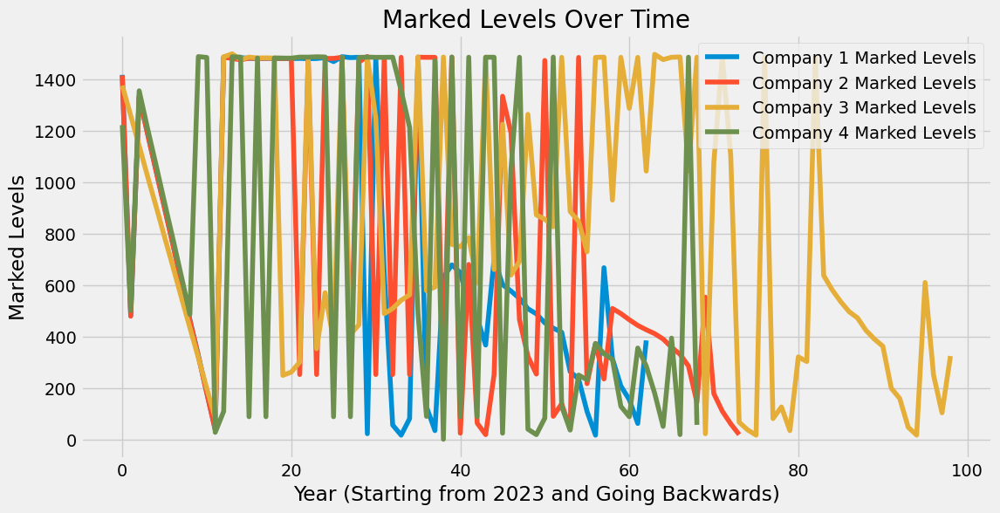

In [344]:
import matplotlib.pyplot as plt

# Assuming you have already created the DataFrame 'df' as shown in the previous

# Create a time series plot
plt.figure(figsize=(12, 6))
plt.plot(df['Company 1 Marked Levels'], label='Company 1 Marked Levels')
plt.plot(df['Company 2 Marked Levels'], label='Company 2 Marked Levels')
plt.plot(df['Company 3 Marked Levels'], label='Company 3 Marked Levels')
plt.plot(df['Company 4 Marked Levels'], label='Company 4 Marked Levels')

# Set labels and legend
plt.xlabel('Year (Starting from 2023 and Going Backwards)')
plt.ylabel('Marked Levels')
plt.title('Marked Levels Over Time')
plt.legend()

plt.show()


In [345]:
# Add a 'Year' column
df['Year'] = range(2023, 2023 - len(df), -1)


In [346]:
df

,Company 1 Marked Levels,Company 2 Marked Levels,Company 3 Marked Levels,Company 4 Marked Levels,Year
0,1417.411160,1415.411160,1375.775100,1222.000000,2023
1,481.655914,479.655914,1259.284708,502.000000,2022
2,1334.970085,1332.970085,1141.810989,1355.509929,2021
3,1189.027122,1187.027122,1022.027122,1207.947577,2020
4,1045.941068,1043.941068,906.592199,1066.655142,2019
...,...,...,...,...,...
94,NaN,NaN,17.597701,NaN,1929
95,NaN,NaN,610.639517,NaN,1928
96,NaN,NaN,250.950307,NaN,1927
97,NaN,NaN,104.310173,NaN,1926


In [347]:
# Import the necessary libraries
from sklearn.linear_model import LinearRegression

# Create a list to store the DataFrames for each company's predictions
predictions_dfs = []

# Iterate through each company
for company_num in range(1, 5):
    company_name = f'Company {company_num} Marked Levels'
    
    # Filter the data for the specific company
    company_data = df[['Year', company_name]]
    
    # Remove rows with missing values (NaN)
    company_data = company_data.dropna()
    
    # Create and fit a linear regression model
    model = LinearRegression()
    
    # Check if there are still rows left for modeling
    if len(company_data) > 1:
        model.fit(company_data[['Year']], company_data[company_name])
    
        # Predict the marked level for 2024
        predicted_marked_level = model.predict([[2024]])[0]
    else:
        predicted_marked_level = "Insufficient data"
    
    # Create a DataFrame for the prediction
    prediction_df = pd.DataFrame({'Company': [company_name], 'Predicted Marked Level for 2024': [predicted_marked_level]})
    
    # Append the result to the list of DataFrames
    predictions_dfs.append(prediction_df)

# Concatenate the list of DataFrames into the final predictions DataFrame
predictions_df = pd.concat(predictions_dfs, ignore_index=True)

# Display the predictions
print(predictions_df)


                   Company  Predicted Marked Level for 2024
0  Company 1 Marked Levels                      1285.018384
1  Company 2 Marked Levels                      1231.368011
2  Company 3 Marked Levels                      1067.791615
3  Company 4 Marked Levels                      1249.924749


C:\Users\vedan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\vedan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\vedan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\vedan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:465: UserWa

In [350]:
from sklearn.metrics import mean_squared_error, r2_score

# Iterate through each company
for company_num in range(1, 5):
    company_name = f'Company {company_num} Marked Levels'
    
    # Filter the data for the specific company
    company_data = df[['Year', company_name]]
    company_data = company_data.dropna()
    
    # Create and fit a linear regression model
    model = LinearRegression()
    
    # Check if there are still rows left for modeling
    if len(company_data) > 1:
        model.fit(company_data[['Year']], company_data[company_name])
        predicted_marked_levels = model.predict(company_data[['Year']])
        
        # Calculate the metrics
        mse = mean_squared_error(company_data[company_name], predicted_marked_levels)
        r2 = r2_score(company_data[company_name], predicted_marked_levels)
        
        # Print the metrics
        print(f'Metrics for {company_name}:')
        print(f'Mean Squared Error (MSE): {mse}')
        print(f'Coefficient of Determination (R-squared): {r2}')
        print()
    else:
        print(f'Insufficient data for {company_name}')


Metrics for Company 1 Marked Levels:
Mean Squared Error (MSE): 216268.66316558953
Coefficient of Determination (R-squared): 0.2852096594678911

Metrics for Company 2 Marked Levels:
Mean Squared Error (MSE): 255842.32694514186
Coefficient of Determination (R-squared): 0.22720957888951643

Metrics for Company 3 Marked Levels:
Mean Squared Error (MSE): 237815.21895202604
Coefficient of Determination (R-squared): 0.08230010398542709

Metrics for Company 4 Marked Levels:
Mean Squared Error (MSE): 329994.0957842441
Coefficient of Determination (R-squared): 0.16691835293908175



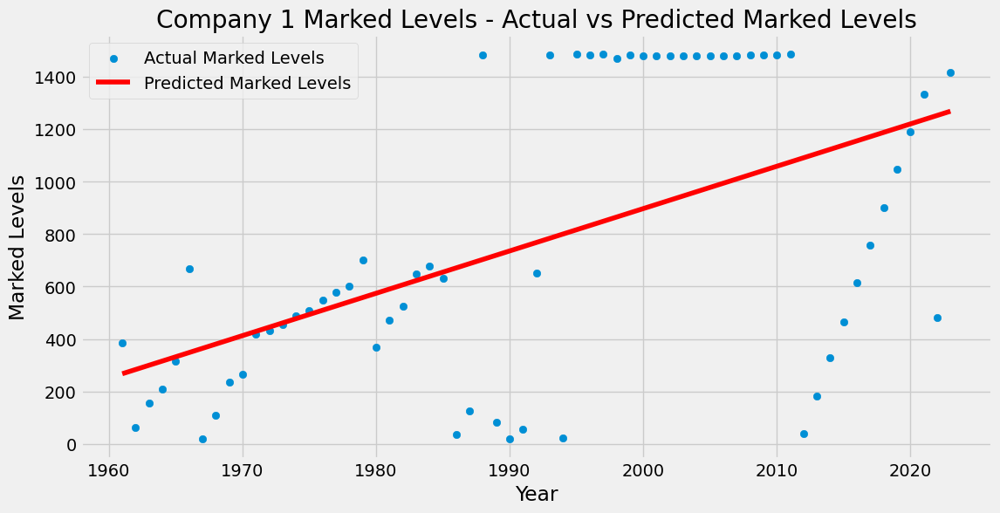

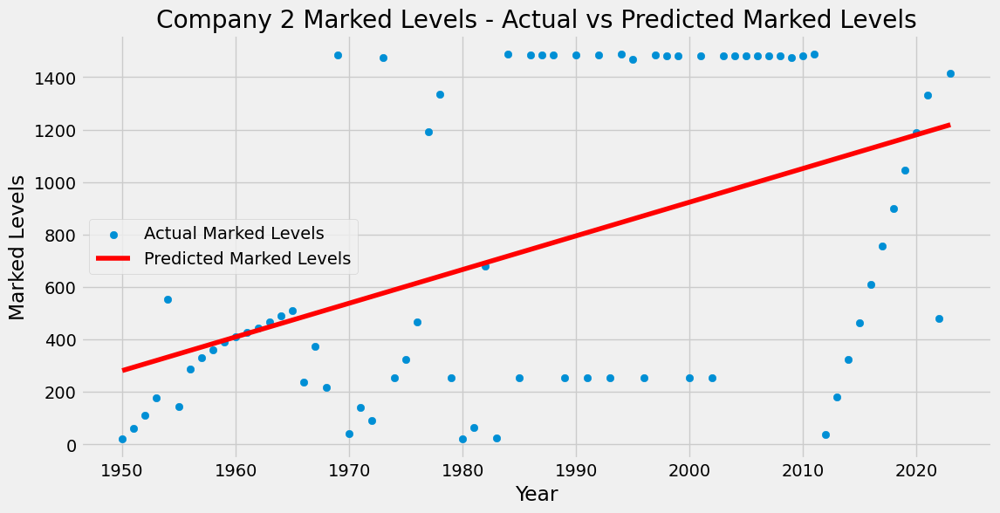

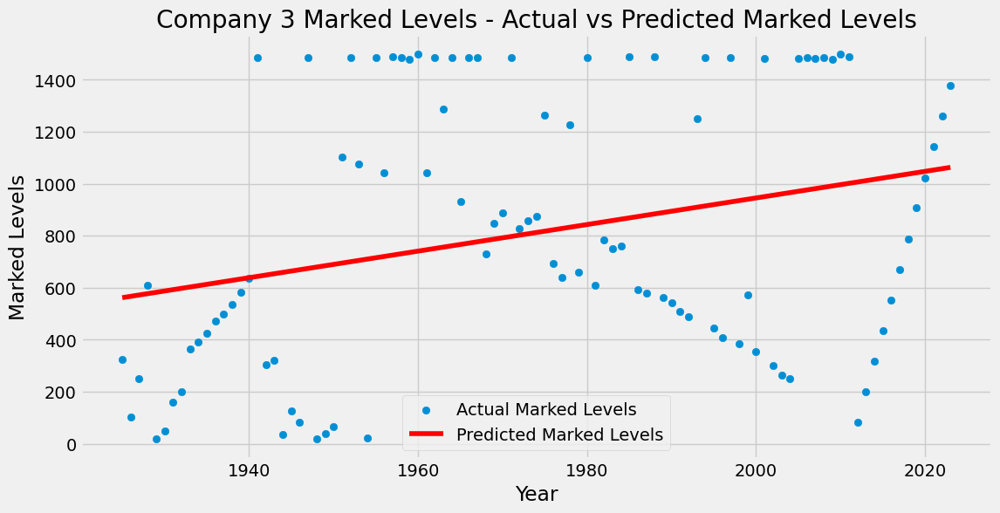

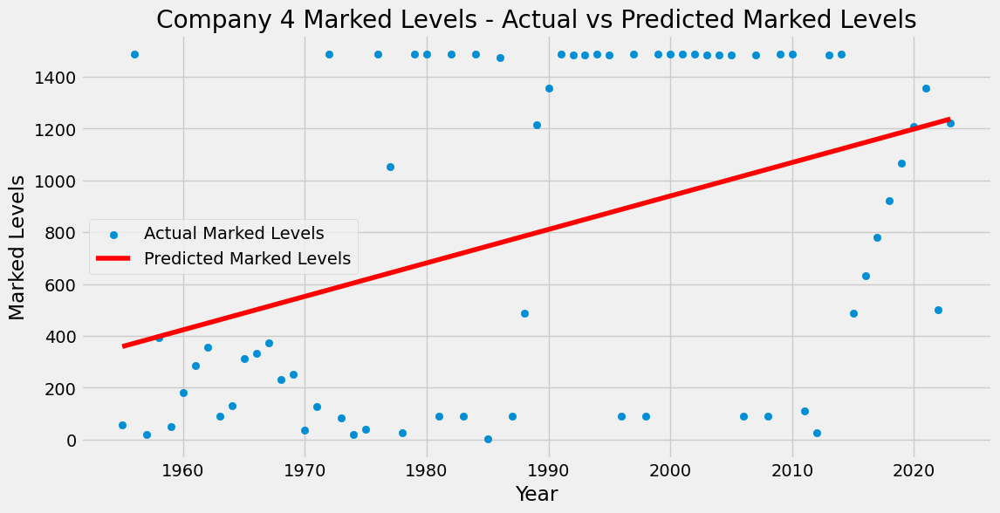

In [351]:
# Iterate through each company
for company_num in range(1, 5):
    company_name = f'Company {company_num} Marked Levels'
    
    # Filter the data for the specific company
    company_data = df[['Year', company_name]]
    company_data = company_data.dropna()
    
    # Create and fit a linear regression model
    model = LinearRegression()
    
    # Check if there are still rows left for modeling
    if len(company_data) > 1:
        model.fit(company_data[['Year']], company_data[company_name])
        predicted_marked_levels = model.predict(company_data[['Year']])
        
        # Create a plot to visualize the predicted values
        plt.figure(figsize=(12, 6))
        plt.scatter(company_data['Year'], company_data[company_name], label='Actual Marked Levels')
        plt.plot(company_data['Year'], predicted_marked_levels, color='red', label='Predicted Marked Levels')
        
        # Set labels and legend
        plt.xlabel('Year')
        plt.ylabel('Marked Levels')
        plt.title(f'{company_name} - Actual vs Predicted Marked Levels')
        plt.legend()
        
        plt.show()
    else:
        print(f'Insufficient data for {company_name}')


In [352]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression

# Assuming you have already created the DataFrame 'df' as shown in the previous response

# Reverse the order of rows to start from 2023 and go back in time
df = df[::-1]

# Create a list to store the DataFrames for each company's predictions
predictions_dfs = []

# Iterate through each company
for company_num in range(1, 5):
    company_name = f'Company {company_num} Marked Levels'
    
    # Filter the data for the specific company
    company_data = df[['Year', company_name]]
    
    # Remove rows with missing values (NaN)
    company_data = company_data.dropna()
    
    # Create and fit a linear regression model
    model = LinearRegression()
    
    # Check if there are still rows left for modeling
    if len(company_data) > 1:
        model.fit(company_data[['Year']], company_data[company_name])
        
        # Predict the marked levels for future years (starting from 2024)
        future_years = range(2024, 2030)  # Adjust the range as needed
        predicted_marked_levels = model.predict(pd.DataFrame({'Year': future_years}))
        
        # Create a DataFrame for the predictions
        predictions_df = pd.DataFrame({'Year': future_years, 'Predicted Marked Levels': predicted_marked_levels})
        
        # Append the result to the list of DataFrames
        predictions_dfs.append(predictions_df)
    else:
        print(f'Insufficient data for {company_name}')

# Iterate through each company's predictions and display the predicted values
for i, predictions_df in enumerate(predictions_dfs):
    company_name = f'Company {i+1} Marked Levels'
    
    print(f'Predicted values for {company_name}:')
    print(predictions_df)
    print()


Predicted values for Company 1 Marked Levels:
   Year  Predicted Marked Levels
0  2024              1285.018384
1  2025              1301.172916
2  2026              1317.327447
3  2027              1333.481979
4  2028              1349.636510
5  2029              1365.791042

Predicted values for Company 2 Marked Levels:
   Year  Predicted Marked Levels
0  2024              1231.368011
1  2025              1244.208076
2  2026              1257.048141
3  2027              1269.888205
4  2028              1282.728270
5  2029              1295.568335

Predicted values for Company 3 Marked Levels:
   Year  Predicted Marked Levels
0  2024              1067.791615
1  2025              1072.901925
2  2026              1078.012235
3  2027              1083.122546
4  2028              1088.232856
5  2029              1093.343166

Predicted values for Company 4 Marked Levels:
   Year  Predicted Marked Levels
0  2024              1249.924749
1  2025              1262.835411
2  2026              

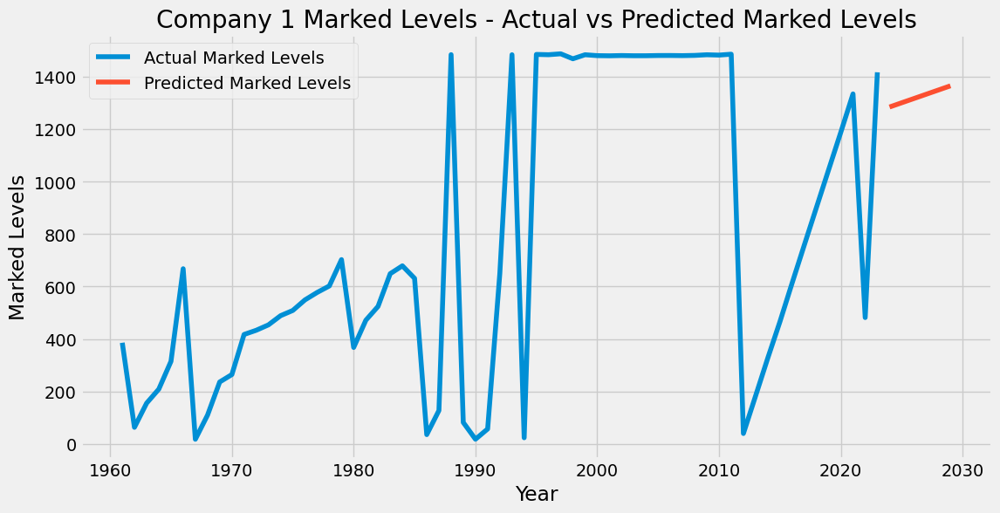

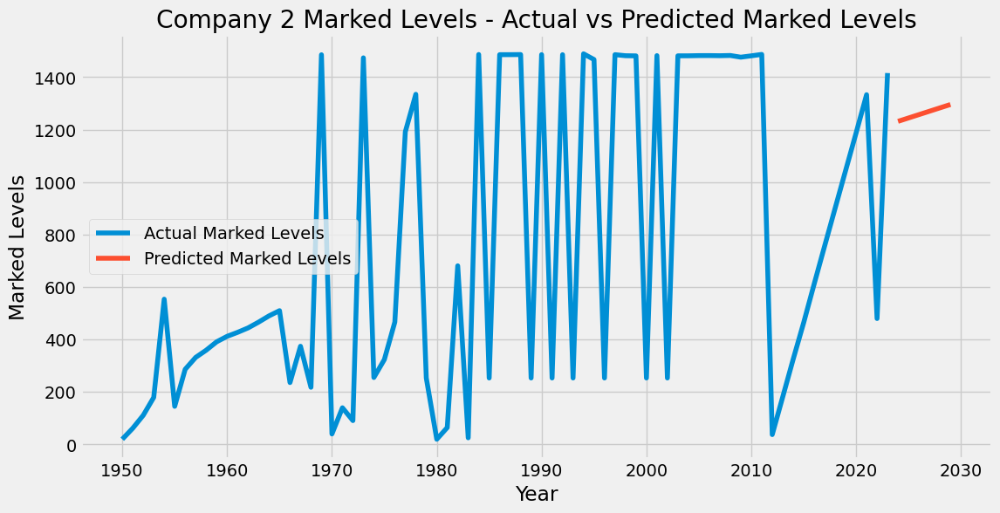

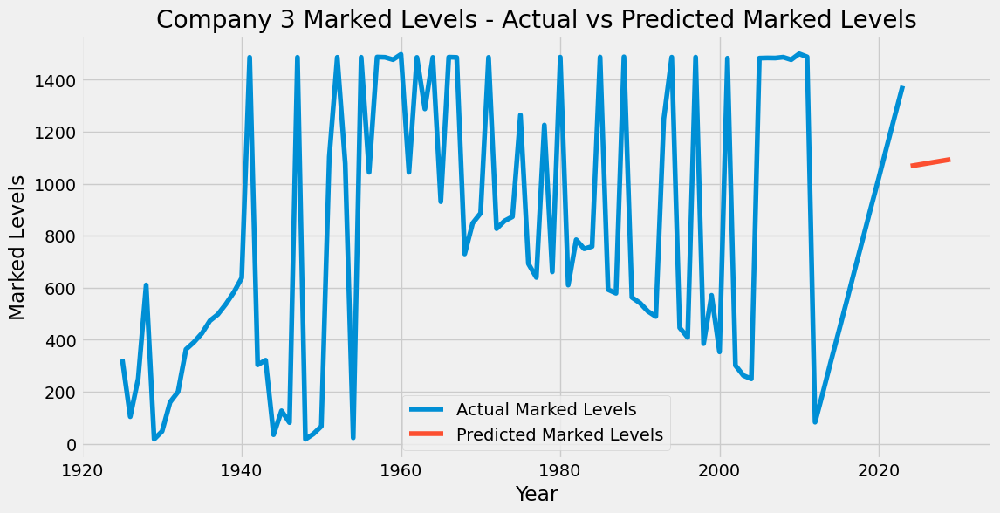

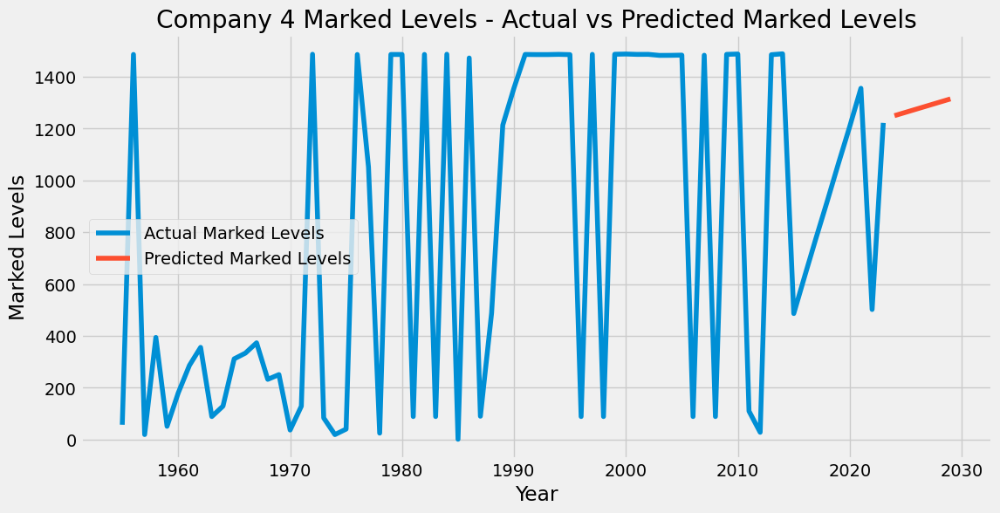

In [353]:
for i, predictions_df in enumerate(predictions_dfs):
    company_name = f'Company {i+1} Marked Levels'
    
    # Merge the original data with the predictions for visualization
    merged_data = pd.concat([df[['Year', company_name]], predictions_df[['Year', 'Predicted Marked Levels']]])
    
    # Create a stock graph
    plt.figure(figsize=(12, 6))
    plt.plot(merged_data['Year'], merged_data[company_name], label='Actual Marked Levels')
    plt.plot(merged_data['Year'], merged_data['Predicted Marked Levels'], label='Predicted Marked Levels')
    
    # Set labels and title
    plt.xlabel('Year')
    plt.ylabel('Marked Levels')
    plt.title(f'{company_name} - Actual vs Predicted Marked Levels')
    plt.legend()
    
    plt.show()